# benchmarking on omnipath


In [1]:
from scprint import scPrint
from scprint.tasks import GNInfer

from bengrn import BenGRN
import scanpy as sc

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils
import numpy as np
import joblib
%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:53: DeprecationWarning: jax.core.Shape is deprecated. Use Shape = Sequence[int | Any].
  Shape = jax.core.Shape
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:54: DeprecationWarning: jax.random.KeyArray is deprecated. Use jax.Array for annotations, and jax.dtypes.issubdtype(arr.dtype, jax.dtypes.prng_key) for runtime detection of typed prng keys (i.e. keys created with jax.random.key).
For more information, see https://jax.readthedocs.io/en/latest/jep/9263-typed-keys.html
  PRNGKey = jax.random.KeyArray
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_types.py:9: DeprecationWarning: jax.random.KeyArray is deprecated. Use jax.Array for annotations, and jax.dtypes.i

In [2]:
model = scPrint.load_from_checkpoint(
    '../data/temp/o2uniqsx/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
#    '../data/temp/vbd8bavn/epoch=19-step=100000.ckpt', precpt_gene_emb=None)
#    '../data/temp/1tghqqzx_dir/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
#    '/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint_scale/o2uniqsx/checkpoints/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
NUM_GENES = 5000
MAXCELLS = 1024

[d3graph] INFO> Created a temporary directory at /local/scratch/tmp/tmptj20071m


[d3graph] INFO> Writing /local/scratch/tmp/tmptj20071m/_remote_module_non_scriptable.py


RuntimeError caught: scPrint is not attached to a `Trainer`.



In [3]:
#CELLTYPES = [
#    'pigmented ciliary epithelial cell',
#    'non-pigmented ciliary epithelial cell',
#    'ciliary muscle cell',
#    'fibroblast',
#    'Schwann cell',
#    'macrophage',
#    'melanocyte',
#    'lymphocyte',
#    'blood vessel endothelial cell',
#    'pericyte'
#]
CELLTYPES = [
    "microglial cell",
    "retinal rod cell",
    "Mueller cell",
    "amacrine cell",
    "ON-bipolar cell",
    "rod bipolar cell",
    "retinal cone cell",
    "retina horizontal cell",
    "retinal ganglion cell",
    "astrocyte",
    ]

In [4]:
#adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad')
#adata = sc.read_h5ad('/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint/.lamindb/REIyQZE6OMZm1S3W2Dxi.h5ad')
adata = sc.read_h5ad('../data/gNNpgpo6gATjuxTE7CCp.h5ad')

adata.var["isTF"] = False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"] = True
adata

AnnData object with n_obs × n_vars = 51370 × 70116
    obs: 'biosample_id', 'donor_id', 'cell_type_ontology_term_id', 'organism_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'cell_type__custom', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'is_primary_data', 'age', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'uid', 'symbol', 'ncbi_gene_ids', 'biotype', 'desc

In [8]:
#model.normalization = "log"
model.organisms = ['NCBITaxon:9606','NCBITaxon:10090']

In [9]:
metrics = {}
clf_omni = None
celltype = CELLTYPES[1]
grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                    how="most var across",
                    preprocess="softmax",
                    head_agg='none',
                    filtration="none",
                    forward_mode="none",
                    num_genes=NUM_GENES,
                    max_cells=1024,
                    doplot=False,
                    batch_size=16,
                    )
grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)

> /home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py(190)predict()
    188         pdb.set_trace()
    189 
--> 190         with torch.no_grad(), torch.autocast(device_type=device, dtype=torch.float16):
    191             for batch in tqdm(dataloader):
    192                 gene_pos, expression, depth = (

    185         self.model.eval()
    186         device = self.model.device.type
    187         import pdb
    188         pdb.set_trace()
    189 
--> 190         with torch.no_grad(), torch.autocast(device_type=device, dtype=torch.float16):
    191             for batch in tqdm(dataloader):
    192                 gene_pos, expression, depth = (
    193                     batch["genes"].to(device),
    194                     batch["x"].to(device),
    195                     batch["depth"].to(device),

5000
5000


100%|██████████| 64/64 [02:07<00:00,  1.99s/it]



  0%|          | 0/8 [00:00<?, ?it/s]


 12%|█▎        | 1/8 [00:02<00:17,  2.56s/it]


 25%|██▌       | 2/8 [00:03<00:09,  1.52s/it]


 38%|███▊      | 3/8 [00:04<00:05,  1.19s/it]


 50%|█████     | 4/8 [00:04<00:04,  1.03s/it]


 62%|██████▎   | 5/8 [00:05<00:02,  1.05it/s]


 75%|███████▌  | 6/8 [00:06<00:01,  1.11it/s]


 88%|████████▊ | 7/8 [00:07<00:00,  1.16it/s]


100%|██████████| 8/8 [00:07<00:00,  1.56it/s]


100%|██████████| 8/8 [00:07<00:00,  1.05it/s]

avg link count: 512569600, sparsity: 1.0


base enrichment


too many genes for central computation


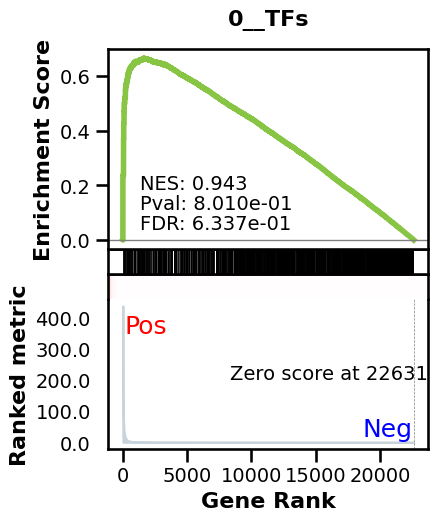

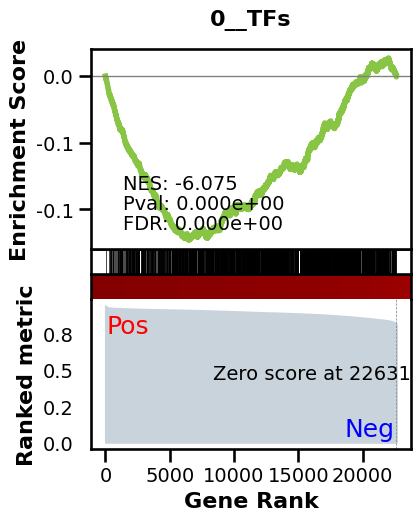

_________________________________________
TF specific enrichment


found some significant results for  46.42857142857143 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12333 genes
intersection pct: 0.5449363732767762


precision:  0.0006762732161909117 
recall:  1.0 
random precision: 0.0006763209284257213



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:36,  3.50it/s]


  2%|▏         | 2/128 [00:00<00:35,  3.50it/s]


  2%|▏         | 3/128 [00:00<00:35,  3.51it/s]


  3%|▎         | 4/128 [00:01<00:35,  3.51it/s]


  4%|▍         | 5/128 [00:01<00:35,  3.51it/s]


  5%|▍         | 6/128 [00:01<00:34,  3.51it/s]


  5%|▌         | 7/128 [00:01<00:34,  3.50it/s]


  6%|▋         | 8/128 [00:02<00:34,  3.51it/s]


  7%|▋         | 9/128 [00:02<00:33,  3.51it/s]


  8%|▊         | 10/128 [00:02<00:33,  3.51it/s]


  9%|▊         | 11/128 [00:03<00:33,  3.51it/s]


  9%|▉         | 12/128 [00:03<00:33,  3.51it/s]


 10%|█         | 13/128 [00:03<00:32,  3.51it/s]


 11%|█         | 14/128 [00:03<00:32,  3.51it/s]


 12%|█▏        | 15/128 [00:04<00:32,  3.51it/s]


 12%|█▎        | 16/128 [00:04<00:31,  3.51it/s]


 13%|█▎        | 17/128 [00:04<00:31,  3.51it/s]


 14%|█▍        | 18/128 [00:05<00:31,  3.51it/s]


 15%|█▍        | 19/128 [00:05<00:31,  3.51it/s]


 16%|█▌        | 20/128 [00:05<00:30,  3.51it/s]


 16%|█▋        | 21/128 [00:05<00:30,  3.51it/s]


 17%|█▋        | 22/128 [00:06<00:30,  3.51it/s]


 18%|█▊        | 23/128 [00:06<00:29,  3.51it/s]


 19%|█▉        | 24/128 [00:06<00:29,  3.51it/s]


 20%|█▉        | 25/128 [00:07<00:29,  3.51it/s]


 20%|██        | 26/128 [00:07<00:29,  3.51it/s]


 21%|██        | 27/128 [00:07<00:28,  3.51it/s]


 22%|██▏       | 28/128 [00:07<00:28,  3.52it/s]


 23%|██▎       | 29/128 [00:08<00:28,  3.52it/s]


 23%|██▎       | 30/128 [00:08<00:27,  3.52it/s]


 24%|██▍       | 31/128 [00:08<00:27,  3.52it/s]


 25%|██▌       | 32/128 [00:09<00:27,  3.52it/s]


 26%|██▌       | 33/128 [00:09<00:26,  3.52it/s]


 27%|██▋       | 34/128 [00:09<00:26,  3.52it/s]


 27%|██▋       | 35/128 [00:09<00:26,  3.52it/s]


 28%|██▊       | 36/128 [00:10<00:26,  3.52it/s]


 29%|██▉       | 37/128 [00:10<00:25,  3.51it/s]


 30%|██▉       | 38/128 [00:10<00:25,  3.52it/s]


 30%|███       | 39/128 [00:11<00:25,  3.51it/s]


 31%|███▏      | 40/128 [00:11<00:25,  3.52it/s]


 32%|███▏      | 41/128 [00:11<00:24,  3.51it/s]


 33%|███▎      | 42/128 [00:11<00:24,  3.51it/s]


 34%|███▎      | 43/128 [00:12<00:24,  3.52it/s]


 34%|███▍      | 44/128 [00:12<00:23,  3.52it/s]


 35%|███▌      | 45/128 [00:12<00:24,  3.39it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.39it/s]


 37%|███▋      | 47/128 [00:13<00:23,  3.43it/s]


 38%|███▊      | 48/128 [00:13<00:23,  3.45it/s]


 38%|███▊      | 49/128 [00:13<00:22,  3.47it/s]


 39%|███▉      | 50/128 [00:14<00:22,  3.44it/s]


 40%|███▉      | 51/128 [00:14<00:22,  3.43it/s]


 41%|████      | 52/128 [00:14<00:21,  3.46it/s]


 41%|████▏     | 53/128 [00:15<00:21,  3.47it/s]


 42%|████▏     | 54/128 [00:15<00:21,  3.49it/s]


 43%|████▎     | 55/128 [00:15<00:20,  3.50it/s]


 44%|████▍     | 56/128 [00:16<00:20,  3.50it/s]


 45%|████▍     | 57/128 [00:16<00:20,  3.50it/s]


 45%|████▌     | 58/128 [00:16<00:19,  3.53it/s]


 46%|████▌     | 59/128 [00:16<00:19,  3.54it/s]


 47%|████▋     | 60/128 [00:17<00:19,  3.54it/s]


 48%|████▊     | 61/128 [00:17<00:18,  3.54it/s]


 48%|████▊     | 62/128 [00:17<00:18,  3.54it/s]


 49%|████▉     | 63/128 [00:17<00:18,  3.54it/s]


 50%|█████     | 64/128 [00:18<00:18,  3.54it/s]


 51%|█████     | 65/128 [00:18<00:17,  3.55it/s]


 52%|█████▏    | 66/128 [00:18<00:17,  3.55it/s]


 52%|█████▏    | 67/128 [00:19<00:17,  3.56it/s]


 53%|█████▎    | 68/128 [00:19<00:16,  3.56it/s]


 54%|█████▍    | 69/128 [00:19<00:16,  3.55it/s]


 55%|█████▍    | 70/128 [00:19<00:16,  3.55it/s]


 55%|█████▌    | 71/128 [00:20<00:16,  3.55it/s]


 56%|█████▋    | 72/128 [00:20<00:15,  3.55it/s]


 57%|█████▋    | 73/128 [00:20<00:15,  3.55it/s]


 58%|█████▊    | 74/128 [00:21<00:15,  3.55it/s]


 59%|█████▊    | 75/128 [00:21<00:14,  3.55it/s]


 59%|█████▉    | 76/128 [00:21<00:14,  3.56it/s]


 60%|██████    | 77/128 [00:21<00:14,  3.55it/s]


 61%|██████    | 78/128 [00:22<00:14,  3.55it/s]


 62%|██████▏   | 79/128 [00:22<00:13,  3.55it/s]


 62%|██████▎   | 80/128 [00:22<00:13,  3.54it/s]


 63%|██████▎   | 81/128 [00:23<00:13,  3.55it/s]


 64%|██████▍   | 82/128 [00:23<00:12,  3.55it/s]


 65%|██████▍   | 83/128 [00:23<00:12,  3.55it/s]


 66%|██████▌   | 84/128 [00:23<00:12,  3.54it/s]


 66%|██████▋   | 85/128 [00:24<00:12,  3.54it/s]


 67%|██████▋   | 86/128 [00:24<00:11,  3.55it/s]


 68%|██████▊   | 87/128 [00:24<00:11,  3.56it/s]


 69%|██████▉   | 88/128 [00:25<00:11,  3.56it/s]


 70%|██████▉   | 89/128 [00:25<00:10,  3.55it/s]


 70%|███████   | 90/128 [00:25<00:10,  3.56it/s]


 71%|███████   | 91/128 [00:25<00:10,  3.56it/s]


 72%|███████▏  | 92/128 [00:26<00:10,  3.56it/s]


 73%|███████▎  | 93/128 [00:26<00:09,  3.56it/s]


 73%|███████▎  | 94/128 [00:26<00:09,  3.56it/s]


 74%|███████▍  | 95/128 [00:26<00:09,  3.56it/s]


 75%|███████▌  | 96/128 [00:27<00:09,  3.55it/s]


 76%|███████▌  | 97/128 [00:27<00:08,  3.56it/s]


 77%|███████▋  | 98/128 [00:27<00:08,  3.56it/s]


 77%|███████▋  | 99/128 [00:28<00:08,  3.56it/s]


 78%|███████▊  | 100/128 [00:28<00:07,  3.56it/s]


 79%|███████▉  | 101/128 [00:28<00:07,  3.55it/s]


 80%|███████▉  | 102/128 [00:28<00:07,  3.56it/s]


 80%|████████  | 103/128 [00:29<00:07,  3.56it/s]


 81%|████████▏ | 104/128 [00:29<00:06,  3.56it/s]


 82%|████████▏ | 105/128 [00:29<00:06,  3.56it/s]


 83%|████████▎ | 106/128 [00:30<00:06,  3.56it/s]


 84%|████████▎ | 107/128 [00:30<00:05,  3.56it/s]


 84%|████████▍ | 108/128 [00:30<00:05,  3.55it/s]


 85%|████████▌ | 109/128 [00:30<00:05,  3.55it/s]


 86%|████████▌ | 110/128 [00:31<00:05,  3.55it/s]


 87%|████████▋ | 111/128 [00:31<00:04,  3.56it/s]


 88%|████████▊ | 112/128 [00:31<00:04,  3.56it/s]


 88%|████████▊ | 113/128 [00:32<00:04,  3.55it/s]


 89%|████████▉ | 114/128 [00:32<00:03,  3.56it/s]


 90%|████████▉ | 115/128 [00:32<00:03,  3.56it/s]


 91%|█████████ | 116/128 [00:32<00:03,  3.56it/s]


 91%|█████████▏| 117/128 [00:33<00:03,  3.56it/s]


 92%|█████████▏| 118/128 [00:33<00:02,  3.56it/s]


 93%|█████████▎| 119/128 [00:33<00:02,  3.56it/s]


 94%|█████████▍| 120/128 [00:34<00:02,  3.56it/s]


 95%|█████████▍| 121/128 [00:34<00:01,  3.56it/s]


 95%|█████████▌| 122/128 [00:34<00:01,  3.55it/s]


 96%|█████████▌| 123/128 [00:34<00:01,  3.56it/s]


 97%|█████████▋| 124/128 [00:35<00:01,  3.56it/s]


 98%|█████████▊| 125/128 [00:35<00:00,  3.56it/s]


 98%|█████████▊| 126/128 [00:35<00:00,  3.56it/s]


 99%|█████████▉| 127/128 [00:35<00:00,  3.56it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:36<00:00,  3.55it/s]


100%|██████████| 128/128 [00:36<00:00,  3.53it/s]

Average Precision (AP):  0.0007019291579147765
Area Under Precision-Recall Curve (AUPRC):  0.0007018842190134056


EPR: 1.1754539575664378


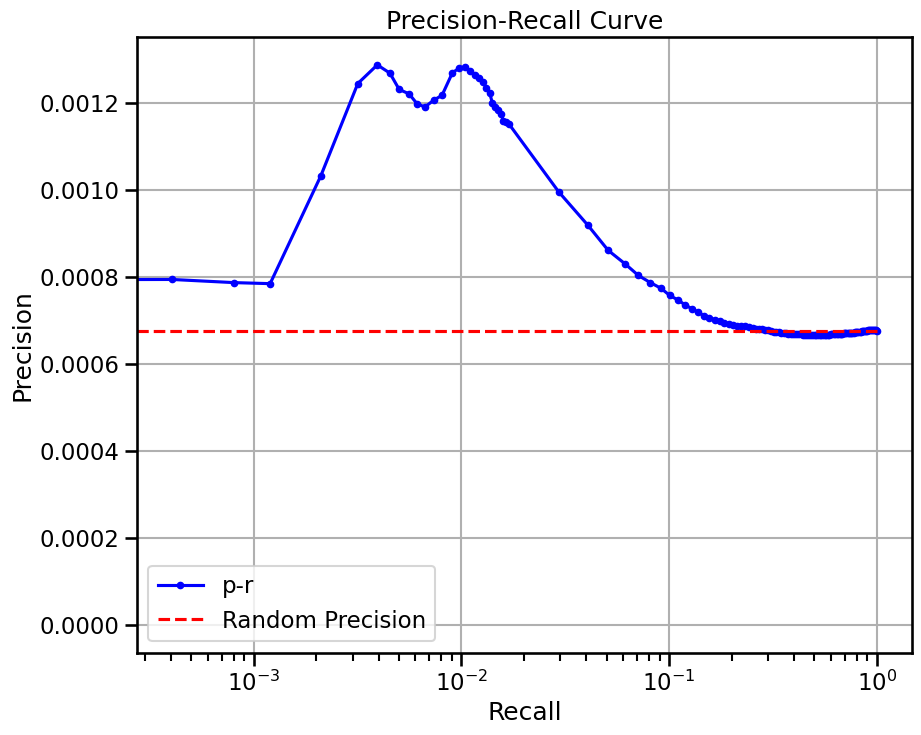


  0%|          | 0/15 [00:00<?, ?it/s]


  7%|▋         | 1/15 [00:02<00:33,  2.36s/it]


 13%|█▎        | 2/15 [00:03<00:21,  1.69s/it]


 20%|██        | 3/15 [00:04<00:17,  1.45s/it]


 27%|██▋       | 4/15 [00:06<00:15,  1.41s/it]


 33%|███▎      | 5/15 [00:07<00:13,  1.39s/it]


 40%|████      | 6/15 [00:08<00:12,  1.38s/it]


 47%|████▋     | 7/15 [00:10<00:10,  1.37s/it]


 53%|█████▎    | 8/15 [00:11<00:09,  1.36s/it]


 60%|██████    | 9/15 [00:12<00:08,  1.36s/it]


 67%|██████▋   | 10/15 [00:14<00:06,  1.36s/it]


 73%|███████▎  | 11/15 [00:15<00:05,  1.36s/it]


 80%|████████  | 12/15 [00:16<00:04,  1.36s/it]


 87%|████████▋ | 13/15 [00:18<00:02,  1.36s/it]


 93%|█████████▎| 14/15 [00:19<00:01,  1.36s/it]


100%|██████████| 15/15 [00:20<00:00,  1.09s/it]


100%|██████████| 15/15 [00:20<00:00,  1.36s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


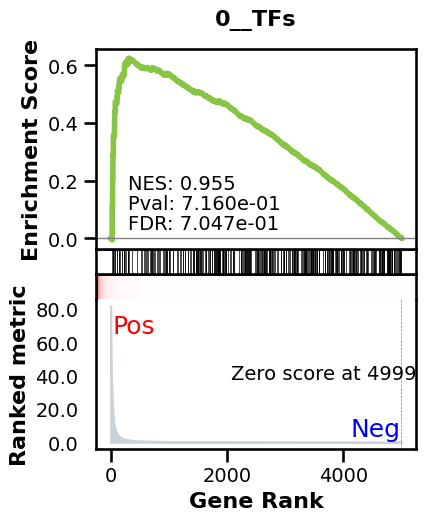

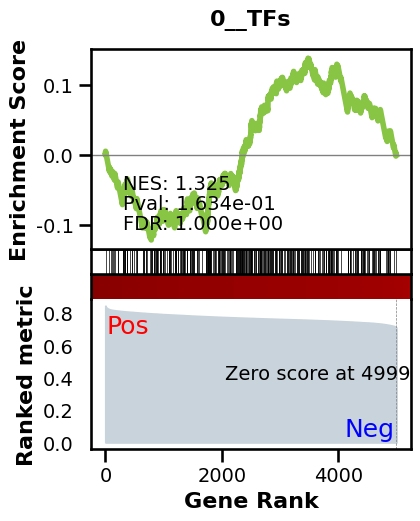

_________________________________________
TF specific enrichment


found some significant results for  10.606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.0018330143823302558 
recall:  1.0 
random precision: 0.0018335017565345446



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 47.51it/s]


  8%|▊         | 10/128 [00:00<00:02, 47.49it/s]


 12%|█▏        | 15/128 [00:00<00:02, 47.41it/s]


 16%|█▌        | 20/128 [00:00<00:02, 47.42it/s]


 20%|█▉        | 25/128 [00:00<00:02, 47.41it/s]


 23%|██▎       | 30/128 [00:00<00:02, 47.48it/s]


 27%|██▋       | 35/128 [00:00<00:01, 47.49it/s]


 31%|███▏      | 40/128 [00:00<00:01, 47.50it/s]


 35%|███▌      | 45/128 [00:00<00:01, 47.48it/s]


 39%|███▉      | 50/128 [00:01<00:01, 47.47it/s]


 43%|████▎     | 55/128 [00:01<00:01, 47.40it/s]


 47%|████▋     | 60/128 [00:01<00:01, 47.34it/s]


 51%|█████     | 65/128 [00:01<00:01, 47.37it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 47.43it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 47.42it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 47.46it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 47.48it/s]


 70%|███████   | 90/128 [00:01<00:00, 47.46it/s]


 74%|███████▍  | 95/128 [00:02<00:00, 47.50it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 47.52it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 47.46it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 47.47it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 47.36it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 46.91it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 47.05it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 47.35it/s]

Average Precision (AP):  0.0019831790741082485
Area Under Precision-Recall Curve (AUPRC):  0.0019823542894852903
EPR: 2.132222350114667


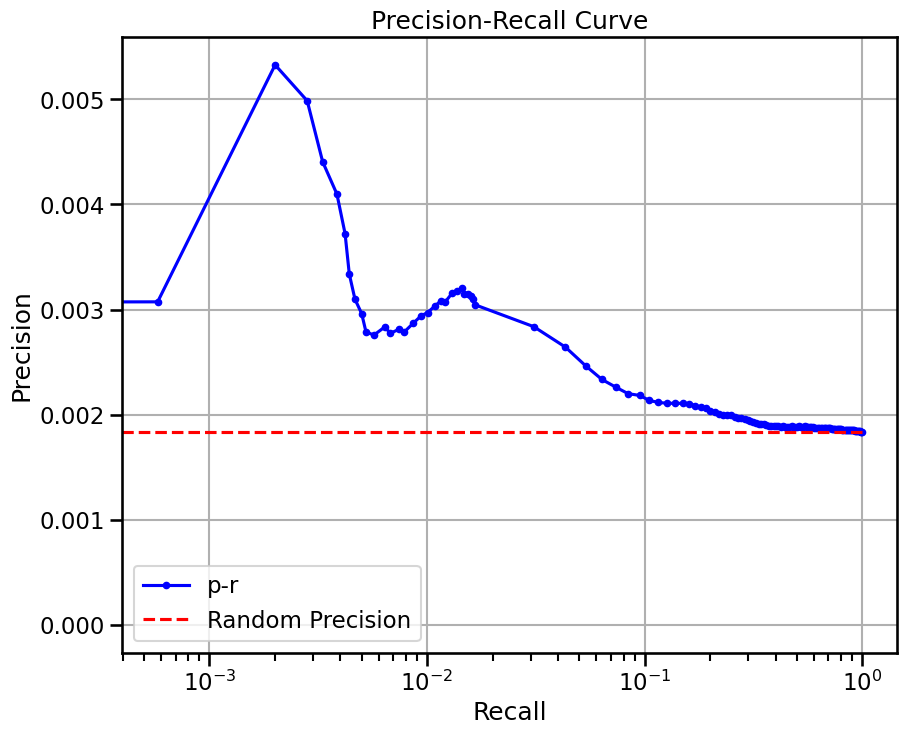

(230, 5000) microglial cell
base enrichment


Top central genes: []


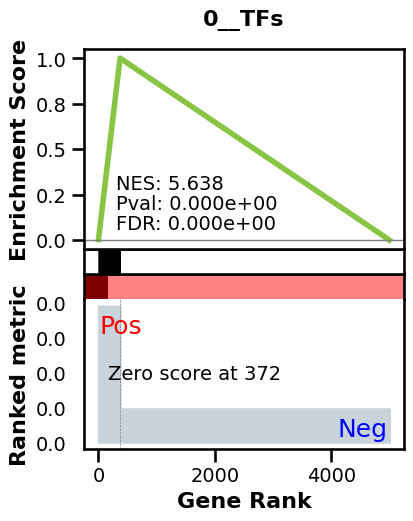

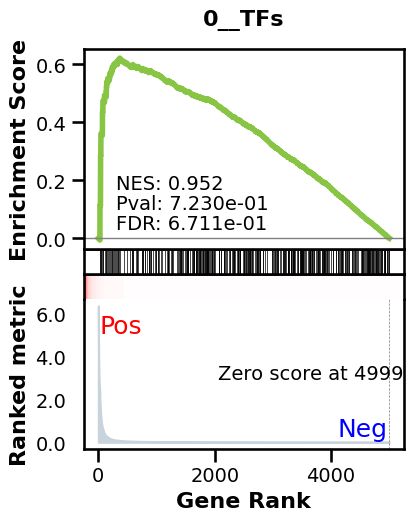

_________________________________________
TF specific enrichment


found some significant results for  4.545454545454546 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.009222253494699316 
recall:  0.4547066533035232 
random precision: 0.0018335017565345446



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 46.52it/s]


  8%|▊         | 10/128 [00:00<00:02, 46.38it/s]


 12%|█▏        | 15/128 [00:00<00:02, 46.36it/s]


 16%|█▌        | 20/128 [00:00<00:02, 46.39it/s]


 20%|█▉        | 25/128 [00:00<00:02, 46.38it/s]


 23%|██▎       | 30/128 [00:00<00:02, 46.43it/s]


 27%|██▋       | 35/128 [00:00<00:02, 46.47it/s]


 31%|███▏      | 40/128 [00:00<00:01, 46.45it/s]


 35%|███▌      | 45/128 [00:00<00:01, 46.47it/s]


 39%|███▉      | 50/128 [00:01<00:01, 46.42it/s]


 43%|████▎     | 55/128 [00:01<00:01, 46.42it/s]


 47%|████▋     | 60/128 [00:01<00:01, 46.43it/s]


 51%|█████     | 65/128 [00:01<00:01, 46.44it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 46.42it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 46.40it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 46.37it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 46.39it/s]


 70%|███████   | 90/128 [00:01<00:00, 46.42it/s]


 74%|███████▍  | 95/128 [00:02<00:00, 46.45it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 46.43it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 46.35it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 46.39it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 46.39it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 46.38it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 46.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 46.39it/s]

Average Precision (AP):  0.006552265347175383
Area Under Precision-Recall Curve (AUPRC):  0.00584281816691655
EPR: 8.844206124953837


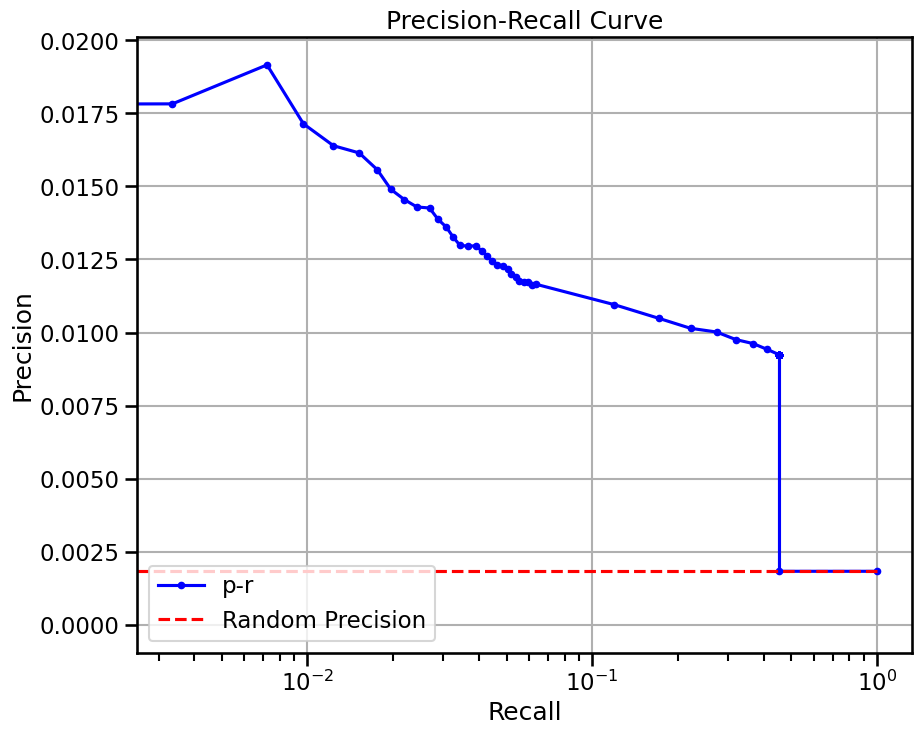

true elem 25942 ...


doing classification....


metrics {'used_heads': 21, 'precision': 0.0018369357812620891, 'random_precision': 0.0018369357812620891, 'recall': 1.0, 'predicted_true': 5661058.0, 'number_of_true': 10399.0}


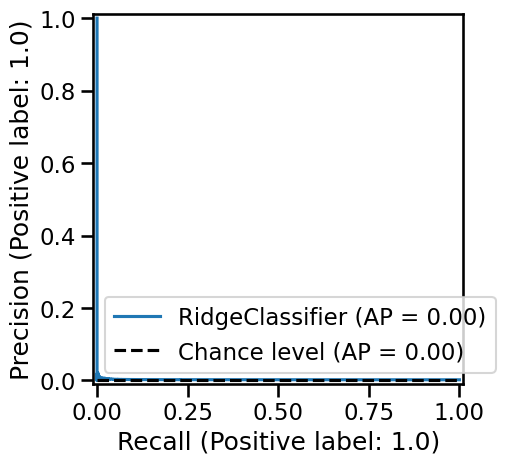

base enrichment


Top central genes: []
The DataFrame contains only the same values.


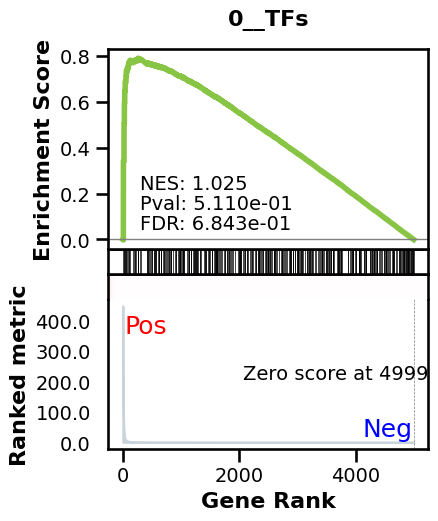

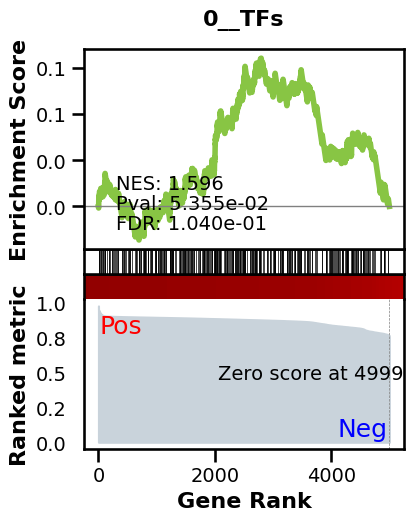

_________________________________________
TF specific enrichment


found some significant results for  15.151515151515152 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.0018330143823302558 
recall:  1.0 
random precision: 0.0018335017565345446



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 47.88it/s]


  8%|▊         | 10/128 [00:00<00:02, 47.67it/s]


 12%|█▏        | 15/128 [00:00<00:02, 47.60it/s]


 16%|█▌        | 20/128 [00:00<00:02, 47.65it/s]


 20%|█▉        | 25/128 [00:00<00:02, 47.67it/s]


 23%|██▎       | 30/128 [00:00<00:02, 47.69it/s]


 27%|██▋       | 35/128 [00:00<00:01, 47.71it/s]


 31%|███▏      | 40/128 [00:00<00:01, 47.71it/s]


 35%|███▌      | 45/128 [00:00<00:01, 47.69it/s]


 39%|███▉      | 50/128 [00:01<00:01, 47.66it/s]


 43%|████▎     | 55/128 [00:01<00:01, 47.63it/s]


 47%|████▋     | 60/128 [00:01<00:01, 47.54it/s]


 51%|█████     | 65/128 [00:01<00:01, 47.59it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 47.62it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 47.65it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 47.70it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 47.70it/s]


 70%|███████   | 90/128 [00:01<00:00, 47.73it/s]


 74%|███████▍  | 95/128 [00:01<00:00, 47.73it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 47.61it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 47.62it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 47.60it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 47.64it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 47.62it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 47.66it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 47.64it/s]

Average Precision (AP):  0.0021265419395442267
Area Under Precision-Recall Curve (AUPRC):  0.0021207057750094287


EPR: 4.752588516662135


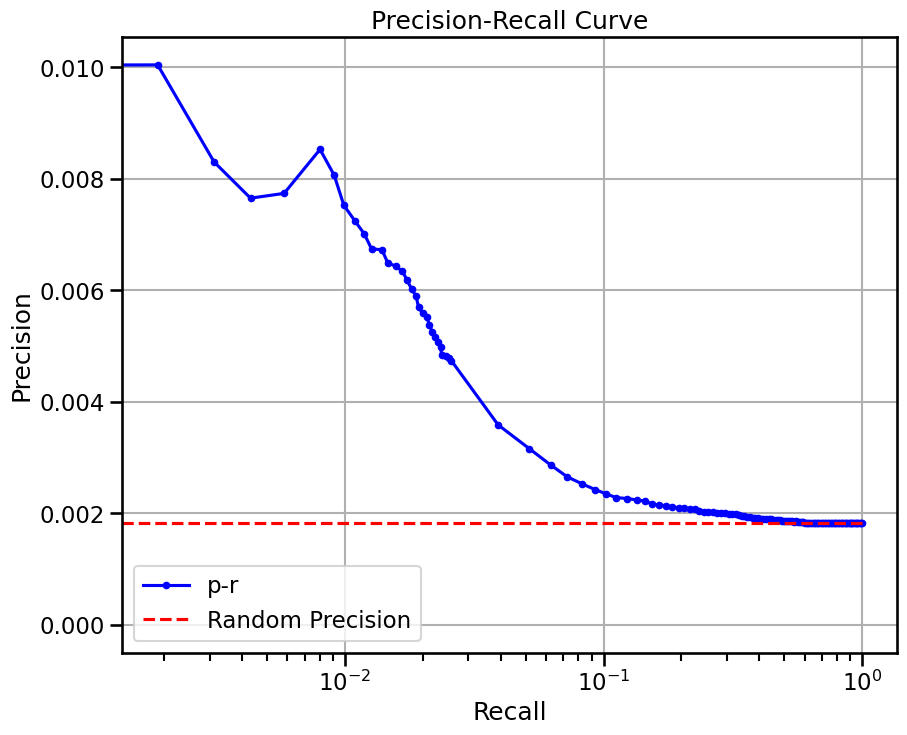

base enrichment


Top central genes: []


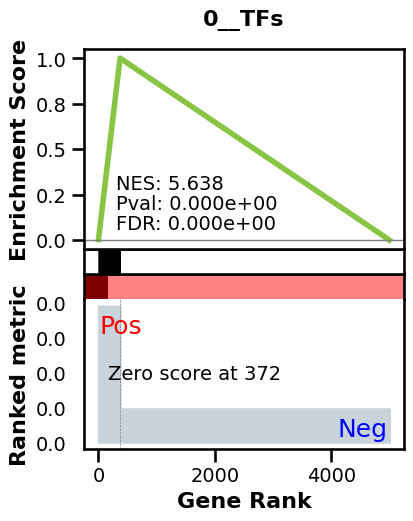

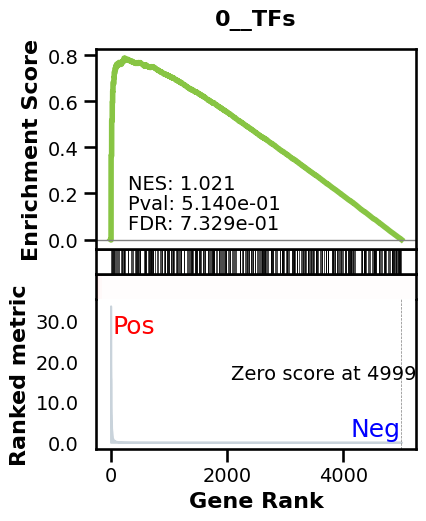

_________________________________________
TF specific enrichment


found some significant results for  6.0606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.009222253494699316 
recall:  0.4547066533035232 
random precision: 0.0018335017565345446



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 45.29it/s]


  8%|▊         | 10/128 [00:00<00:02, 45.19it/s]


 12%|█▏        | 15/128 [00:00<00:02, 45.04it/s]


 16%|█▌        | 20/128 [00:00<00:02, 45.07it/s]


 20%|█▉        | 25/128 [00:00<00:02, 45.06it/s]


 23%|██▎       | 30/128 [00:00<00:02, 45.06it/s]


 27%|██▋       | 35/128 [00:00<00:02, 45.08it/s]


 31%|███▏      | 40/128 [00:00<00:01, 45.06it/s]


 35%|███▌      | 45/128 [00:00<00:01, 45.05it/s]


 39%|███▉      | 50/128 [00:01<00:01, 45.03it/s]


 43%|████▎     | 55/128 [00:01<00:01, 44.96it/s]


 47%|████▋     | 60/128 [00:01<00:01, 44.92it/s]


 51%|█████     | 65/128 [00:01<00:01, 44.92it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 44.96it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 44.97it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 44.99it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 44.98it/s]


 70%|███████   | 90/128 [00:01<00:00, 44.99it/s]


 74%|███████▍  | 95/128 [00:02<00:00, 44.99it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 44.91it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 44.90it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 44.92it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 44.97it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 44.91it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 44.96it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 44.97it/s]

Average Precision (AP):  0.006823557370698658
Area Under Precision-Recall Curve (AUPRC):  0.0059121090990055785
EPR: 10.957463899219226


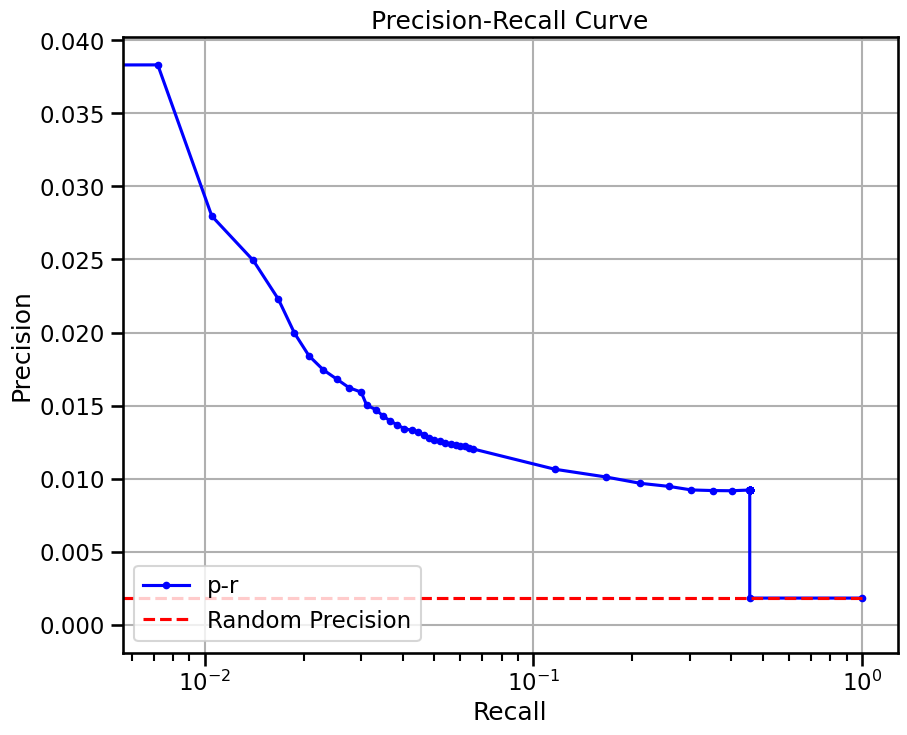


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:09,  2.24s/it]


  6%|▋         | 2/32 [00:03<00:41,  1.40s/it]


  9%|▉         | 3/32 [00:03<00:32,  1.12s/it]


 12%|█▎        | 4/32 [00:04<00:27,  1.01it/s]


 16%|█▌        | 5/32 [00:05<00:24,  1.09it/s]


 19%|█▉        | 6/32 [00:06<00:25,  1.03it/s]


 22%|██▏       | 7/32 [00:07<00:28,  1.14s/it]


 25%|██▌       | 8/32 [00:08<00:25,  1.08s/it]


 28%|██▊       | 9/32 [00:09<00:23,  1.04s/it]


 31%|███▏      | 10/32 [00:10<00:22,  1.01s/it]


 34%|███▍      | 11/32 [00:11<00:20,  1.01it/s]


 38%|███▊      | 12/32 [00:12<00:19,  1.02it/s]


 41%|████      | 13/32 [00:13<00:18,  1.04it/s]


 44%|████▍     | 14/32 [00:14<00:17,  1.05it/s]


 47%|████▋     | 15/32 [00:15<00:16,  1.06it/s]


 50%|█████     | 16/32 [00:16<00:15,  1.06it/s]


 53%|█████▎    | 17/32 [00:17<00:14,  1.06it/s]


 56%|█████▋    | 18/32 [00:18<00:13,  1.07it/s]


 59%|█████▉    | 19/32 [00:19<00:12,  1.07it/s]


 62%|██████▎   | 20/32 [00:20<00:11,  1.07it/s]


 66%|██████▌   | 21/32 [00:21<00:10,  1.07it/s]


 69%|██████▉   | 22/32 [00:22<00:09,  1.07it/s]


 72%|███████▏  | 23/32 [00:22<00:08,  1.07it/s]


 75%|███████▌  | 24/32 [00:23<00:07,  1.07it/s]


 78%|███████▊  | 25/32 [00:24<00:06,  1.08it/s]


 81%|████████▏ | 26/32 [00:25<00:05,  1.08it/s]


 84%|████████▍ | 27/32 [00:26<00:04,  1.08it/s]


 88%|████████▊ | 28/32 [00:27<00:03,  1.08it/s]


 91%|█████████ | 29/32 [00:28<00:02,  1.08it/s]


 94%|█████████▍| 30/32 [00:29<00:01,  1.08it/s]


 97%|█████████▋| 31/32 [00:30<00:00,  1.08it/s]


100%|██████████| 32/32 [00:31<00:00,  1.08it/s]


100%|██████████| 32/32 [00:31<00:00,  1.02it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


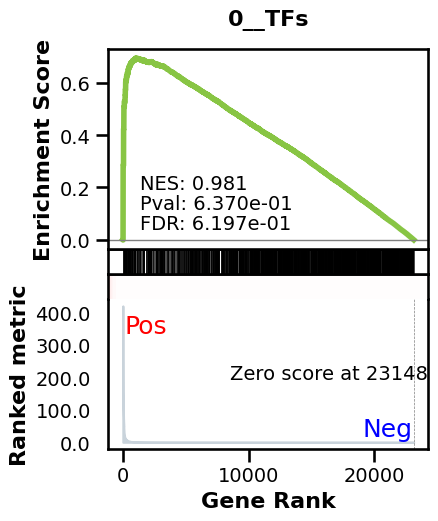

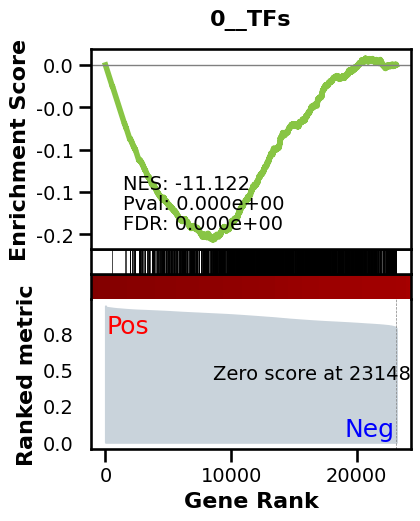

_________________________________________
TF specific enrichment


found some significant results for  42.857142857142854 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:37,  3.35it/s]


  2%|▏         | 2/128 [00:00<00:37,  3.35it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.35it/s]


  3%|▎         | 4/128 [00:01<00:37,  3.35it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.35it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.34it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.35it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.35it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.35it/s]


  8%|▊         | 10/128 [00:02<00:35,  3.35it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.35it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.35it/s]


 10%|█         | 13/128 [00:03<00:34,  3.35it/s]


 11%|█         | 14/128 [00:04<00:34,  3.35it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.35it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.35it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.35it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.35it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.35it/s]


 16%|█▌        | 20/128 [00:05<00:32,  3.35it/s]


 16%|█▋        | 21/128 [00:06<00:31,  3.35it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.35it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.34it/s]


 19%|█▉        | 24/128 [00:07<00:31,  3.35it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.34it/s]


 20%|██        | 26/128 [00:07<00:30,  3.33it/s]


 21%|██        | 27/128 [00:08<00:30,  3.33it/s]


 22%|██▏       | 28/128 [00:08<00:30,  3.32it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.32it/s]


 23%|██▎       | 30/128 [00:08<00:29,  3.32it/s]


 24%|██▍       | 31/128 [00:09<00:29,  3.32it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.32it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.32it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.32it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.32it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.32it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.32it/s]


 30%|██▉       | 38/128 [00:11<00:27,  3.33it/s]


 30%|███       | 39/128 [00:11<00:26,  3.32it/s]


 31%|███▏      | 40/128 [00:11<00:26,  3.32it/s]


 32%|███▏      | 41/128 [00:12<00:26,  3.32it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.32it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.32it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.32it/s]


 35%|███▌      | 45/128 [00:13<00:25,  3.32it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.32it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.32it/s]


 38%|███▊      | 48/128 [00:14<00:24,  3.32it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.32it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.33it/s]


 40%|███▉      | 51/128 [00:15<00:23,  3.33it/s]


 41%|████      | 52/128 [00:15<00:22,  3.33it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.32it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.32it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.33it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.32it/s]


 45%|████▍     | 57/128 [00:17<00:21,  3.32it/s]


 45%|████▌     | 58/128 [00:17<00:21,  3.31it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.31it/s]


 47%|████▋     | 60/128 [00:18<00:20,  3.31it/s]


 48%|████▊     | 61/128 [00:18<00:20,  3.32it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.32it/s]


 49%|████▉     | 63/128 [00:18<00:19,  3.32it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.32it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.32it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.32it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.32it/s]


 53%|█████▎    | 68/128 [00:20<00:18,  3.32it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.32it/s]


 55%|█████▍    | 70/128 [00:21<00:17,  3.32it/s]


 55%|█████▌    | 71/128 [00:21<00:17,  3.32it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.32it/s]


 57%|█████▋    | 73/128 [00:21<00:16,  3.32it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.31it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.32it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.32it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.32it/s]


 61%|██████    | 78/128 [00:23<00:15,  3.32it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.32it/s]


 62%|██████▎   | 80/128 [00:24<00:14,  3.32it/s]


 63%|██████▎   | 81/128 [00:24<00:14,  3.32it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.32it/s]


 65%|██████▍   | 83/128 [00:24<00:13,  3.32it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.32it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.31it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.31it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.32it/s]


 69%|██████▉   | 88/128 [00:26<00:12,  3.32it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.32it/s]


 70%|███████   | 90/128 [00:27<00:11,  3.32it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.32it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.32it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.32it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.32it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.32it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.32it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.32it/s]


 77%|███████▋  | 98/128 [00:29<00:09,  3.32it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.32it/s]


 78%|███████▊  | 100/128 [00:30<00:08,  3.32it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.31it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.31it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.31it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.32it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.32it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.32it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.32it/s]


 84%|████████▍ | 108/128 [00:32<00:06,  3.32it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.32it/s]


 86%|████████▌ | 110/128 [00:33<00:05,  3.32it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.32it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.32it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.32it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.32it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.32it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.32it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.32it/s]


 92%|█████████▏| 118/128 [00:35<00:03,  3.32it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.32it/s]


 94%|█████████▍| 120/128 [00:36<00:02,  3.32it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.32it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.32it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.32it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.32it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.32it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.32it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.31it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.31it/s]


100%|██████████| 128/128 [00:38<00:00,  3.32it/s]

Average Precision (AP):  0.0006331420781201276
Area Under Precision-Recall Curve (AUPRC):  0.0006325432064039138


EPR: 2.1375743207084708


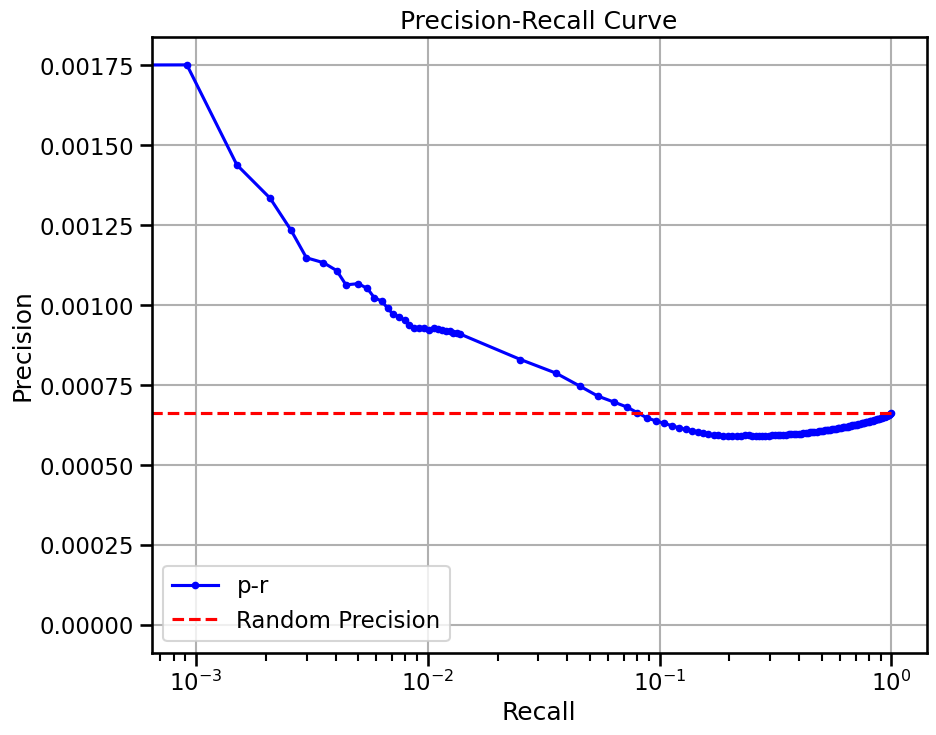


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:01<02:03,  1.96s/it]


  3%|▎         | 2/64 [00:02<00:59,  1.04it/s]


  5%|▍         | 3/64 [00:02<00:39,  1.54it/s]


  6%|▋         | 4/64 [00:02<00:29,  2.01it/s]


  8%|▊         | 5/64 [00:03<00:24,  2.42it/s]


  9%|▉         | 6/64 [00:03<00:21,  2.75it/s]


 11%|█         | 7/64 [00:03<00:18,  3.01it/s]


 12%|█▎        | 8/64 [00:03<00:17,  3.23it/s]


 14%|█▍        | 9/64 [00:04<00:16,  3.39it/s]


 16%|█▌        | 10/64 [00:04<00:15,  3.51it/s]


 17%|█▋        | 11/64 [00:04<00:14,  3.60it/s]


 19%|█▉        | 12/64 [00:04<00:14,  3.66it/s]


 20%|██        | 13/64 [00:05<00:14,  3.60it/s]


 22%|██▏       | 14/64 [00:05<00:13,  3.63it/s]


 23%|██▎       | 15/64 [00:05<00:13,  3.65it/s]


 25%|██▌       | 16/64 [00:05<00:13,  3.65it/s]


 27%|██▋       | 17/64 [00:06<00:12,  3.69it/s]


 28%|██▊       | 18/64 [00:06<00:12,  3.73it/s]


 30%|██▉       | 19/64 [00:06<00:12,  3.74it/s]


 31%|███▏      | 20/64 [00:07<00:11,  3.77it/s]


 33%|███▎      | 21/64 [00:07<00:11,  3.74it/s]


 34%|███▍      | 22/64 [00:07<00:11,  3.71it/s]


 36%|███▌      | 23/64 [00:07<00:11,  3.70it/s]


 38%|███▊      | 24/64 [00:08<00:10,  3.69it/s]


 39%|███▉      | 25/64 [00:08<00:10,  3.72it/s]


 41%|████      | 26/64 [00:08<00:10,  3.74it/s]


 42%|████▏     | 27/64 [00:08<00:09,  3.76it/s]


 44%|████▍     | 28/64 [00:09<00:09,  3.77it/s]


 45%|████▌     | 29/64 [00:09<00:09,  3.78it/s]


 47%|████▋     | 30/64 [00:09<00:08,  3.79it/s]


 48%|████▊     | 31/64 [00:09<00:08,  3.80it/s]


 50%|█████     | 32/64 [00:10<00:08,  3.80it/s]


 52%|█████▏    | 33/64 [00:10<00:08,  3.64it/s]


 53%|█████▎    | 34/64 [00:10<00:08,  3.65it/s]


 55%|█████▍    | 35/64 [00:11<00:07,  3.69it/s]


 56%|█████▋    | 36/64 [00:11<00:07,  3.72it/s]


 58%|█████▊    | 37/64 [00:11<00:07,  3.73it/s]


 59%|█████▉    | 38/64 [00:11<00:06,  3.75it/s]


 61%|██████    | 39/64 [00:12<00:06,  3.75it/s]


 62%|██████▎   | 40/64 [00:12<00:06,  3.76it/s]


 64%|██████▍   | 41/64 [00:12<00:06,  3.76it/s]


 66%|██████▌   | 42/64 [00:12<00:05,  3.78it/s]


 67%|██████▋   | 43/64 [00:13<00:05,  3.75it/s]


 69%|██████▉   | 44/64 [00:13<00:05,  3.69it/s]


 70%|███████   | 45/64 [00:13<00:05,  3.72it/s]


 72%|███████▏  | 46/64 [00:13<00:04,  3.75it/s]


 73%|███████▎  | 47/64 [00:14<00:04,  3.77it/s]


 75%|███████▌  | 48/64 [00:14<00:04,  3.75it/s]


 77%|███████▋  | 49/64 [00:14<00:04,  3.73it/s]


 78%|███████▊  | 50/64 [00:15<00:03,  3.75it/s]


 80%|███████▉  | 51/64 [00:15<00:03,  3.77it/s]


 81%|████████▏ | 52/64 [00:15<00:03,  3.79it/s]


 83%|████████▎ | 53/64 [00:15<00:02,  3.78it/s]


 84%|████████▍ | 54/64 [00:16<00:02,  3.79it/s]


 86%|████████▌ | 55/64 [00:16<00:02,  3.79it/s]


 88%|████████▊ | 56/64 [00:16<00:02,  3.75it/s]


 89%|████████▉ | 57/64 [00:16<00:01,  3.76it/s]


 91%|█████████ | 58/64 [00:17<00:01,  3.78it/s]


 92%|█████████▏| 59/64 [00:17<00:01,  3.78it/s]


 94%|█████████▍| 60/64 [00:17<00:01,  3.75it/s]


 95%|█████████▌| 61/64 [00:17<00:00,  3.78it/s]


 97%|█████████▋| 62/64 [00:18<00:00,  3.79it/s]


 98%|█████████▊| 63/64 [00:18<00:00,  3.79it/s]


100%|██████████| 64/64 [00:18<00:00,  3.79it/s]


100%|██████████| 64/64 [00:18<00:00,  3.38it/s]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


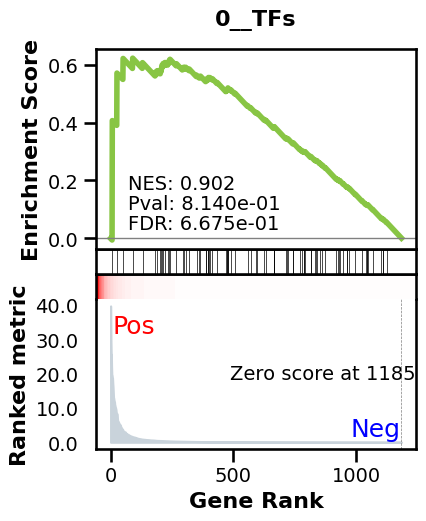

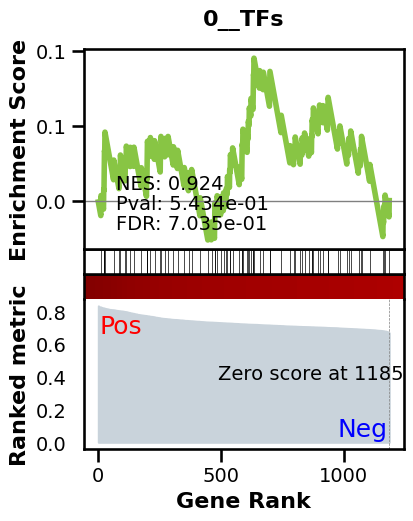

_________________________________________
TF specific enrichment
found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 730 genes
intersection pct: 0.6155143338954469
precision:  0.0007018202289360105 
recall:  1.0 
random precision: 0.0007027829452994344



  0%|          | 0/128 [00:00<?, ?it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 1653.56it/s]

Average Precision (AP):  0.0010921212035650827
Area Under Precision-Recall Curve (AUPRC):  0.0010707609384467821
EPR: 0.0


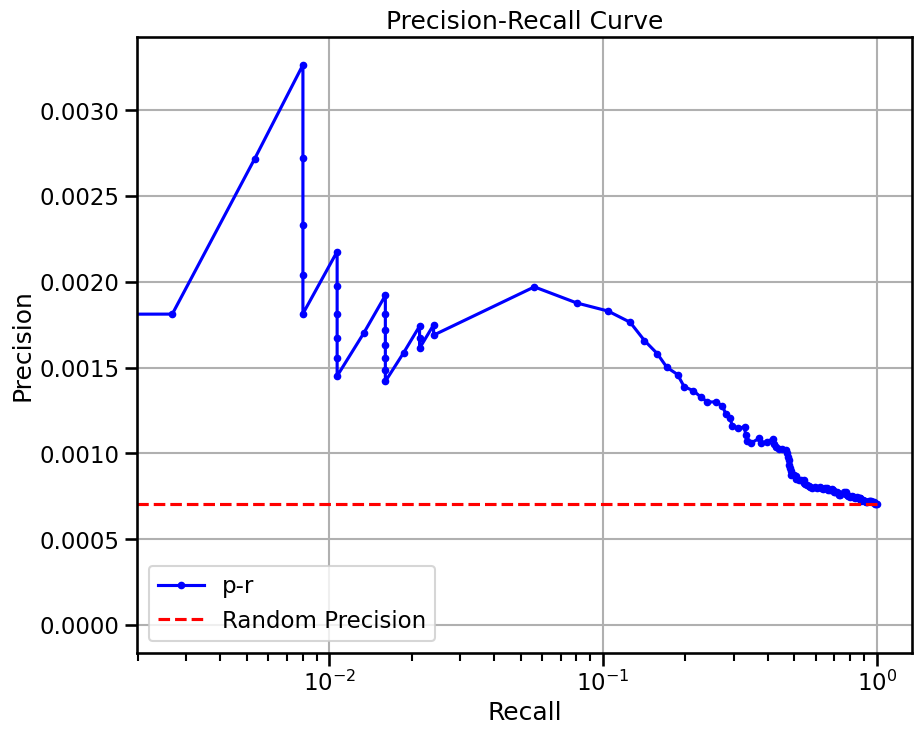

(1024, 1186) retinal rod cell
base enrichment


Top central genes: []


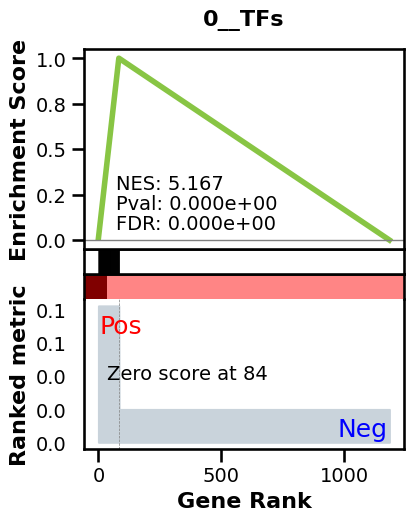

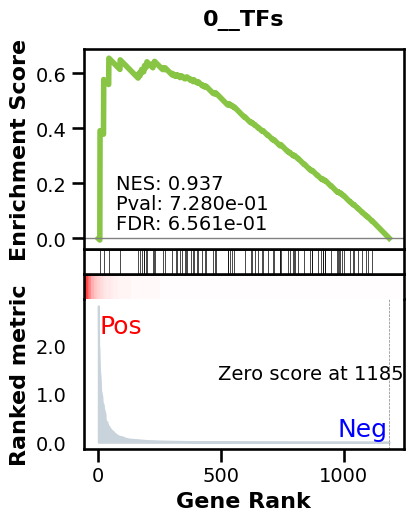

_________________________________________
TF specific enrichment
found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 730 genes
intersection pct: 0.6155143338954469
precision:  0.003748097412480974 
recall:  0.5267379679144385 
random precision: 0.0007027829452994344



  0%|          | 0/128 [00:00<?, ?it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 1641.85it/s]

Average Precision (AP):  0.003306151003605866
Area Under Precision-Recall Curve (AUPRC):  0.003082415139374656
EPR: 3.819642202560214


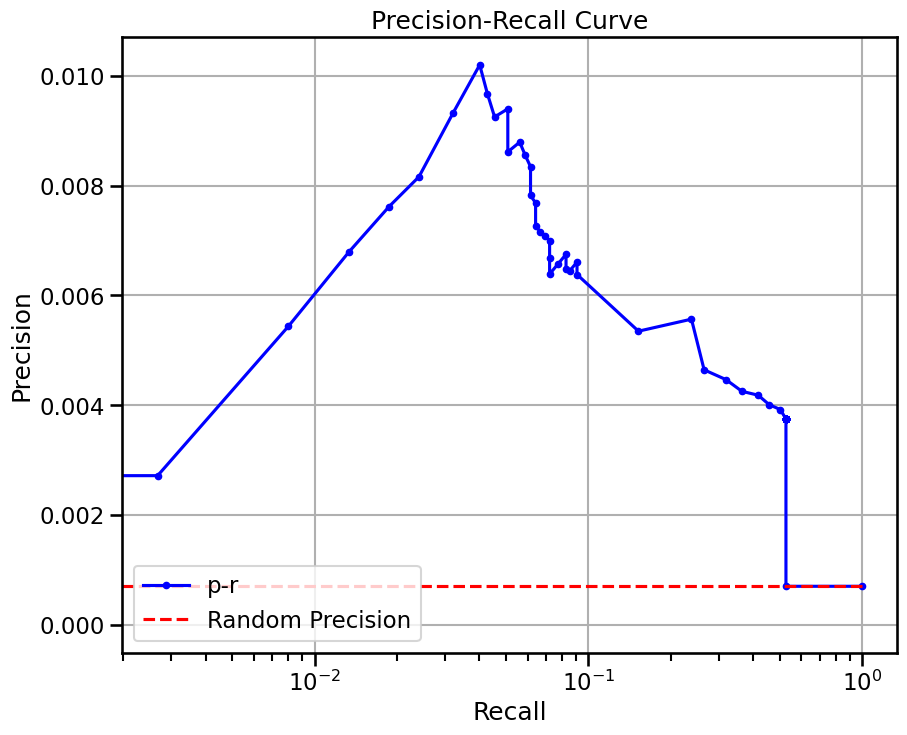

base enrichment


Top central genes: []
The DataFrame contains only the same values.


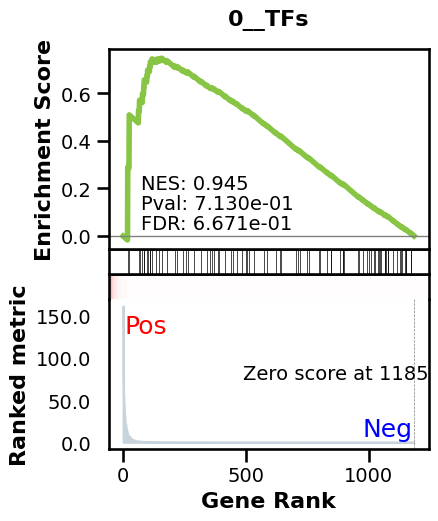

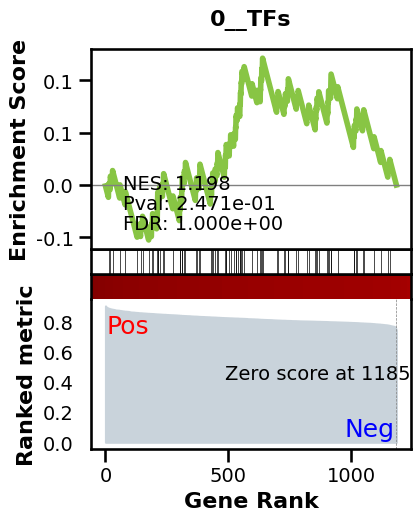

_________________________________________
TF specific enrichment
found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 730 genes
intersection pct: 0.6155143338954469
precision:  0.0007018202289360105 
recall:  1.0 
random precision: 0.0007027829452994344



  0%|          | 0/128 [00:00<?, ?it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 1653.07it/s]

Average Precision (AP):  0.0010452989078389213
Area Under Precision-Recall Curve (AUPRC):  0.001017847319446844
EPR: 3.819642202560214


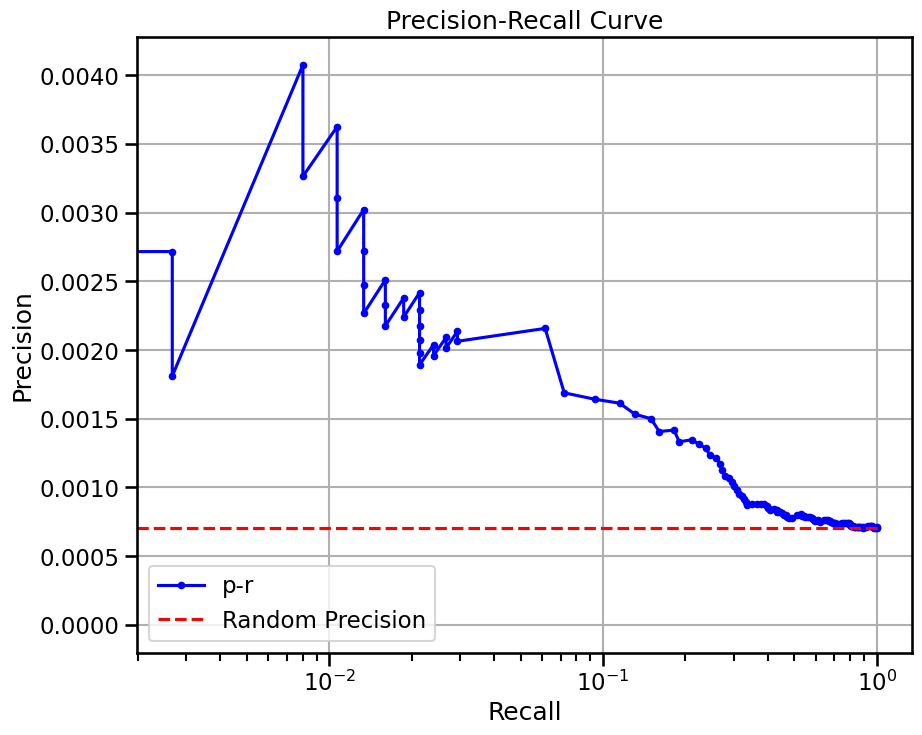

base enrichment


Top central genes: []


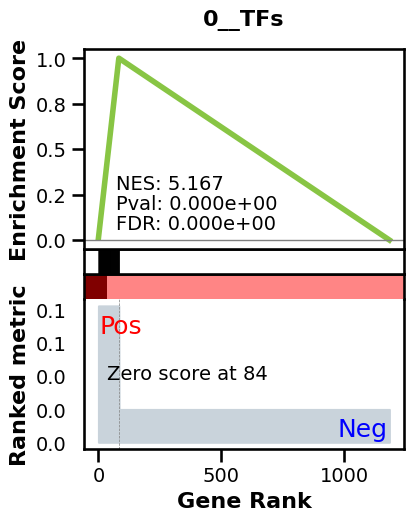

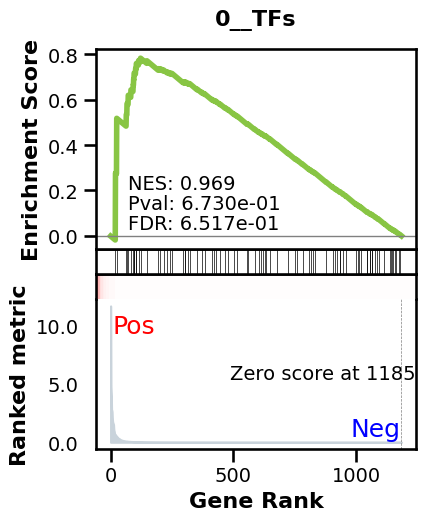

_________________________________________
TF specific enrichment
found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 730 genes
intersection pct: 0.6155143338954469
precision:  0.003748097412480974 
recall:  0.5267379679144385 
random precision: 0.0007027829452994344



  0%|          | 0/128 [00:00<?, ?it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:00<00:00, 1646.02it/s]

Average Precision (AP):  0.0030076734777050745
Area Under Precision-Recall Curve (AUPRC):  0.002769027472462977
EPR: 3.819642202560214


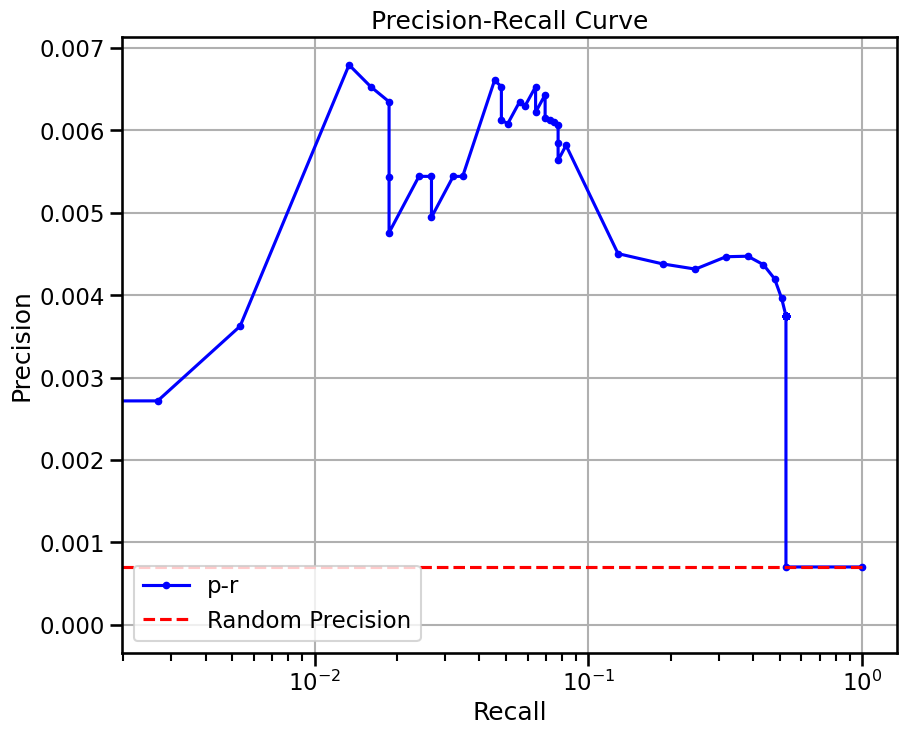


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:09,  2.26s/it]


  6%|▋         | 2/32 [00:03<00:41,  1.39s/it]


  9%|▉         | 3/32 [00:03<00:32,  1.12s/it]


 12%|█▎        | 4/32 [00:04<00:27,  1.01it/s]


 16%|█▌        | 5/32 [00:05<00:24,  1.09it/s]


 19%|█▉        | 6/32 [00:06<00:22,  1.14it/s]


 22%|██▏       | 7/32 [00:06<00:21,  1.18it/s]


 25%|██▌       | 8/32 [00:07<00:19,  1.21it/s]


 28%|██▊       | 9/32 [00:08<00:18,  1.23it/s]


 31%|███▏      | 10/32 [00:09<00:17,  1.24it/s]


 34%|███▍      | 11/32 [00:10<00:16,  1.25it/s]


 38%|███▊      | 12/32 [00:10<00:15,  1.25it/s]


 41%|████      | 13/32 [00:11<00:15,  1.26it/s]


 44%|████▍     | 14/32 [00:12<00:14,  1.26it/s]


 47%|████▋     | 15/32 [00:13<00:13,  1.26it/s]


 50%|█████     | 16/32 [00:14<00:12,  1.27it/s]


 53%|█████▎    | 17/32 [00:14<00:11,  1.27it/s]


 56%|█████▋    | 18/32 [00:15<00:10,  1.27it/s]


 59%|█████▉    | 19/32 [00:16<00:10,  1.27it/s]


 62%|██████▎   | 20/32 [00:17<00:09,  1.27it/s]


 66%|██████▌   | 21/32 [00:18<00:08,  1.27it/s]


 69%|██████▉   | 22/32 [00:18<00:07,  1.28it/s]


 72%|███████▏  | 23/32 [00:19<00:07,  1.27it/s]


 75%|███████▌  | 24/32 [00:20<00:06,  1.28it/s]


 78%|███████▊  | 25/32 [00:21<00:05,  1.28it/s]


 81%|████████▏ | 26/32 [00:21<00:04,  1.28it/s]


 84%|████████▍ | 27/32 [00:22<00:03,  1.28it/s]


 88%|████████▊ | 28/32 [00:23<00:03,  1.28it/s]


 91%|█████████ | 29/32 [00:24<00:02,  1.27it/s]


 94%|█████████▍| 30/32 [00:25<00:01,  1.28it/s]


 97%|█████████▋| 31/32 [00:25<00:00,  1.27it/s]


100%|██████████| 32/32 [00:26<00:00,  1.27it/s]


100%|██████████| 32/32 [00:26<00:00,  1.19it/s]

avg link count: 536015104, sparsity: 1.0


base enrichment


too many genes for central computation


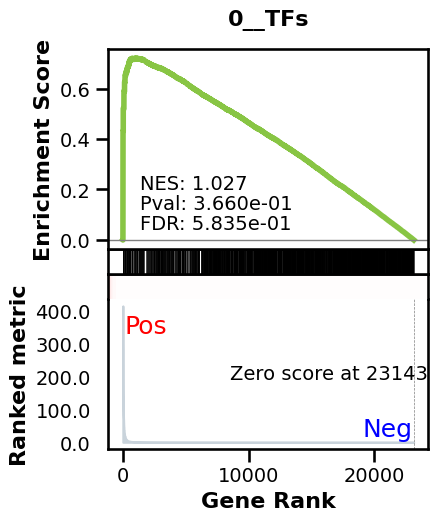

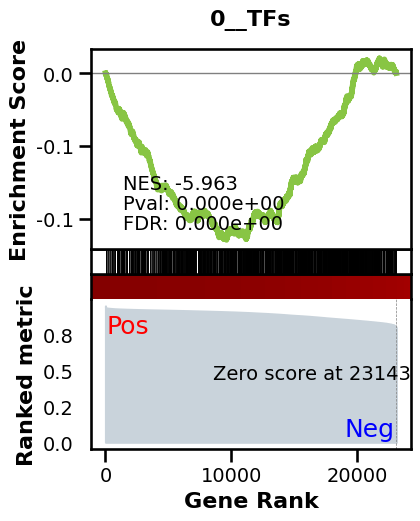

_________________________________________
TF specific enrichment


found some significant results for  35.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5384980988593155


precision:  0.000662004780503526 
recall:  1.0 
random precision: 0.0006620506288850277



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:48,  2.62it/s]


  2%|▏         | 2/128 [00:00<00:41,  3.03it/s]


  2%|▏         | 3/128 [00:00<00:39,  3.19it/s]


  3%|▎         | 4/128 [00:01<00:38,  3.26it/s]


  4%|▍         | 5/128 [00:01<00:37,  3.31it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.33it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.35it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.36it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.37it/s]


  8%|▊         | 10/128 [00:03<00:34,  3.38it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.38it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.38it/s]


 10%|█         | 13/128 [00:03<00:33,  3.38it/s]


 11%|█         | 14/128 [00:04<00:33,  3.39it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.39it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.39it/s]


 13%|█▎        | 17/128 [00:05<00:32,  3.39it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.39it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.39it/s]


 16%|█▌        | 20/128 [00:05<00:31,  3.39it/s]


 16%|█▋        | 21/128 [00:06<00:31,  3.39it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.39it/s]


 18%|█▊        | 23/128 [00:06<00:30,  3.39it/s]


 19%|█▉        | 24/128 [00:07<00:30,  3.38it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.38it/s]


 20%|██        | 26/128 [00:07<00:30,  3.38it/s]


 21%|██        | 27/128 [00:08<00:29,  3.38it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.39it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.39it/s]


 23%|██▎       | 30/128 [00:08<00:28,  3.39it/s]


 24%|██▍       | 31/128 [00:09<00:28,  3.38it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.38it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.39it/s]


 27%|██▋       | 34/128 [00:10<00:27,  3.39it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.39it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.38it/s]


 29%|██▉       | 37/128 [00:11<00:26,  3.38it/s]


 30%|██▉       | 38/128 [00:11<00:26,  3.38it/s]


 30%|███       | 39/128 [00:11<00:26,  3.39it/s]


 31%|███▏      | 40/128 [00:11<00:25,  3.39it/s]


 32%|███▏      | 41/128 [00:12<00:25,  3.38it/s]


 33%|███▎      | 42/128 [00:12<00:27,  3.18it/s]


 34%|███▎      | 43/128 [00:12<00:26,  3.24it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.28it/s]


 35%|███▌      | 45/128 [00:13<00:25,  3.31it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.34it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.35it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.36it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.37it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.38it/s]


 40%|███▉      | 51/128 [00:15<00:22,  3.38it/s]


 41%|████      | 52/128 [00:15<00:22,  3.38it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.38it/s]


 42%|████▏     | 54/128 [00:16<00:21,  3.38it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.39it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.38it/s]


 45%|████▍     | 57/128 [00:16<00:20,  3.38it/s]


 45%|████▌     | 58/128 [00:17<00:20,  3.38it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.38it/s]


 47%|████▋     | 60/128 [00:17<00:20,  3.38it/s]


 48%|████▊     | 61/128 [00:18<00:19,  3.38it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.38it/s]


 49%|████▉     | 63/128 [00:18<00:19,  3.39it/s]


 50%|█████     | 64/128 [00:19<00:18,  3.38it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.39it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.39it/s]


 52%|█████▏    | 67/128 [00:19<00:17,  3.39it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.38it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.38it/s]


 55%|█████▍    | 70/128 [00:20<00:17,  3.39it/s]


 55%|█████▌    | 71/128 [00:21<00:16,  3.39it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.39it/s]


 57%|█████▋    | 73/128 [00:21<00:16,  3.39it/s]


 58%|█████▊    | 74/128 [00:21<00:15,  3.39it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.39it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.39it/s]


 60%|██████    | 77/128 [00:22<00:15,  3.39it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.39it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.39it/s]


 62%|██████▎   | 80/128 [00:23<00:14,  3.39it/s]


 63%|██████▎   | 81/128 [00:24<00:13,  3.39it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.39it/s]


 65%|██████▍   | 83/128 [00:24<00:13,  3.39it/s]


 66%|██████▌   | 84/128 [00:24<00:12,  3.39it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.39it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.39it/s]


 68%|██████▊   | 87/128 [00:25<00:12,  3.39it/s]


 69%|██████▉   | 88/128 [00:26<00:11,  3.39it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.39it/s]


 70%|███████   | 90/128 [00:26<00:11,  3.39it/s]


 71%|███████   | 91/128 [00:27<00:10,  3.39it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.39it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.39it/s]


 73%|███████▎  | 94/128 [00:27<00:10,  3.39it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.39it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.39it/s]


 76%|███████▌  | 97/128 [00:28<00:09,  3.39it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.40it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.39it/s]


 78%|███████▊  | 100/128 [00:29<00:08,  3.39it/s]


 79%|███████▉  | 101/128 [00:29<00:07,  3.39it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.39it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.39it/s]


 81%|████████▏ | 104/128 [00:30<00:07,  3.32it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.34it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.36it/s]


 84%|████████▎ | 107/128 [00:31<00:06,  3.37it/s]


 84%|████████▍ | 108/128 [00:32<00:05,  3.36it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.34it/s]


 86%|████████▌ | 110/128 [00:32<00:05,  3.36it/s]


 87%|████████▋ | 111/128 [00:32<00:05,  3.37it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.38it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.34it/s]


 89%|████████▉ | 114/128 [00:33<00:04,  3.35it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.37it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.38it/s]


 91%|█████████▏| 117/128 [00:34<00:03,  3.38it/s]


 92%|█████████▏| 118/128 [00:35<00:03,  3.29it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.32it/s]


 94%|█████████▍| 120/128 [00:35<00:02,  3.34it/s]


 95%|█████████▍| 121/128 [00:35<00:02,  3.36it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.37it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.38it/s]


 97%|█████████▋| 124/128 [00:36<00:01,  3.39it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.39it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.39it/s]


 99%|█████████▉| 127/128 [00:37<00:00,  3.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:37<00:00,  3.40it/s]


100%|██████████| 128/128 [00:37<00:00,  3.37it/s]

Average Precision (AP):  0.0006449532992799515
Area Under Precision-Recall Curve (AUPRC):  0.000644689898500344


EPR: 2.1699526360003696


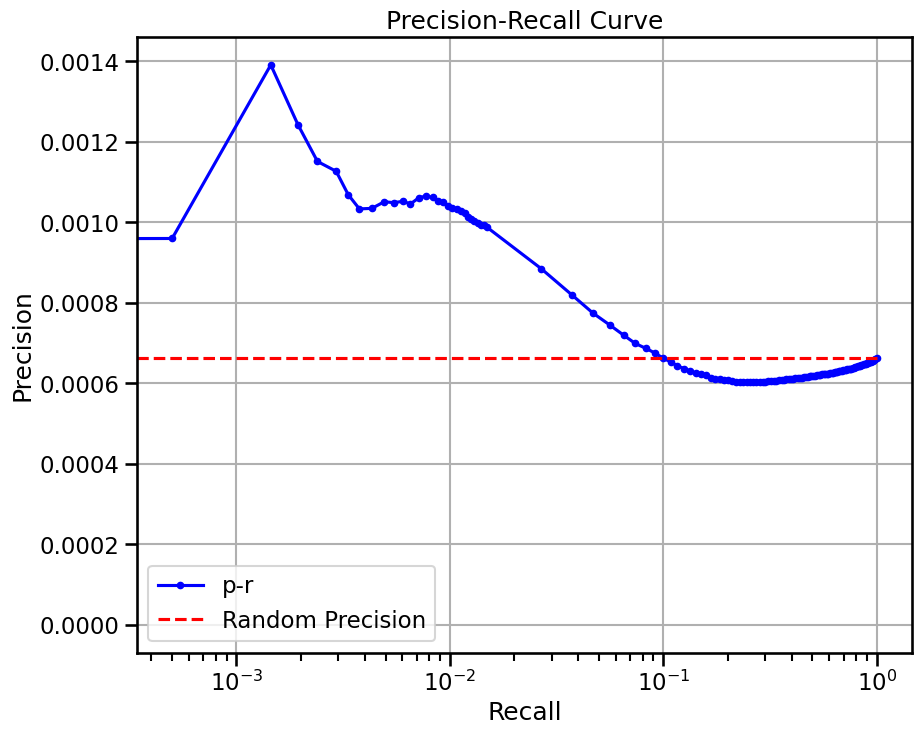


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<02:55,  2.79s/it]


  3%|▎         | 2/64 [00:03<01:53,  1.84s/it]


  5%|▍         | 3/64 [00:05<01:33,  1.53s/it]


  6%|▋         | 4/64 [00:06<01:23,  1.38s/it]


  8%|▊         | 5/64 [00:07<01:16,  1.30s/it]


  9%|▉         | 6/64 [00:08<01:12,  1.25s/it]


 11%|█         | 7/64 [00:09<01:09,  1.22s/it]


 12%|█▎        | 8/64 [00:10<01:07,  1.20s/it]


 14%|█▍        | 9/64 [00:12<01:05,  1.19s/it]


 16%|█▌        | 10/64 [00:13<01:03,  1.18s/it]


 17%|█▋        | 11/64 [00:14<01:02,  1.17s/it]


 19%|█▉        | 12/64 [00:15<01:00,  1.16s/it]


 20%|██        | 13/64 [00:16<00:59,  1.16s/it]


 22%|██▏       | 14/64 [00:17<00:57,  1.16s/it]


 23%|██▎       | 15/64 [00:19<00:56,  1.16s/it]


 25%|██▌       | 16/64 [00:20<00:55,  1.16s/it]


 27%|██▋       | 17/64 [00:21<00:55,  1.17s/it]


 28%|██▊       | 18/64 [00:22<00:54,  1.18s/it]


 30%|██▉       | 19/64 [00:23<00:53,  1.19s/it]


 31%|███▏      | 20/64 [00:24<00:52,  1.20s/it]


 33%|███▎      | 21/64 [00:26<00:51,  1.21s/it]


 34%|███▍      | 22/64 [00:27<00:50,  1.21s/it]


 36%|███▌      | 23/64 [00:28<00:49,  1.21s/it]


 38%|███▊      | 24/64 [00:29<00:48,  1.22s/it]


 39%|███▉      | 25/64 [00:31<00:47,  1.21s/it]


 41%|████      | 26/64 [00:32<00:45,  1.20s/it]


 42%|████▏     | 27/64 [00:33<00:44,  1.19s/it]


 44%|████▍     | 28/64 [00:34<00:42,  1.19s/it]


 45%|████▌     | 29/64 [00:35<00:41,  1.18s/it]


 47%|████▋     | 30/64 [00:36<00:39,  1.17s/it]


 48%|████▊     | 31/64 [00:38<00:38,  1.17s/it]


 50%|█████     | 32/64 [00:39<00:37,  1.18s/it]


 52%|█████▏    | 33/64 [00:40<00:36,  1.18s/it]


 53%|█████▎    | 34/64 [00:41<00:35,  1.17s/it]


 55%|█████▍    | 35/64 [00:42<00:34,  1.17s/it]


 56%|█████▋    | 36/64 [00:43<00:32,  1.16s/it]


 58%|█████▊    | 37/64 [00:45<00:31,  1.15s/it]


 59%|█████▉    | 38/64 [00:46<00:30,  1.16s/it]


 61%|██████    | 39/64 [00:47<00:28,  1.15s/it]


 62%|██████▎   | 40/64 [00:48<00:27,  1.15s/it]


 64%|██████▍   | 41/64 [00:49<00:26,  1.13s/it]


 66%|██████▌   | 42/64 [00:50<00:24,  1.12s/it]


 67%|██████▋   | 43/64 [00:51<00:23,  1.11s/it]


 69%|██████▉   | 44/64 [00:52<00:22,  1.11s/it]


 70%|███████   | 45/64 [00:53<00:20,  1.10s/it]


 72%|███████▏  | 46/64 [00:55<00:19,  1.10s/it]


 73%|███████▎  | 47/64 [00:56<00:18,  1.10s/it]


 75%|███████▌  | 48/64 [00:57<00:17,  1.11s/it]


 77%|███████▋  | 49/64 [00:58<00:16,  1.11s/it]


 78%|███████▊  | 50/64 [00:59<00:15,  1.10s/it]


 80%|███████▉  | 51/64 [01:00<00:15,  1.16s/it]


 81%|████████▏ | 52/64 [01:01<00:13,  1.14s/it]


 83%|████████▎ | 53/64 [01:02<00:12,  1.12s/it]


 84%|████████▍ | 54/64 [01:04<00:11,  1.11s/it]


 86%|████████▌ | 55/64 [01:05<00:09,  1.11s/it]


 88%|████████▊ | 56/64 [01:06<00:08,  1.10s/it]


 89%|████████▉ | 57/64 [01:07<00:07,  1.10s/it]


 91%|█████████ | 58/64 [01:08<00:06,  1.10s/it]


 92%|█████████▏| 59/64 [01:09<00:05,  1.10s/it]


 94%|█████████▍| 60/64 [01:10<00:04,  1.11s/it]


 95%|█████████▌| 61/64 [01:11<00:03,  1.10s/it]


 97%|█████████▋| 62/64 [01:12<00:02,  1.11s/it]


 98%|█████████▊| 63/64 [01:13<00:01,  1.10s/it]


100%|██████████| 64/64 [01:15<00:00,  1.10s/it]


100%|██████████| 64/64 [01:15<00:00,  1.18s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


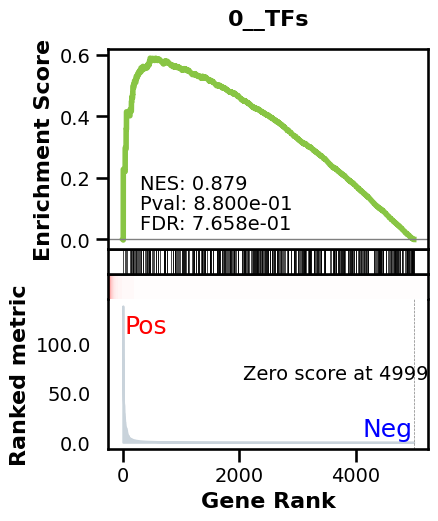

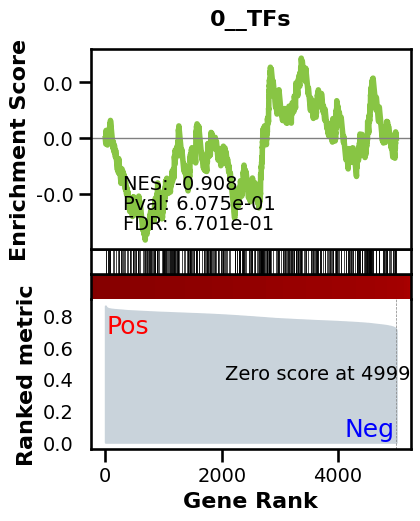

_________________________________________
TF specific enrichment


found some significant results for  24.137931034482758 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.0013761972249491062 
recall:  1.0 
random precision: 0.001376576029580251



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 42.72it/s]


  8%|▊         | 10/128 [00:00<00:02, 42.81it/s]


 12%|█▏        | 15/128 [00:00<00:02, 42.76it/s]


 16%|█▌        | 20/128 [00:00<00:02, 42.84it/s]


 20%|█▉        | 25/128 [00:00<00:02, 42.94it/s]


 23%|██▎       | 30/128 [00:00<00:02, 42.96it/s]


 27%|██▋       | 35/128 [00:00<00:02, 42.85it/s]


 31%|███▏      | 40/128 [00:00<00:02, 42.78it/s]


 35%|███▌      | 45/128 [00:01<00:01, 42.73it/s]


 39%|███▉      | 50/128 [00:01<00:01, 42.74it/s]


 43%|████▎     | 55/128 [00:01<00:01, 42.76it/s]


 47%|████▋     | 60/128 [00:01<00:01, 42.80it/s]


 51%|█████     | 65/128 [00:01<00:01, 42.72it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 42.76it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 42.74it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 42.68it/s]


 66%|██████▋   | 85/128 [00:01<00:01, 42.70it/s]


 70%|███████   | 90/128 [00:02<00:00, 42.76it/s]


 74%|███████▍  | 95/128 [00:02<00:00, 42.76it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 42.75it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 42.79it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 42.80it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 42.79it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 42.81it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 42.77it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 42.76it/s]

Average Precision (AP):  0.0015209058641984334
Area Under Precision-Recall Curve (AUPRC):  0.0015191470179963347
EPR: 2.7714516192137966


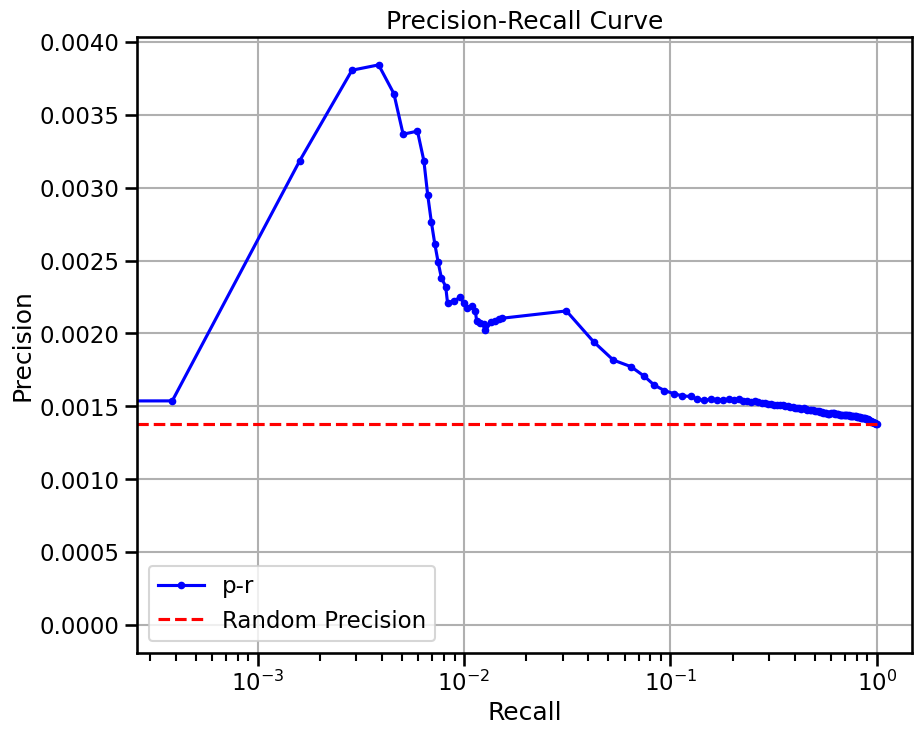

(1024, 5000) Mueller cell
base enrichment


Top central genes: []


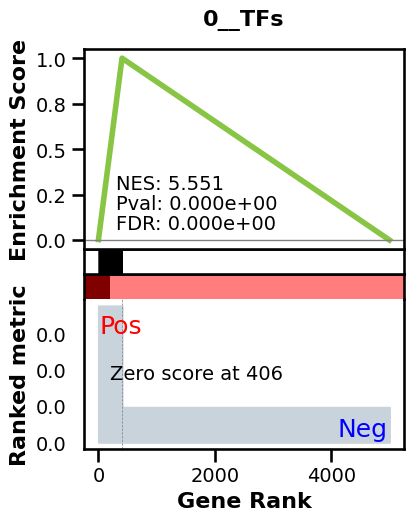

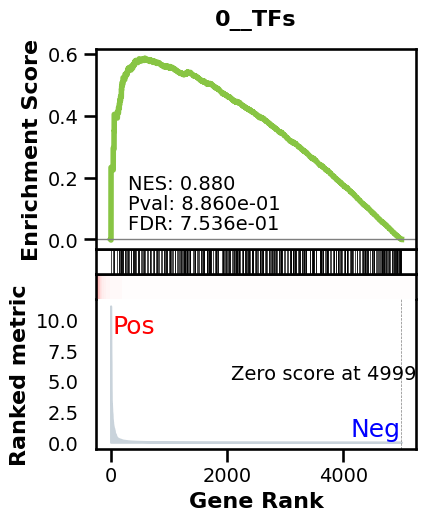

_________________________________________
TF specific enrichment


found some significant results for  5.172413793103448 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.006061686575147085 
recall:  0.4302850225597007 
random precision: 0.001376576029580251



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 51.16it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.79it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.59it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.54it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.43it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.71it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.81it/s]


 38%|███▊      | 48/128 [00:00<00:01, 51.03it/s]


 42%|████▏     | 54/128 [00:01<00:01, 51.16it/s]


 47%|████▋     | 60/128 [00:01<00:01, 51.10it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 51.20it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 51.34it/s]


 61%|██████    | 78/128 [00:01<00:00, 51.35it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 51.34it/s]


 70%|███████   | 90/128 [00:01<00:00, 51.38it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.38it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 51.12it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 51.14it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 51.13it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 51.05it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 51.14it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 51.01it/s]

Average Precision (AP):  0.00424849774022638
Area Under Precision-Recall Curve (AUPRC):  0.0037502387208021033
EPR: 9.027728609738205


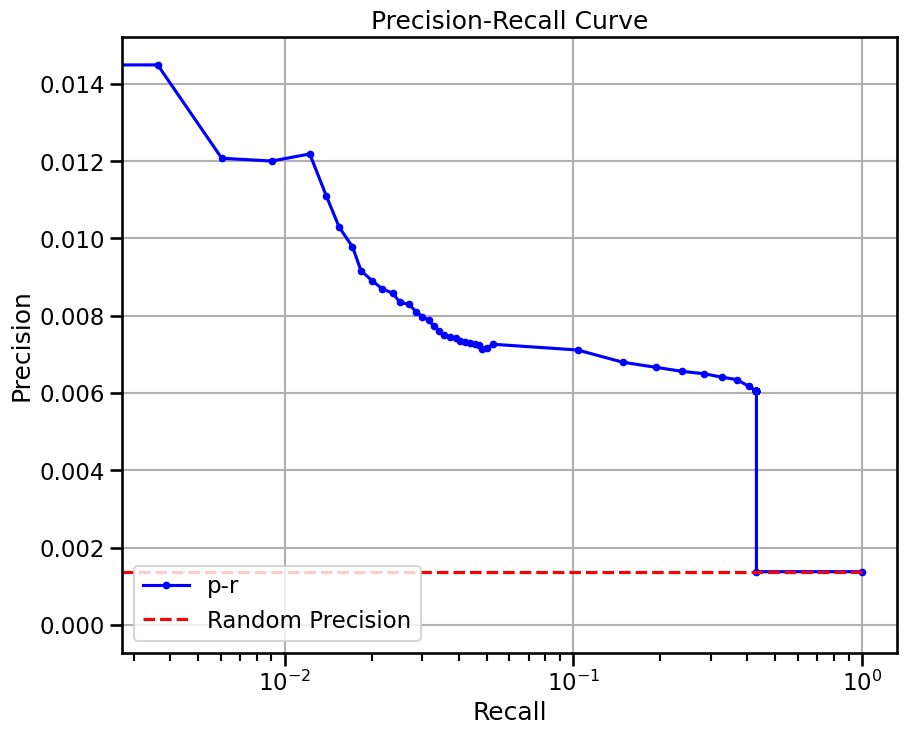

base enrichment


Top central genes: []
The DataFrame contains only the same values.


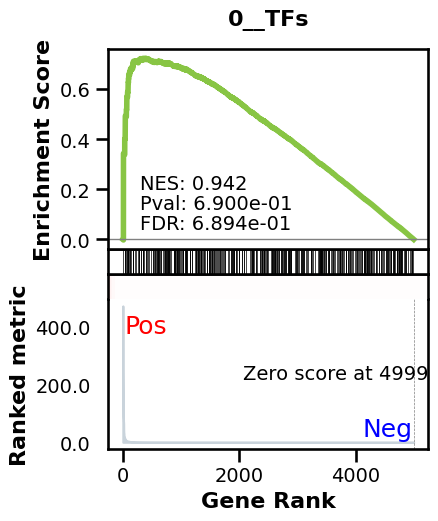

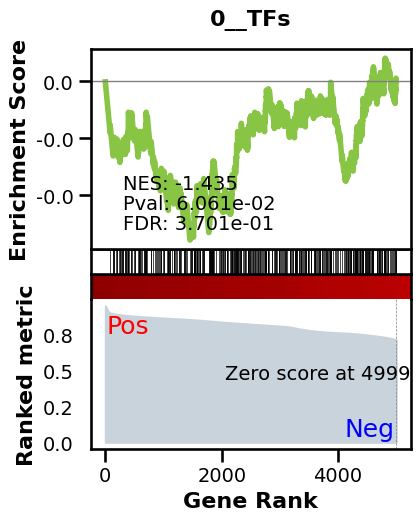

_________________________________________
TF specific enrichment


found some significant results for  6.896551724137931 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.0013761972249491062 
recall:  1.0 
random precision: 0.001376576029580251



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 51.59it/s]


  9%|▉         | 12/128 [00:00<00:02, 51.17it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.98it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.87it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.71it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.68it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.66it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.68it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.73it/s]


 47%|████▋     | 60/128 [00:01<00:01, 51.02it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.96it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.64it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.97it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 51.08it/s]


 70%|███████   | 90/128 [00:01<00:00, 51.04it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.17it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 51.29it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 51.32it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 51.04it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.89it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 51.04it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.92it/s]

Average Precision (AP):  0.001497218736366159
Area Under Precision-Recall Curve (AUPRC):  0.0014655422452616606
EPR: 2.2864260542385515


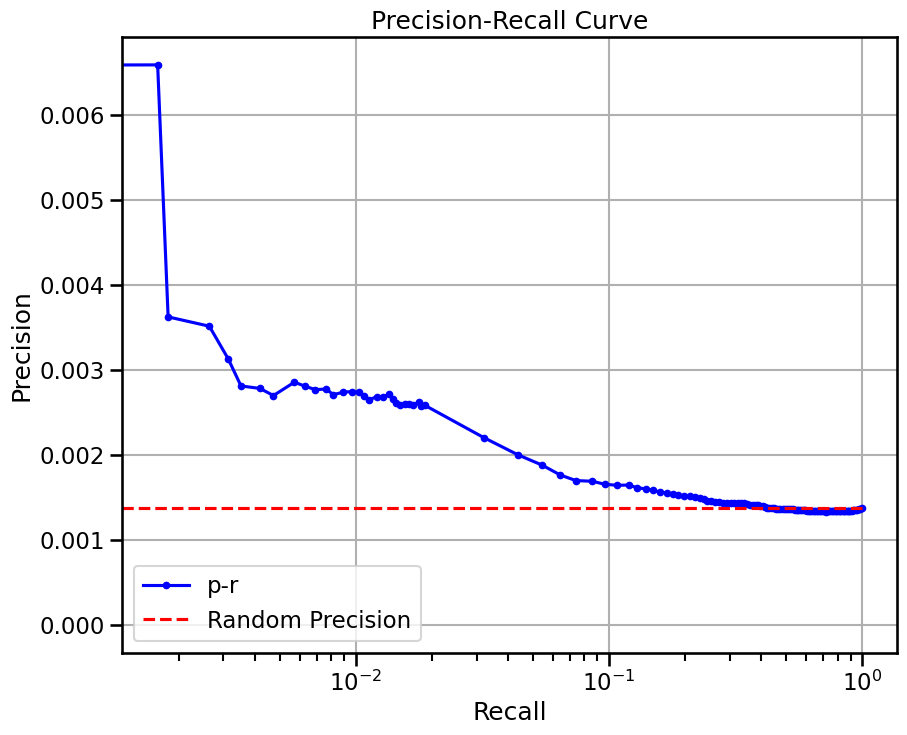

base enrichment


Top central genes: []


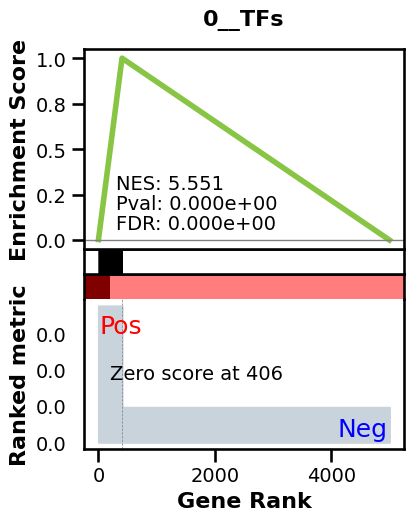

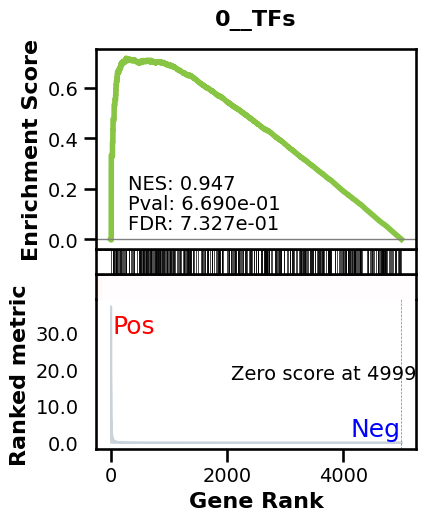

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.006061686575147085 
recall:  0.4302850225597007 
random precision: 0.001376576029580251



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 50.73it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.45it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.42it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.41it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.67it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.76it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.63it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.52it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.46it/s]


 47%|████▋     | 60/128 [00:01<00:01, 50.53it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.77it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.76it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.84it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.85it/s]


 70%|███████   | 90/128 [00:01<00:00, 50.82it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.03it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 51.01it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.96it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.82it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.74it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.73it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.72it/s]

Average Precision (AP):  0.0042617585702221005
Area Under Precision-Recall Curve (AUPRC):  0.0035809101178768303
EPR: 8.192463819526095


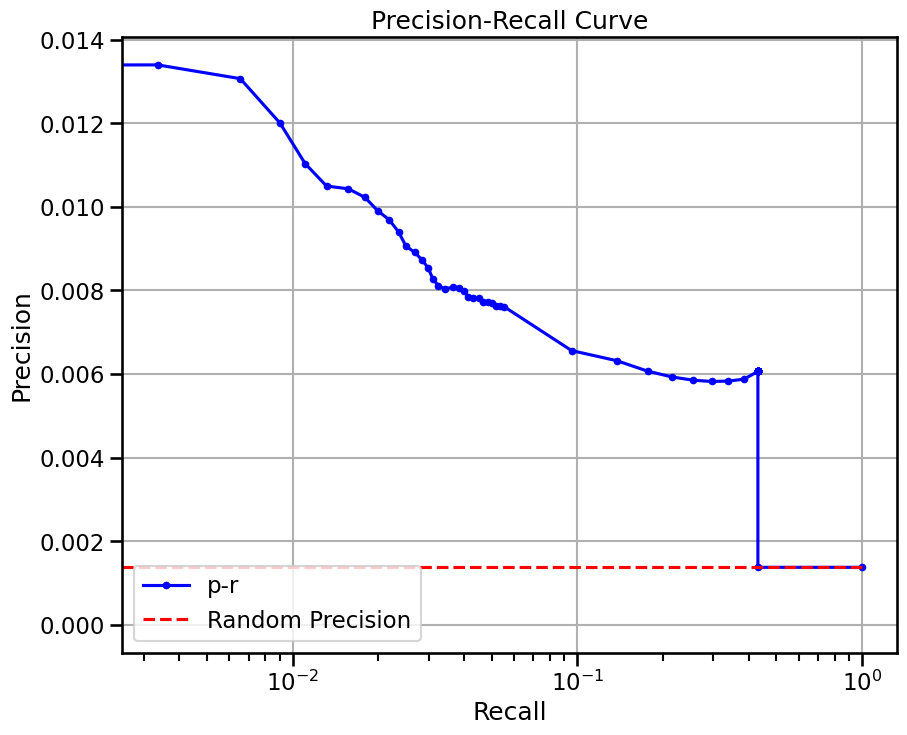


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:12,  2.34s/it]


  6%|▋         | 2/32 [00:03<00:43,  1.45s/it]


  9%|▉         | 3/32 [00:03<00:33,  1.15s/it]


 12%|█▎        | 4/32 [00:04<00:28,  1.02s/it]


 16%|█▌        | 5/32 [00:05<00:25,  1.06it/s]


 19%|█▉        | 6/32 [00:06<00:23,  1.10it/s]


 22%|██▏       | 7/32 [00:07<00:21,  1.14it/s]


 25%|██▌       | 8/32 [00:08<00:20,  1.16it/s]


 28%|██▊       | 9/32 [00:08<00:19,  1.19it/s]


 31%|███▏      | 10/32 [00:09<00:18,  1.21it/s]


 34%|███▍      | 11/32 [00:10<00:17,  1.21it/s]


 38%|███▊      | 12/32 [00:11<00:16,  1.22it/s]


 41%|████      | 13/32 [00:12<00:15,  1.22it/s]


 44%|████▍     | 14/32 [00:12<00:14,  1.22it/s]


 47%|████▋     | 15/32 [00:13<00:13,  1.22it/s]


 50%|█████     | 16/32 [00:14<00:13,  1.22it/s]


 53%|█████▎    | 17/32 [00:15<00:12,  1.22it/s]


 56%|█████▋    | 18/32 [00:16<00:11,  1.22it/s]


 59%|█████▉    | 19/32 [00:17<00:10,  1.22it/s]


 62%|██████▎   | 20/32 [00:17<00:09,  1.23it/s]


 66%|██████▌   | 21/32 [00:18<00:08,  1.24it/s]


 69%|██████▉   | 22/32 [00:19<00:08,  1.24it/s]


 72%|███████▏  | 23/32 [00:20<00:08,  1.07it/s]


 75%|███████▌  | 24/32 [00:21<00:07,  1.07it/s]


 78%|███████▊  | 25/32 [00:22<00:06,  1.07it/s]


 81%|████████▏ | 26/32 [00:23<00:05,  1.06it/s]


 84%|████████▍ | 27/32 [00:24<00:04,  1.06it/s]


 88%|████████▊ | 28/32 [00:25<00:03,  1.05it/s]


 91%|█████████ | 29/32 [00:26<00:02,  1.05it/s]


 94%|█████████▍| 30/32 [00:27<00:01,  1.06it/s]


 97%|█████████▋| 31/32 [00:28<00:00,  1.05it/s]


100%|██████████| 32/32 [00:29<00:00,  1.05it/s]


100%|██████████| 32/32 [00:29<00:00,  1.09it/s]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


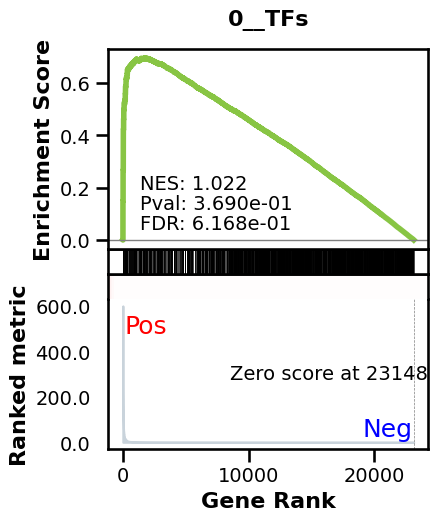

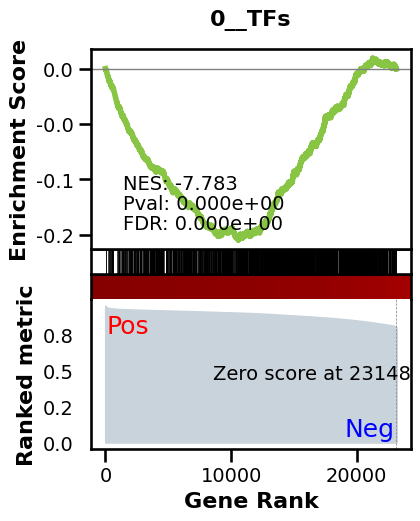

_________________________________________
TF specific enrichment


found some significant results for  33.035714285714285 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:38,  3.32it/s]


  2%|▏         | 2/128 [00:00<00:38,  3.30it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.29it/s]


  3%|▎         | 4/128 [00:01<00:37,  3.30it/s]


  4%|▍         | 5/128 [00:01<00:37,  3.29it/s]


  5%|▍         | 6/128 [00:01<00:37,  3.28it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.29it/s]


  6%|▋         | 8/128 [00:02<00:36,  3.30it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.31it/s]


  8%|▊         | 10/128 [00:03<00:35,  3.31it/s]


  9%|▊         | 11/128 [00:03<00:35,  3.30it/s]


  9%|▉         | 12/128 [00:03<00:35,  3.30it/s]


 10%|█         | 13/128 [00:03<00:34,  3.30it/s]


 11%|█         | 14/128 [00:04<00:34,  3.30it/s]


 12%|█▏        | 15/128 [00:04<00:34,  3.31it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.32it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.31it/s]


 14%|█▍        | 18/128 [00:05<00:33,  3.30it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.31it/s]


 16%|█▌        | 20/128 [00:06<00:32,  3.32it/s]


 16%|█▋        | 21/128 [00:06<00:32,  3.31it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.32it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.32it/s]


 19%|█▉        | 24/128 [00:07<00:31,  3.30it/s]


 20%|█▉        | 25/128 [00:07<00:31,  3.29it/s]


 20%|██        | 26/128 [00:07<00:30,  3.30it/s]


 21%|██        | 27/128 [00:08<00:30,  3.28it/s]


 22%|██▏       | 28/128 [00:08<00:30,  3.30it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.30it/s]


 23%|██▎       | 30/128 [00:09<00:29,  3.31it/s]


 24%|██▍       | 31/128 [00:09<00:29,  3.31it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.32it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.29it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.29it/s]


 27%|██▋       | 35/128 [00:10<00:28,  3.31it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.32it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.32it/s]


 30%|██▉       | 38/128 [00:11<00:27,  3.31it/s]


 30%|███       | 39/128 [00:11<00:26,  3.30it/s]


 31%|███▏      | 40/128 [00:12<00:26,  3.31it/s]


 32%|███▏      | 41/128 [00:12<00:26,  3.31it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.31it/s]


 34%|███▎      | 43/128 [00:13<00:25,  3.31it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.31it/s]


 35%|███▌      | 45/128 [00:13<00:25,  3.30it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.31it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.31it/s]


 38%|███▊      | 48/128 [00:14<00:24,  3.32it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.33it/s]


 39%|███▉      | 50/128 [00:15<00:23,  3.32it/s]


 40%|███▉      | 51/128 [00:15<00:23,  3.31it/s]


 41%|████      | 52/128 [00:15<00:22,  3.32it/s]


 41%|████▏     | 53/128 [00:16<00:22,  3.32it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.32it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.33it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.32it/s]


 45%|████▍     | 57/128 [00:17<00:21,  3.32it/s]


 45%|████▌     | 58/128 [00:17<00:22,  3.13it/s]


 46%|████▌     | 59/128 [00:17<00:21,  3.19it/s]


 47%|████▋     | 60/128 [00:18<00:20,  3.24it/s]


 48%|████▊     | 61/128 [00:18<00:20,  3.28it/s]


 48%|████▊     | 62/128 [00:18<00:20,  3.30it/s]


 49%|████▉     | 63/128 [00:19<00:19,  3.32it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.33it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.34it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.36it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.38it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.39it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.38it/s]


 55%|█████▍    | 70/128 [00:21<00:17,  3.38it/s]


 55%|█████▌    | 71/128 [00:21<00:16,  3.38it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.38it/s]


 57%|█████▋    | 73/128 [00:22<00:16,  3.38it/s]


 58%|█████▊    | 74/128 [00:22<00:15,  3.39it/s]


 59%|█████▊    | 75/128 [00:22<00:16,  3.28it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.30it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.33it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.35it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.36it/s]


 62%|██████▎   | 80/128 [00:24<00:14,  3.37it/s]


 63%|██████▎   | 81/128 [00:24<00:13,  3.37it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.38it/s]


 65%|██████▍   | 83/128 [00:25<00:13,  3.38it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.38it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.32it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.34it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.35it/s]


 69%|██████▉   | 88/128 [00:26<00:11,  3.36it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.37it/s]


 70%|███████   | 90/128 [00:27<00:11,  3.33it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.35it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.37it/s]


 73%|███████▎  | 93/128 [00:28<00:10,  3.38it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.35it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.36it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.38it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.38it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.39it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.39it/s]


 78%|███████▊  | 100/128 [00:30<00:08,  3.39it/s]


 79%|███████▉  | 101/128 [00:30<00:07,  3.38it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.39it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.39it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.39it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.39it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.39it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.39it/s]


 84%|████████▍ | 108/128 [00:32<00:05,  3.39it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.39it/s]


 86%|████████▌ | 110/128 [00:33<00:05,  3.39it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.39it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.39it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.39it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.39it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.39it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.39it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.39it/s]


 92%|█████████▏| 118/128 [00:35<00:02,  3.39it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.39it/s]


 94%|█████████▍| 120/128 [00:35<00:02,  3.39it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.40it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.39it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.39it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.39it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.40it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.40it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.39it/s]


100%|██████████| 128/128 [00:38<00:00,  3.34it/s]

Average Precision (AP):  0.0006429497796578506
Area Under Precision-Recall Curve (AUPRC):  0.0006420735770810582


EPR: 2.192543030465175


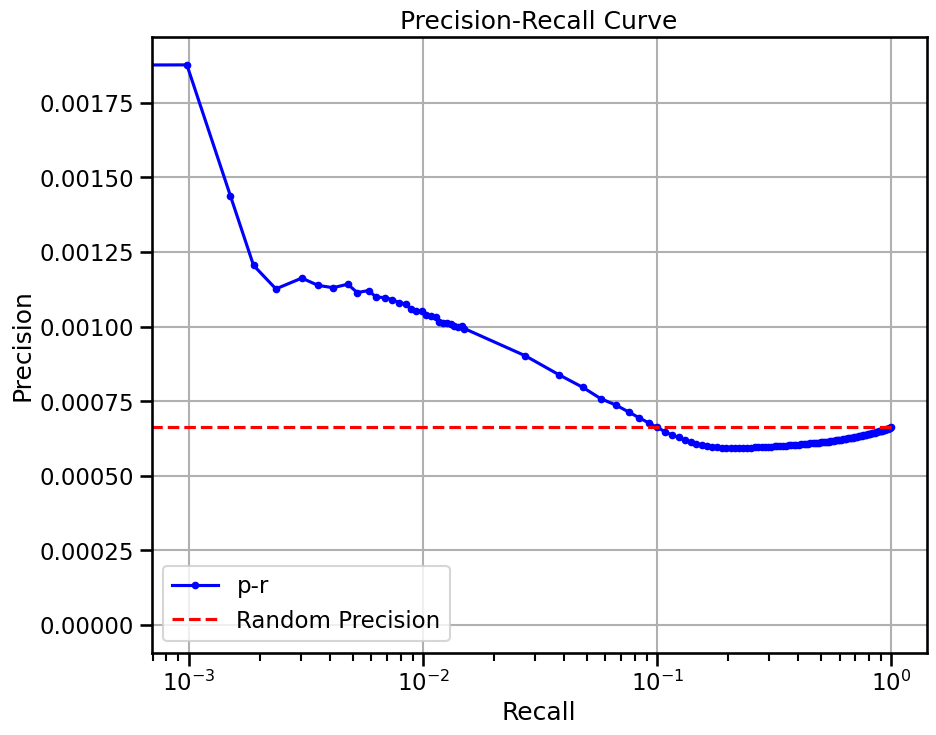


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<02:39,  2.54s/it]


  3%|▎         | 2/64 [00:03<01:47,  1.74s/it]


  5%|▍         | 3/64 [00:04<01:30,  1.49s/it]


  6%|▋         | 4/64 [00:06<01:21,  1.36s/it]


  8%|▊         | 5/64 [00:07<01:16,  1.29s/it]


  9%|▉         | 6/64 [00:08<01:12,  1.25s/it]


 11%|█         | 7/64 [00:09<01:09,  1.21s/it]


 12%|█▎        | 8/64 [00:10<01:06,  1.18s/it]


 14%|█▍        | 9/64 [00:11<01:03,  1.16s/it]


 16%|█▌        | 10/64 [00:12<01:02,  1.15s/it]


 17%|█▋        | 11/64 [00:14<01:00,  1.14s/it]


 19%|█▉        | 12/64 [00:15<00:59,  1.14s/it]


 20%|██        | 13/64 [00:16<00:58,  1.14s/it]


 22%|██▏       | 14/64 [00:17<00:56,  1.14s/it]


 23%|██▎       | 15/64 [00:18<00:55,  1.13s/it]


 25%|██▌       | 16/64 [00:19<00:54,  1.13s/it]


 27%|██▋       | 17/64 [00:20<00:52,  1.12s/it]


 28%|██▊       | 18/64 [00:21<00:51,  1.12s/it]


 30%|██▉       | 19/64 [00:23<00:50,  1.13s/it]


 31%|███▏      | 20/64 [00:24<00:49,  1.12s/it]


 33%|███▎      | 21/64 [00:25<00:48,  1.12s/it]


 34%|███▍      | 22/64 [00:26<00:47,  1.12s/it]


 36%|███▌      | 23/64 [00:27<00:45,  1.12s/it]


 38%|███▊      | 24/64 [00:28<00:44,  1.12s/it]


 39%|███▉      | 25/64 [00:29<00:43,  1.12s/it]


 41%|████      | 26/64 [00:30<00:42,  1.12s/it]


 42%|████▏     | 27/64 [00:31<00:41,  1.11s/it]


 44%|████▍     | 28/64 [00:33<00:39,  1.11s/it]


 45%|████▌     | 29/64 [00:34<00:38,  1.10s/it]


 47%|████▋     | 30/64 [00:35<00:37,  1.10s/it]


 48%|████▊     | 31/64 [00:36<00:36,  1.10s/it]


 50%|█████     | 32/64 [00:37<00:35,  1.10s/it]


 52%|█████▏    | 33/64 [00:38<00:34,  1.11s/it]


 53%|█████▎    | 34/64 [00:39<00:33,  1.10s/it]


 55%|█████▍    | 35/64 [00:40<00:32,  1.11s/it]


 56%|█████▋    | 36/64 [00:41<00:30,  1.10s/it]


 58%|█████▊    | 37/64 [00:42<00:29,  1.10s/it]


 59%|█████▉    | 38/64 [00:44<00:28,  1.10s/it]


 61%|██████    | 39/64 [00:45<00:27,  1.09s/it]


 62%|██████▎   | 40/64 [00:46<00:26,  1.09s/it]


 64%|██████▍   | 41/64 [00:47<00:25,  1.09s/it]


 66%|██████▌   | 42/64 [00:48<00:24,  1.09s/it]


 67%|██████▋   | 43/64 [00:49<00:22,  1.09s/it]


 69%|██████▉   | 44/64 [00:50<00:21,  1.09s/it]


 70%|███████   | 45/64 [00:51<00:20,  1.09s/it]


 72%|███████▏  | 46/64 [00:52<00:19,  1.09s/it]


 73%|███████▎  | 47/64 [00:53<00:18,  1.09s/it]


 75%|███████▌  | 48/64 [00:54<00:17,  1.09s/it]


 77%|███████▋  | 49/64 [00:56<00:16,  1.09s/it]


 78%|███████▊  | 50/64 [00:57<00:15,  1.09s/it]


 80%|███████▉  | 51/64 [00:58<00:14,  1.09s/it]


 81%|████████▏ | 52/64 [00:59<00:13,  1.09s/it]


 83%|████████▎ | 53/64 [01:00<00:11,  1.09s/it]


 84%|████████▍ | 54/64 [01:01<00:10,  1.09s/it]


 86%|████████▌ | 55/64 [01:02<00:09,  1.09s/it]


 88%|████████▊ | 56/64 [01:03<00:08,  1.09s/it]


 89%|████████▉ | 57/64 [01:04<00:07,  1.09s/it]


 91%|█████████ | 58/64 [01:05<00:06,  1.09s/it]


 92%|█████████▏| 59/64 [01:06<00:05,  1.09s/it]


 94%|█████████▍| 60/64 [01:07<00:04,  1.09s/it]


 95%|█████████▌| 61/64 [01:09<00:03,  1.09s/it]


 97%|█████████▋| 62/64 [01:10<00:02,  1.09s/it]


 98%|█████████▊| 63/64 [01:11<00:01,  1.09s/it]


100%|██████████| 64/64 [01:12<00:00,  1.10s/it]


100%|██████████| 64/64 [01:12<00:00,  1.13s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


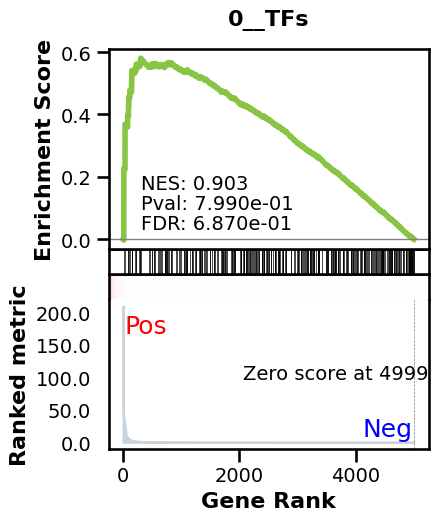

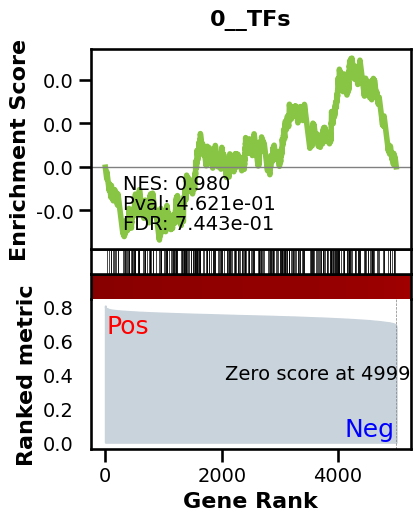

_________________________________________
TF specific enrichment


found some significant results for  17.857142857142858 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.0008182014067845249 
recall:  1.0 
random precision: 0.0008184288112889119



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 49.50it/s]


  8%|▊         | 10/128 [00:00<00:02, 49.27it/s]


 12%|█▏        | 15/128 [00:00<00:02, 48.83it/s]


 16%|█▌        | 20/128 [00:00<00:02, 49.09it/s]


 20%|█▉        | 25/128 [00:00<00:02, 49.29it/s]


 23%|██▎       | 30/128 [00:00<00:01, 49.29it/s]


 27%|██▋       | 35/128 [00:00<00:01, 49.13it/s]


 31%|███▏      | 40/128 [00:00<00:01, 49.15it/s]


 35%|███▌      | 45/128 [00:00<00:01, 49.15it/s]


 39%|███▉      | 50/128 [00:01<00:01, 49.16it/s]


 43%|████▎     | 55/128 [00:01<00:01, 49.24it/s]


 47%|████▋     | 60/128 [00:01<00:01, 49.16it/s]


 51%|█████     | 65/128 [00:01<00:01, 49.04it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 49.19it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 49.21it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 49.26it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 49.25it/s]


 70%|███████   | 90/128 [00:01<00:00, 49.29it/s]


 74%|███████▍  | 95/128 [00:01<00:00, 49.37it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 49.38it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 49.34it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 49.32it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 49.16it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 49.12it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 48.83it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 49.10it/s]

Average Precision (AP):  0.0009118828608531099
Area Under Precision-Recall Curve (AUPRC):  0.0009097992623417129


EPR: 1.384361187840497


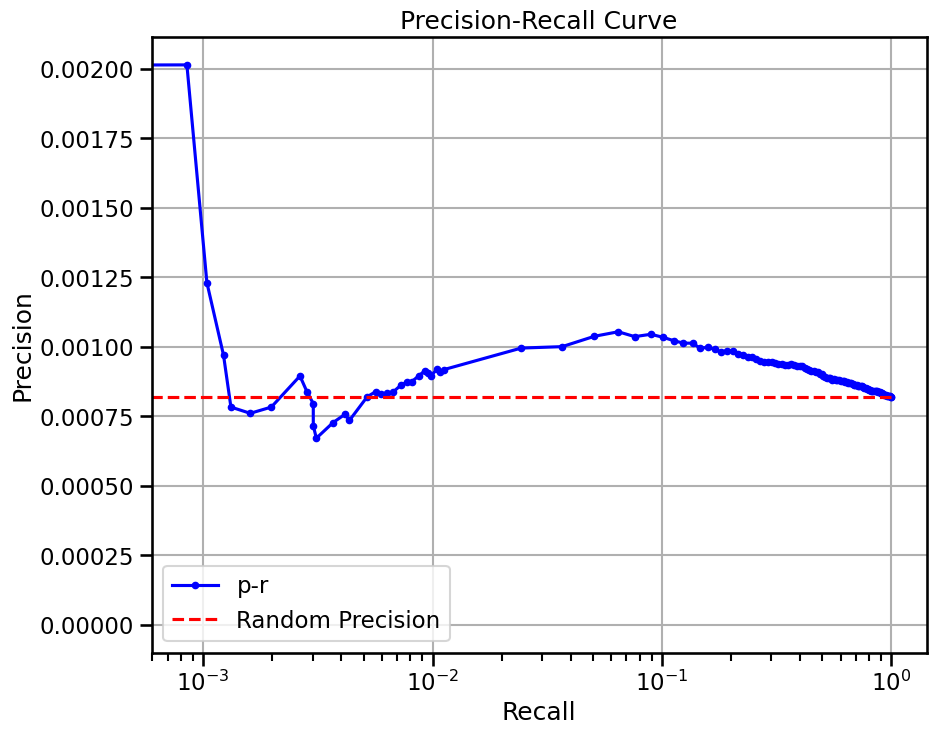

(1024, 5000) amacrine cell
base enrichment


Top central genes: []


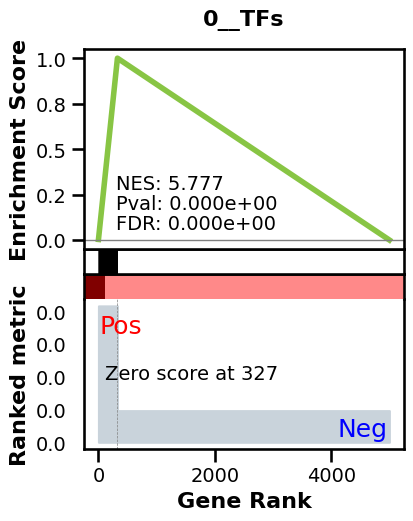

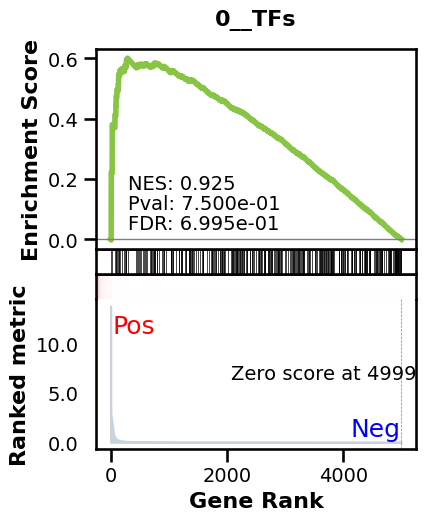

_________________________________________
TF specific enrichment


found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.002897771051454403 
recall:  0.27750518965842613 
random precision: 0.0008184288112889119



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.50it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.49it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.25it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.33it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.37it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.38it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.34it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.31it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.33it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.38it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.45it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.46it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.46it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.35it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.34it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.38it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.42it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.56it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.96it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.00it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.08it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.55it/s]

Average Precision (AP):  0.001735210390586413
Area Under Precision-Recall Curve (AUPRC):  0.001518507295776512
EPR: 3.8221488009794014


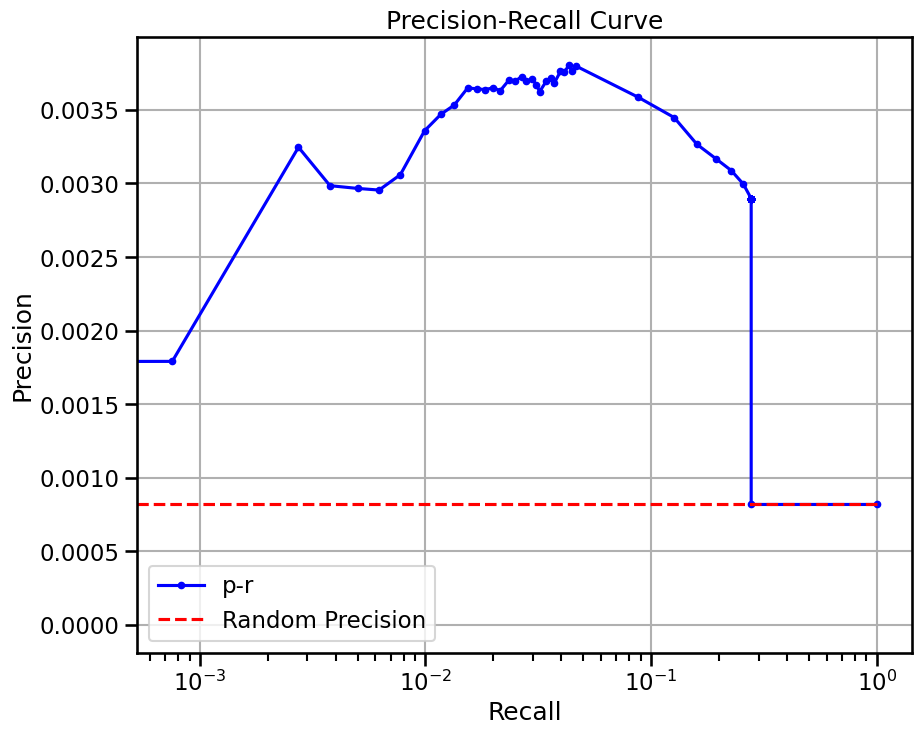

base enrichment


Top central genes: []
The DataFrame contains only the same values.


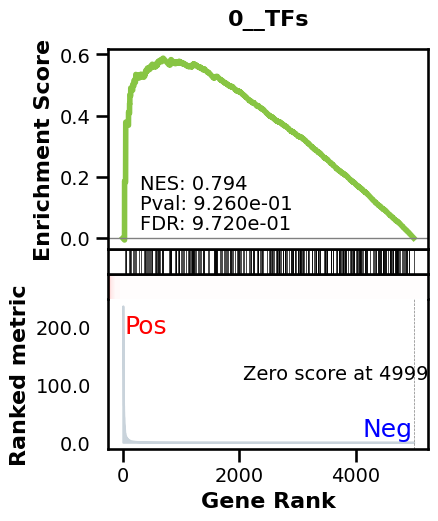

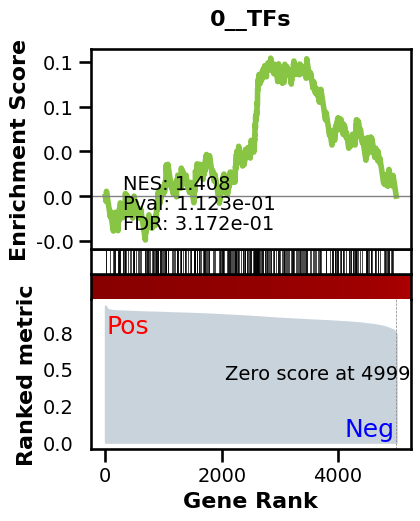

_________________________________________
TF specific enrichment


found some significant results for  7.142857142857143 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.0008182014067845249 
recall:  1.0 
random precision: 0.0008184288112889119



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.12it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.93it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.97it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.99it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.96it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.15it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.18it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.43it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.24it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.10it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.39it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.18it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.91it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.86it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.08it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.25it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.39it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.27it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.24it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.39it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.24it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.14it/s]

Average Precision (AP):  0.0009268121820132506
Area Under Precision-Recall Curve (AUPRC):  0.0009252543327201497
EPR: 1.7314330999024472


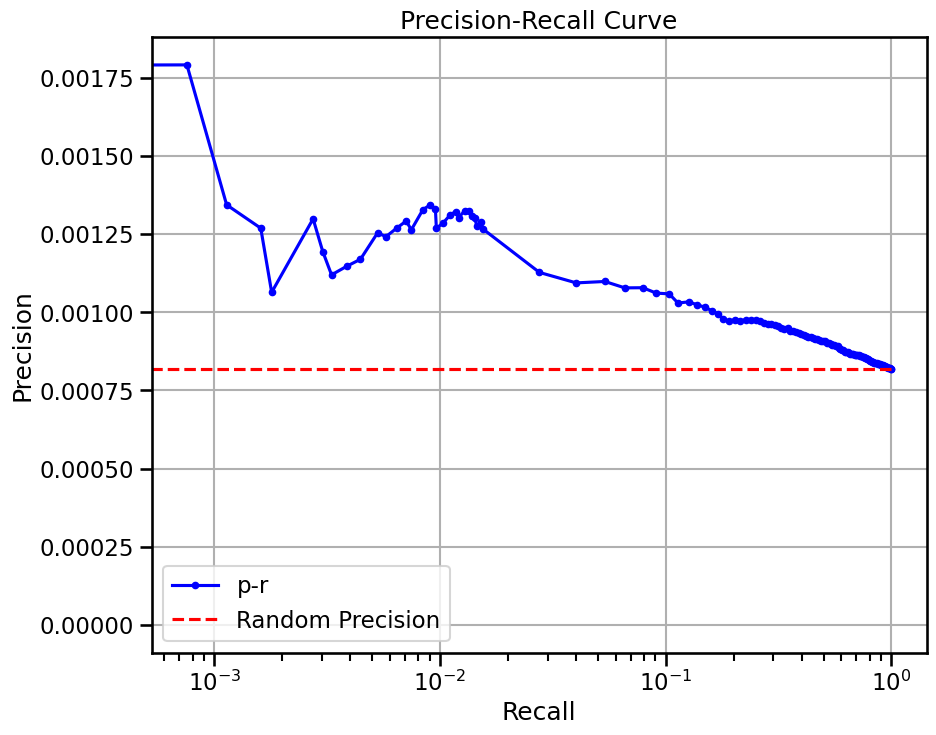

base enrichment


Top central genes: []


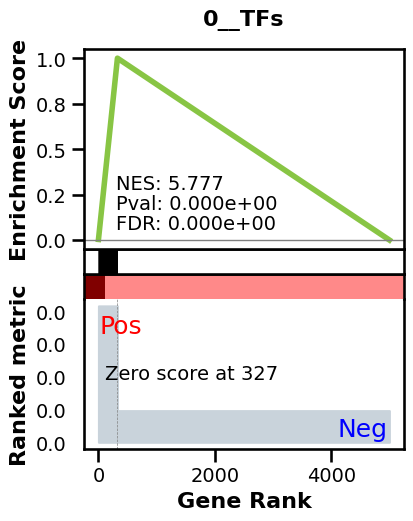

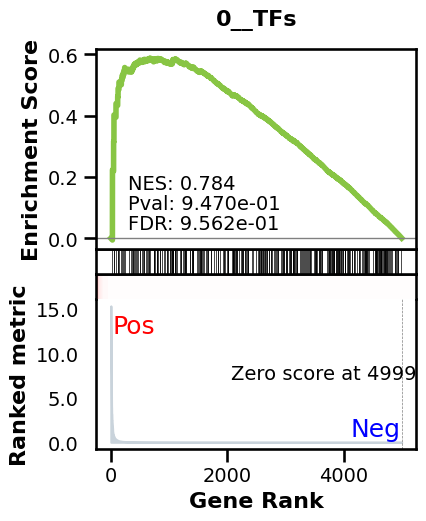

_________________________________________
TF specific enrichment


found some significant results for  3.5714285714285716 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.002897771051454403 
recall:  0.27750518965842613 
random precision: 0.0008184288112889119



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.59it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.68it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.46it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.86it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.66it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.69it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.02it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.86it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.82it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.85it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.95it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.15it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.95it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.11it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.94it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.06it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.27it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 54.14it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.11it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.16it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.22it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.95it/s]

Average Precision (AP):  0.0016863291921058422
Area Under Precision-Recall Curve (AUPRC):  0.0014710339375232037
EPR: 4.872854941637526


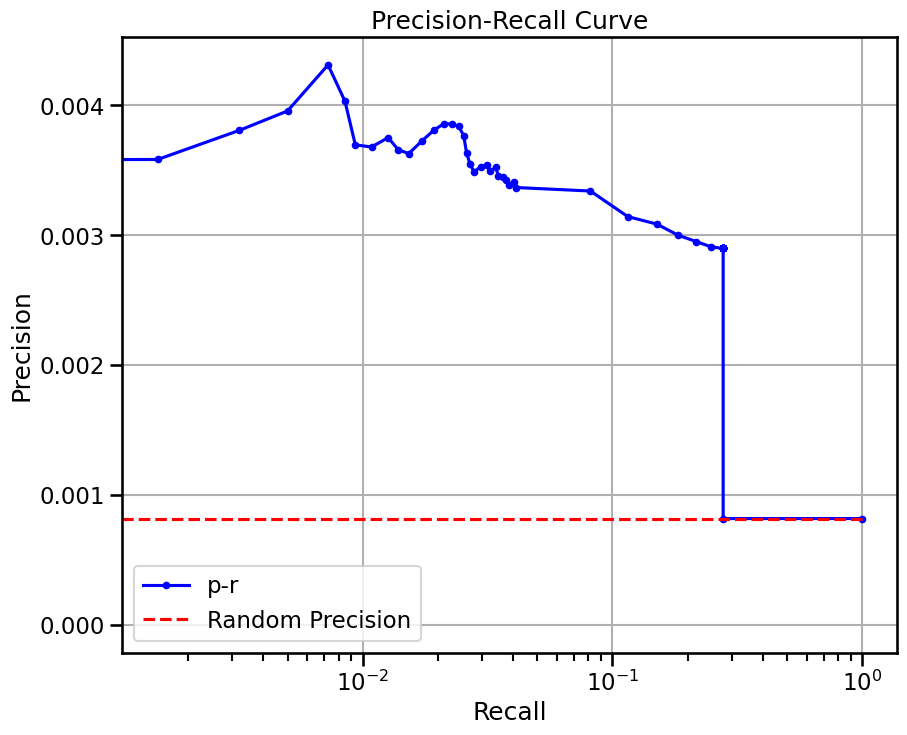


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:12,  2.34s/it]


  6%|▋         | 2/32 [00:03<00:48,  1.60s/it]


  9%|▉         | 3/32 [00:04<00:38,  1.32s/it]


 12%|█▎        | 4/32 [00:05<00:33,  1.18s/it]


 16%|█▌        | 5/32 [00:06<00:29,  1.11s/it]


 19%|█▉        | 6/32 [00:07<00:27,  1.06s/it]


 22%|██▏       | 7/32 [00:08<00:25,  1.04s/it]


 25%|██▌       | 8/32 [00:09<00:24,  1.01s/it]


 28%|██▊       | 9/32 [00:10<00:22,  1.00it/s]


 31%|███▏      | 10/32 [00:11<00:21,  1.01it/s]


 34%|███▍      | 11/32 [00:12<00:20,  1.02it/s]


 38%|███▊      | 12/32 [00:13<00:19,  1.02it/s]


 41%|████      | 13/32 [00:14<00:18,  1.02it/s]


 44%|████▍     | 14/32 [00:15<00:17,  1.02it/s]


 47%|████▋     | 15/32 [00:16<00:16,  1.02it/s]


 50%|█████     | 16/32 [00:17<00:15,  1.02it/s]


 53%|█████▎    | 17/32 [00:18<00:14,  1.02it/s]


 56%|█████▋    | 18/32 [00:19<00:13,  1.02it/s]


 59%|█████▉    | 19/32 [00:20<00:12,  1.02it/s]


 62%|██████▎   | 20/32 [00:20<00:11,  1.02it/s]


 66%|██████▌   | 21/32 [00:21<00:10,  1.02it/s]


 69%|██████▉   | 22/32 [00:22<00:09,  1.02it/s]


 72%|███████▏  | 23/32 [00:23<00:08,  1.02it/s]


 75%|███████▌  | 24/32 [00:24<00:07,  1.02it/s]


 78%|███████▊  | 25/32 [00:25<00:06,  1.02it/s]


 81%|████████▏ | 26/32 [00:26<00:05,  1.02it/s]


 84%|████████▍ | 27/32 [00:27<00:04,  1.02it/s]


 88%|████████▊ | 28/32 [00:28<00:03,  1.02it/s]


 91%|█████████ | 29/32 [00:29<00:02,  1.02it/s]


 94%|█████████▍| 30/32 [00:30<00:01,  1.02it/s]


 97%|█████████▋| 31/32 [00:31<00:00,  1.02it/s]


100%|██████████| 32/32 [00:32<00:00,  1.02it/s]


100%|██████████| 32/32 [00:32<00:00,  1.03s/it]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


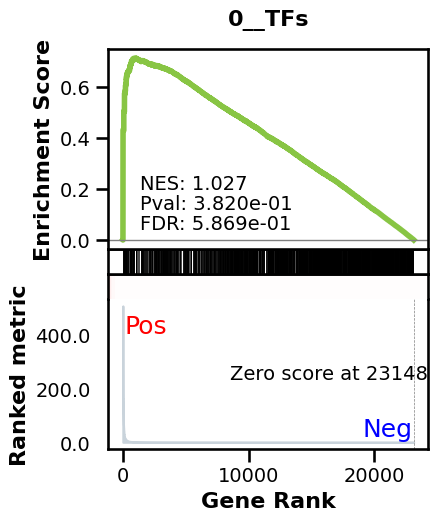

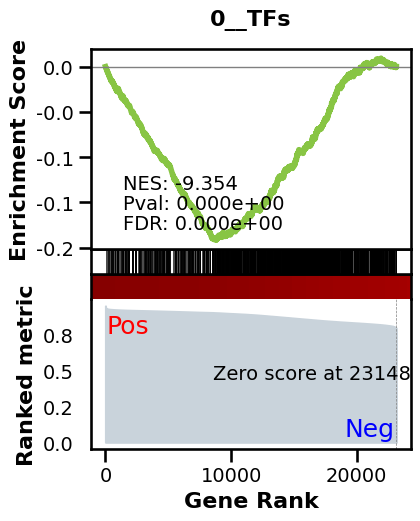

_________________________________________
TF specific enrichment


found some significant results for  41.964285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:37,  3.36it/s]


  2%|▏         | 2/128 [00:00<00:37,  3.34it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.33it/s]


  3%|▎         | 4/128 [00:01<00:37,  3.34it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.34it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.34it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.34it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.34it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.34it/s]


  8%|▊         | 10/128 [00:02<00:35,  3.35it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.34it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.35it/s]


 10%|█         | 13/128 [00:03<00:34,  3.34it/s]


 11%|█         | 14/128 [00:04<00:34,  3.34it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.33it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.34it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.35it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.34it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.35it/s]


 16%|█▌        | 20/128 [00:05<00:32,  3.33it/s]


 16%|█▋        | 21/128 [00:06<00:32,  3.34it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.35it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.34it/s]


 19%|█▉        | 24/128 [00:07<00:31,  3.35it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.35it/s]


 20%|██        | 26/128 [00:07<00:30,  3.35it/s]


 21%|██        | 27/128 [00:08<00:30,  3.35it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.36it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.36it/s]


 23%|██▎       | 30/128 [00:08<00:29,  3.36it/s]


 24%|██▍       | 31/128 [00:09<00:28,  3.37it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.37it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.37it/s]


 27%|██▋       | 34/128 [00:10<00:27,  3.37it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.37it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.36it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.36it/s]


 30%|██▉       | 38/128 [00:11<00:27,  3.33it/s]


 30%|███       | 39/128 [00:11<00:26,  3.32it/s]


 31%|███▏      | 40/128 [00:11<00:26,  3.33it/s]


 32%|███▏      | 41/128 [00:12<00:26,  3.33it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.33it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.34it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.34it/s]


 35%|███▌      | 45/128 [00:13<00:24,  3.34it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.35it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.35it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.34it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.35it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.35it/s]


 40%|███▉      | 51/128 [00:15<00:22,  3.35it/s]


 41%|████      | 52/128 [00:15<00:22,  3.35it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.35it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.35it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.34it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.35it/s]


 45%|████▍     | 57/128 [00:17<00:21,  3.35it/s]


 45%|████▌     | 58/128 [00:17<00:20,  3.35it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.34it/s]


 47%|████▋     | 60/128 [00:17<00:20,  3.35it/s]


 48%|████▊     | 61/128 [00:18<00:19,  3.35it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.35it/s]


 49%|████▉     | 63/128 [00:18<00:19,  3.35it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.35it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.35it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.35it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.34it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.35it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.35it/s]


 55%|█████▍    | 70/128 [00:20<00:17,  3.34it/s]


 55%|█████▌    | 71/128 [00:21<00:17,  3.35it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.35it/s]


 57%|█████▋    | 73/128 [00:21<00:16,  3.35it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.34it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.34it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.34it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.35it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.34it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.34it/s]


 62%|██████▎   | 80/128 [00:23<00:14,  3.35it/s]


 63%|██████▎   | 81/128 [00:24<00:14,  3.35it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.35it/s]


 65%|██████▍   | 83/128 [00:24<00:13,  3.34it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.35it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.35it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.35it/s]


 68%|██████▊   | 87/128 [00:25<00:12,  3.35it/s]


 69%|██████▉   | 88/128 [00:26<00:11,  3.35it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.35it/s]


 70%|███████   | 90/128 [00:26<00:11,  3.35it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.34it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.35it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.35it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.35it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.34it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.35it/s]


 76%|███████▌  | 97/128 [00:28<00:09,  3.35it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.35it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.35it/s]


 78%|███████▊  | 100/128 [00:29<00:08,  3.35it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.35it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.35it/s]


 80%|████████  | 103/128 [00:30<00:08,  3.03it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.12it/s]


 82%|████████▏ | 105/128 [00:31<00:07,  3.19it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.23it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.27it/s]


 84%|████████▍ | 108/128 [00:32<00:06,  3.28it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.30it/s]


 86%|████████▌ | 110/128 [00:32<00:05,  3.32it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.33it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.33it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.33it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.34it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.34it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.35it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.35it/s]


 92%|█████████▏| 118/128 [00:35<00:02,  3.34it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.35it/s]


 94%|█████████▍| 120/128 [00:35<00:02,  3.34it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.35it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.35it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.35it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.35it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.35it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.35it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.35it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.34it/s]


100%|██████████| 128/128 [00:38<00:00,  3.34it/s]

Average Precision (AP):  0.0006521626046246268
Area Under Precision-Recall Curve (AUPRC):  0.0006509400573232791


EPR: 2.8638036943070087


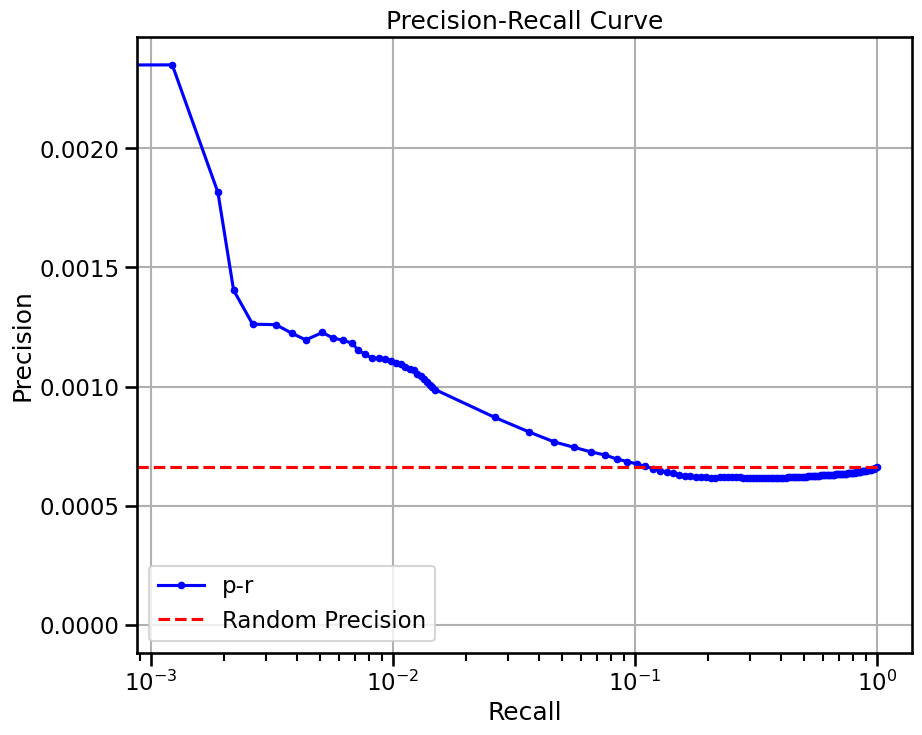


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<02:55,  2.78s/it]


  3%|▎         | 2/64 [00:04<01:59,  1.93s/it]


  5%|▍         | 3/64 [00:05<01:41,  1.66s/it]


  6%|▋         | 4/64 [00:06<01:32,  1.53s/it]


  8%|▊         | 5/64 [00:14<03:50,  3.91s/it]


  9%|▉         | 6/64 [00:16<02:53,  3.00s/it]


 11%|█         | 7/64 [00:17<02:17,  2.42s/it]


 12%|█▎        | 8/64 [00:18<01:53,  2.03s/it]


 14%|█▍        | 9/64 [00:19<01:38,  1.78s/it]


 16%|█▌        | 10/64 [00:21<01:30,  1.68s/it]


 17%|█▋        | 11/64 [00:22<01:23,  1.58s/it]


 19%|█▉        | 12/64 [00:23<01:18,  1.50s/it]


 20%|██        | 13/64 [00:25<01:14,  1.46s/it]


 22%|██▏       | 14/64 [00:26<01:11,  1.42s/it]


 23%|██▎       | 15/64 [00:27<01:08,  1.40s/it]


 25%|██▌       | 16/64 [00:29<01:06,  1.38s/it]


 27%|██▋       | 17/64 [00:30<01:04,  1.37s/it]


 28%|██▊       | 18/64 [00:32<01:02,  1.36s/it]


 30%|██▉       | 19/64 [00:33<01:01,  1.36s/it]


 31%|███▏      | 20/64 [00:34<00:59,  1.35s/it]


 33%|███▎      | 21/64 [00:36<00:58,  1.35s/it]


 34%|███▍      | 22/64 [00:37<00:56,  1.35s/it]


 36%|███▌      | 23/64 [00:38<00:55,  1.35s/it]


 38%|███▊      | 24/64 [00:40<00:53,  1.34s/it]


 39%|███▉      | 25/64 [00:41<00:52,  1.34s/it]


 41%|████      | 26/64 [00:42<00:50,  1.34s/it]


 42%|████▏     | 27/64 [00:44<00:49,  1.34s/it]


 44%|████▍     | 28/64 [00:45<00:48,  1.34s/it]


 45%|████▌     | 29/64 [00:46<00:47,  1.35s/it]


 47%|████▋     | 30/64 [00:48<00:45,  1.34s/it]


 48%|████▊     | 31/64 [00:49<00:44,  1.34s/it]


 50%|█████     | 32/64 [00:50<00:42,  1.33s/it]


 52%|█████▏    | 33/64 [00:52<00:41,  1.33s/it]


 53%|█████▎    | 34/64 [00:53<00:39,  1.33s/it]


 55%|█████▍    | 35/64 [00:54<00:38,  1.33s/it]


 56%|█████▋    | 36/64 [00:56<00:36,  1.31s/it]


 58%|█████▊    | 37/64 [00:57<00:35,  1.30s/it]


 59%|█████▉    | 38/64 [00:58<00:33,  1.30s/it]


 61%|██████    | 39/64 [00:59<00:32,  1.29s/it]


 62%|██████▎   | 40/64 [01:01<00:30,  1.29s/it]


 64%|██████▍   | 41/64 [01:02<00:29,  1.29s/it]


 66%|██████▌   | 42/64 [01:03<00:28,  1.28s/it]


 67%|██████▋   | 43/64 [01:04<00:26,  1.28s/it]


 69%|██████▉   | 44/64 [01:06<00:25,  1.28s/it]


 70%|███████   | 45/64 [01:07<00:24,  1.28s/it]


 72%|███████▏  | 46/64 [01:08<00:23,  1.28s/it]


 73%|███████▎  | 47/64 [01:10<00:21,  1.28s/it]


 75%|███████▌  | 48/64 [01:11<00:20,  1.28s/it]


 77%|███████▋  | 49/64 [01:12<00:19,  1.28s/it]


 78%|███████▊  | 50/64 [01:13<00:17,  1.28s/it]


 80%|███████▉  | 51/64 [01:15<00:16,  1.28s/it]


 81%|████████▏ | 52/64 [01:16<00:15,  1.28s/it]


 83%|████████▎ | 53/64 [01:17<00:14,  1.28s/it]


 84%|████████▍ | 54/64 [01:19<00:12,  1.28s/it]


 86%|████████▌ | 55/64 [01:20<00:11,  1.28s/it]


 88%|████████▊ | 56/64 [01:21<00:10,  1.28s/it]


 89%|████████▉ | 57/64 [01:22<00:08,  1.28s/it]


 91%|█████████ | 58/64 [01:24<00:07,  1.28s/it]


 92%|█████████▏| 59/64 [01:25<00:06,  1.28s/it]


 94%|█████████▍| 60/64 [01:26<00:05,  1.28s/it]


 95%|█████████▌| 61/64 [01:28<00:03,  1.28s/it]


 97%|█████████▋| 62/64 [01:29<00:02,  1.28s/it]


 98%|█████████▊| 63/64 [01:30<00:01,  1.29s/it]


100%|██████████| 64/64 [01:31<00:00,  1.31s/it]


100%|██████████| 64/64 [01:32<00:00,  1.44s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


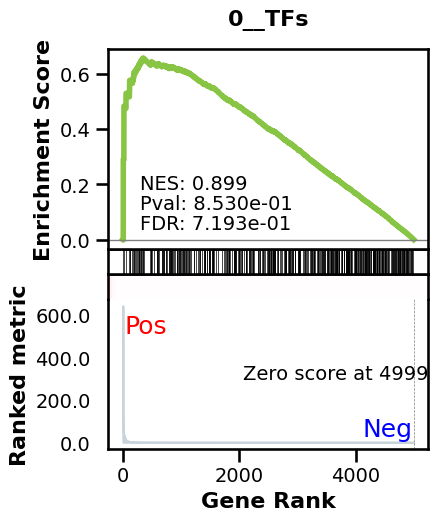

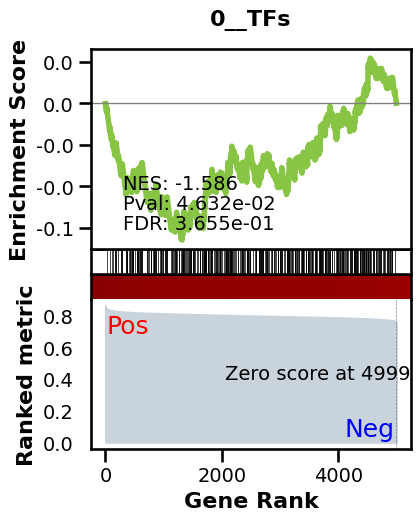

_________________________________________
TF specific enrichment


found some significant results for  10.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.0007672685726278598 
recall:  1.0 
random precision: 0.0007674970623755156



  0%|          | 0/128 [00:00<?, ?it/s]


  2%|▏         | 2/128 [00:00<00:06, 18.90it/s]


  7%|▋         | 9/128 [00:00<00:02, 45.41it/s]


 12%|█▎        | 16/128 [00:00<00:02, 53.70it/s]


 18%|█▊        | 23/128 [00:00<00:01, 57.22it/s]


 23%|██▎       | 30/128 [00:00<00:01, 59.47it/s]


 29%|██▉       | 37/128 [00:00<00:01, 60.64it/s]


 34%|███▍      | 44/128 [00:00<00:01, 61.48it/s]


 40%|███▉      | 51/128 [00:00<00:01, 61.96it/s]


 45%|████▌     | 58/128 [00:00<00:01, 62.31it/s]


 51%|█████     | 65/128 [00:01<00:01, 62.72it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 62.78it/s]


 62%|██████▏   | 79/128 [00:01<00:00, 62.71it/s]


 67%|██████▋   | 86/128 [00:01<00:00, 62.91it/s]


 73%|███████▎  | 93/128 [00:01<00:00, 62.98it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 63.14it/s]


 84%|████████▎ | 107/128 [00:01<00:00, 63.17it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 63.23it/s]


 95%|█████████▍| 121/128 [00:01<00:00, 63.16it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 62.94it/s]


100%|██████████| 128/128 [00:02<00:00, 60.86it/s]

Average Precision (AP):  0.0008219677148834056
Area Under Precision-Recall Curve (AUPRC):  0.0008201634543030816
EPR: 1.3552987525897235


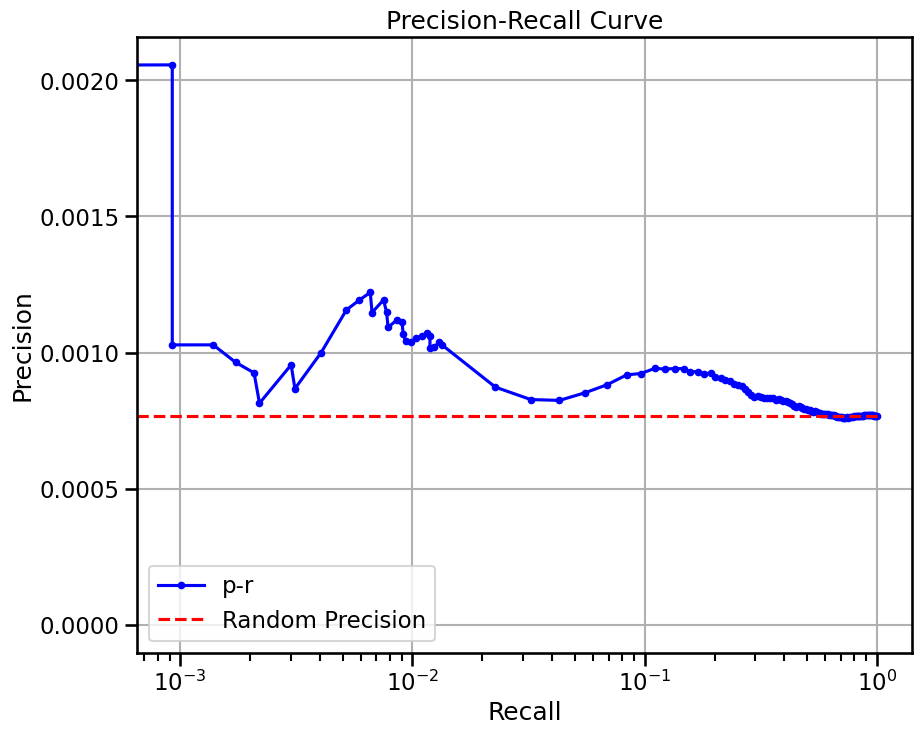

(1024, 5000) ON-bipolar cell
base enrichment


Top central genes: []


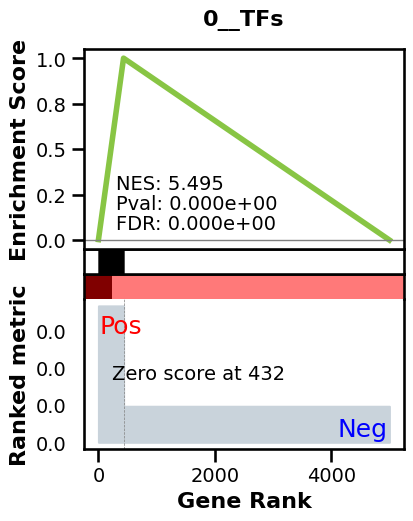

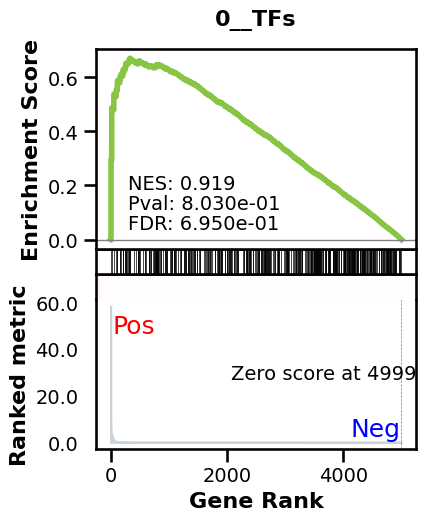

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.002657346649973288 
recall:  0.37634284394131917 
random precision: 0.0007674970623755156



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 65.45it/s]


 11%|█         | 14/128 [00:00<00:01, 64.80it/s]


 16%|█▋        | 21/128 [00:00<00:01, 64.49it/s]


 22%|██▏       | 28/128 [00:00<00:01, 64.59it/s]


 27%|██▋       | 35/128 [00:00<00:01, 64.75it/s]


 33%|███▎      | 42/128 [00:00<00:01, 64.90it/s]


 38%|███▊      | 49/128 [00:00<00:01, 64.85it/s]


 44%|████▍     | 56/128 [00:00<00:01, 65.04it/s]


 49%|████▉     | 63/128 [00:00<00:01, 64.78it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 64.73it/s]


 60%|██████    | 77/128 [00:01<00:00, 64.90it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 64.69it/s]


 71%|███████   | 91/128 [00:01<00:00, 65.02it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 64.79it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 64.66it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 64.86it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 64.78it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 64.86it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 64.76it/s]

Average Precision (AP):  0.0017595912774399666
Area Under Precision-Recall Curve (AUPRC):  0.0014749116412873329
EPR: 3.930752156534792


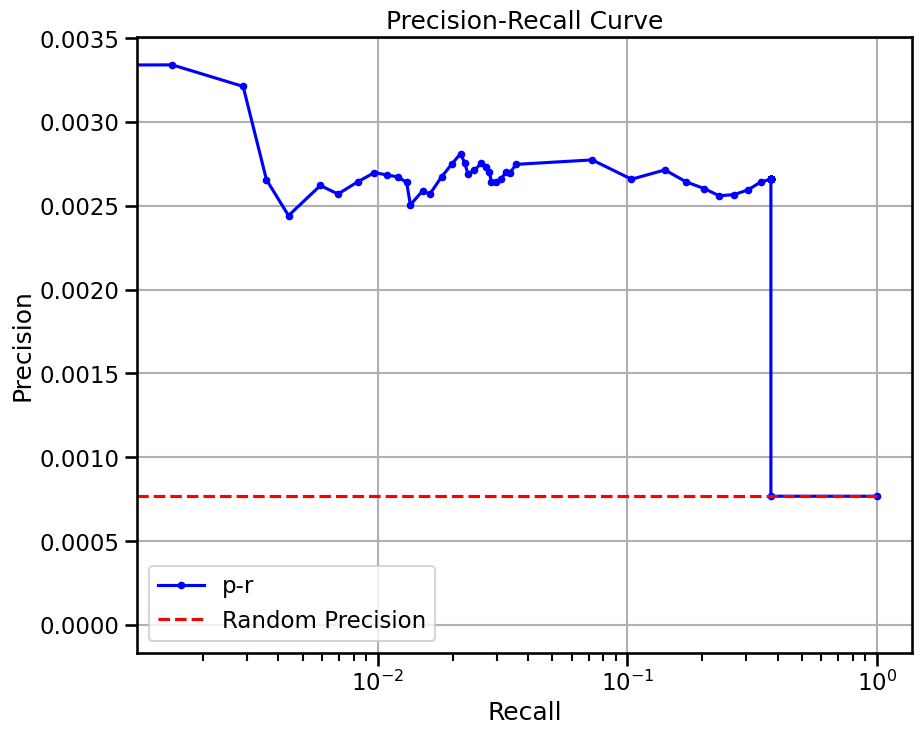

base enrichment


Top central genes: []
The DataFrame contains only the same values.


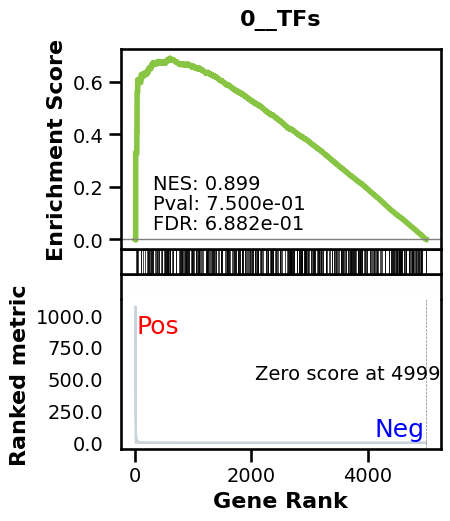

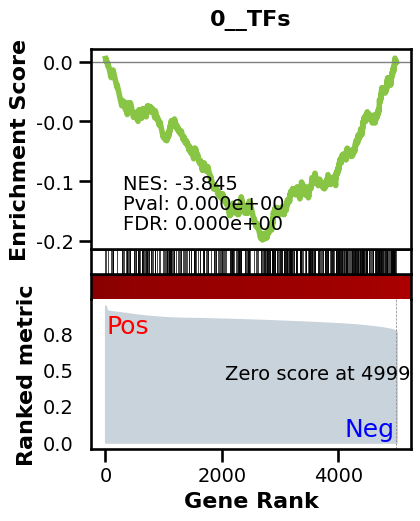

_________________________________________
TF specific enrichment


found some significant results for  3.3333333333333335 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.0007672685726278598 
recall:  1.0 
random precision: 0.0007674970623755156



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 62.39it/s]


 11%|█         | 14/128 [00:00<00:01, 63.04it/s]


 16%|█▋        | 21/128 [00:00<00:01, 63.19it/s]


 22%|██▏       | 28/128 [00:00<00:01, 62.94it/s]


 27%|██▋       | 35/128 [00:00<00:01, 63.12it/s]


 33%|███▎      | 42/128 [00:00<00:01, 63.40it/s]


 38%|███▊      | 49/128 [00:00<00:01, 63.15it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.17it/s]


 49%|████▉     | 63/128 [00:01<00:01, 61.88it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 62.33it/s]


 60%|██████    | 77/128 [00:01<00:00, 62.64it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 62.29it/s]


 71%|███████   | 91/128 [00:01<00:00, 62.51it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 62.60it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 62.60it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 62.61it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 62.09it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 62.66it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 62.53it/s]

Average Precision (AP):  0.0008051489409296677
Area Under Precision-Recall Curve (AUPRC):  0.0008042333285868835
EPR: 1.5062359596402377


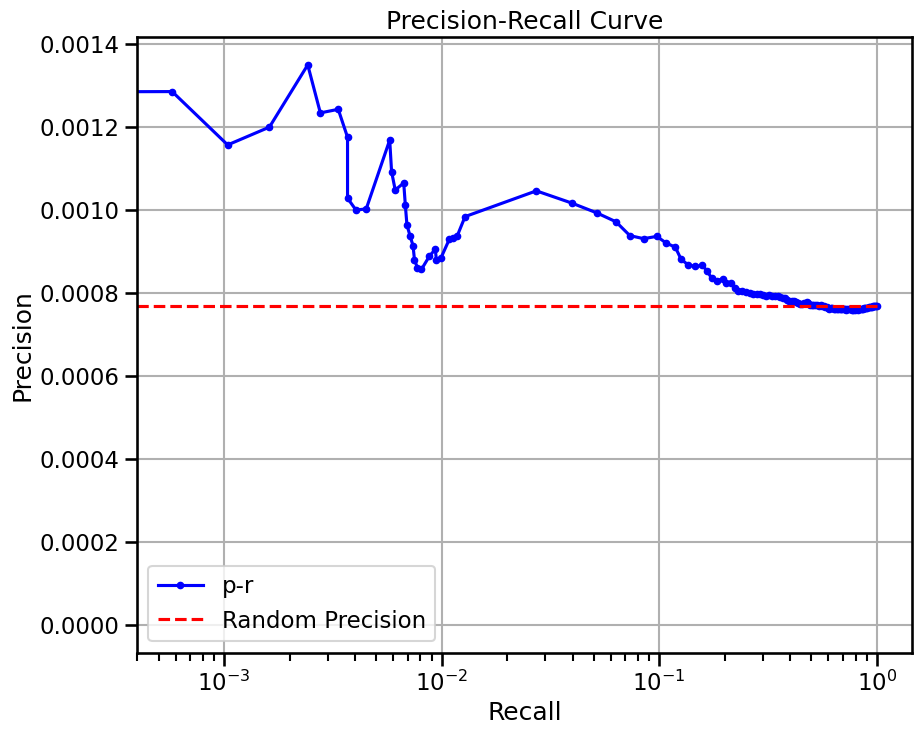

base enrichment


Top central genes: []


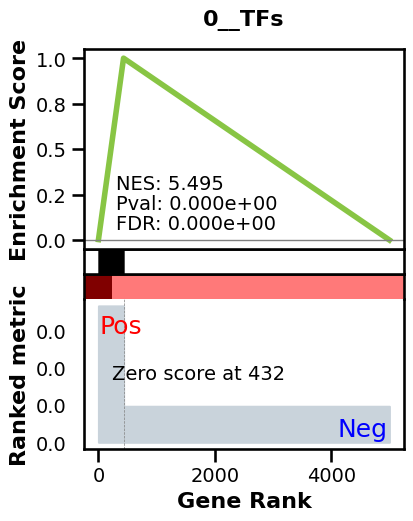

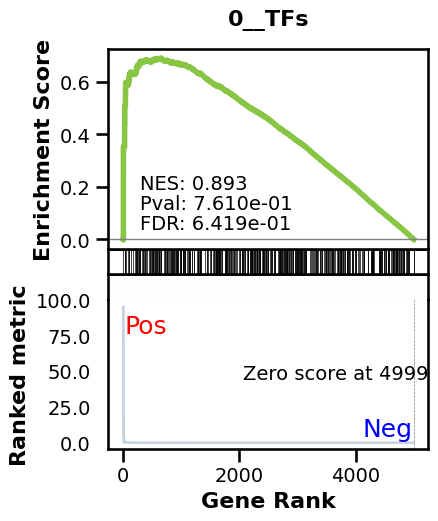

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.002657346649973288 
recall:  0.37634284394131917 
random precision: 0.0007674970623755156



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 63.93it/s]


 11%|█         | 14/128 [00:00<00:01, 63.70it/s]


 16%|█▋        | 21/128 [00:00<00:01, 64.33it/s]


 22%|██▏       | 28/128 [00:00<00:01, 64.29it/s]


 27%|██▋       | 35/128 [00:00<00:01, 64.10it/s]


 33%|███▎      | 42/128 [00:00<00:01, 64.08it/s]


 38%|███▊      | 49/128 [00:00<00:01, 64.08it/s]


 44%|████▍     | 56/128 [00:00<00:01, 64.06it/s]


 49%|████▉     | 63/128 [00:00<00:01, 62.25it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 62.27it/s]


 60%|██████    | 77/128 [00:01<00:00, 62.31it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 62.75it/s]


 71%|███████   | 91/128 [00:01<00:00, 62.14it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 62.64it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 63.09it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 63.55it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 63.55it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 63.94it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 63.35it/s]

Average Precision (AP):  0.0016798029337562375
Area Under Precision-Recall Curve (AUPRC):  0.0014280828640198912
EPR: 3.474786922043095


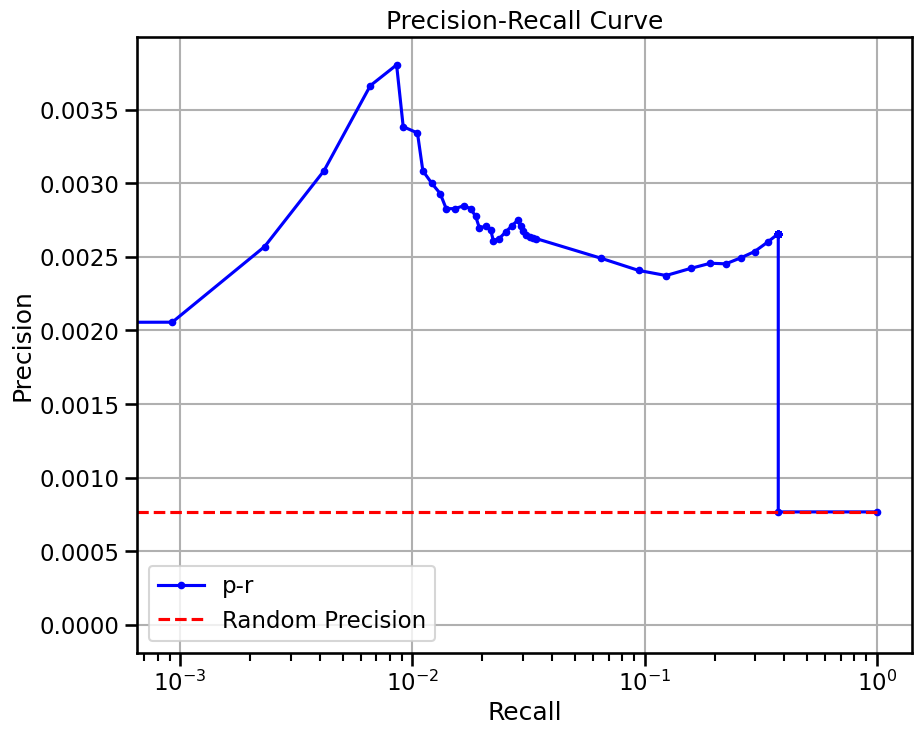


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:13,  2.36s/it]


  6%|▋         | 2/32 [00:03<00:46,  1.55s/it]


  9%|▉         | 3/32 [00:04<00:37,  1.28s/it]


 12%|█▎        | 4/32 [00:05<00:32,  1.17s/it]


 16%|█▌        | 5/32 [00:06<00:29,  1.10s/it]


 19%|█▉        | 6/32 [00:07<00:27,  1.04s/it]


 22%|██▏       | 7/32 [00:08<00:24,  1.02it/s]


 25%|██▌       | 8/32 [00:08<00:22,  1.05it/s]


 28%|██▊       | 9/32 [00:09<00:21,  1.08it/s]


 31%|███▏      | 10/32 [00:10<00:19,  1.10it/s]


 34%|███▍      | 11/32 [00:11<00:18,  1.12it/s]


 38%|███▊      | 12/32 [00:12<00:17,  1.13it/s]


 41%|████      | 13/32 [00:13<00:16,  1.14it/s]


 44%|████▍     | 14/32 [00:14<00:15,  1.14it/s]


 47%|████▋     | 15/32 [00:15<00:14,  1.14it/s]


 50%|█████     | 16/32 [00:15<00:14,  1.13it/s]


 53%|█████▎    | 17/32 [00:16<00:13,  1.12it/s]


 56%|█████▋    | 18/32 [00:17<00:12,  1.12it/s]


 59%|█████▉    | 19/32 [00:18<00:11,  1.13it/s]


 62%|██████▎   | 20/32 [00:19<00:10,  1.13it/s]


 66%|██████▌   | 21/32 [00:20<00:09,  1.13it/s]


 69%|██████▉   | 22/32 [00:21<00:08,  1.14it/s]


 72%|███████▏  | 23/32 [00:22<00:07,  1.14it/s]


 75%|███████▌  | 24/32 [00:22<00:06,  1.16it/s]


 78%|███████▊  | 25/32 [00:23<00:05,  1.17it/s]


 81%|████████▏ | 26/32 [00:24<00:05,  1.18it/s]


 84%|████████▍ | 27/32 [00:25<00:04,  1.19it/s]


 88%|████████▊ | 28/32 [00:26<00:03,  1.19it/s]


 91%|█████████ | 29/32 [00:27<00:02,  1.19it/s]


 94%|█████████▍| 30/32 [00:27<00:01,  1.19it/s]


 97%|█████████▋| 31/32 [00:28<00:00,  1.20it/s]


100%|██████████| 32/32 [00:29<00:00,  1.21it/s]


100%|██████████| 32/32 [00:29<00:00,  1.07it/s]

avg link count: 536200336, sparsity: 1.0


base enrichment


too many genes for central computation


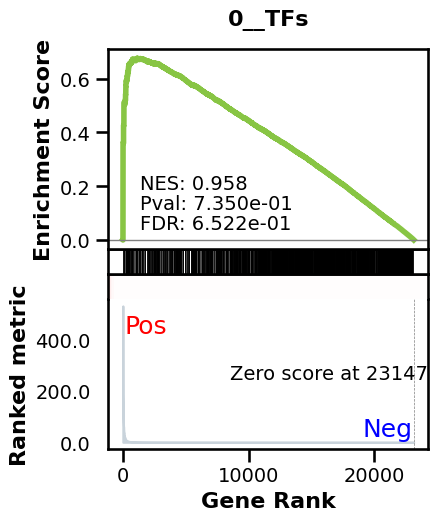

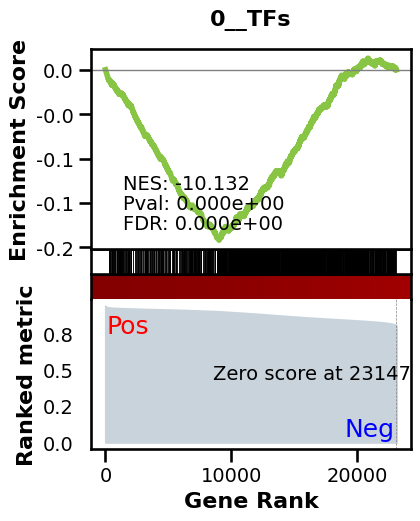

_________________________________________
TF specific enrichment


found some significant results for  42.857142857142854 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12462 genes
intersection pct: 0.5383618455158113


precision:  0.0006617212921716415 
recall:  1.0 
random precision: 0.0006617671177458917



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:46,  2.72it/s]


  2%|▏         | 2/128 [00:00<00:46,  2.68it/s]


  2%|▏         | 3/128 [00:01<00:46,  2.69it/s]


  3%|▎         | 4/128 [00:01<00:45,  2.74it/s]


  4%|▍         | 5/128 [00:01<00:45,  2.71it/s]


  5%|▍         | 6/128 [00:02<00:45,  2.69it/s]


  5%|▌         | 7/128 [00:02<00:44,  2.74it/s]


  6%|▋         | 8/128 [00:02<00:44,  2.72it/s]


  7%|▋         | 9/128 [00:03<00:44,  2.70it/s]


  8%|▊         | 10/128 [00:03<00:43,  2.69it/s]


  9%|▊         | 11/128 [00:04<00:42,  2.73it/s]


  9%|▉         | 12/128 [00:04<00:42,  2.71it/s]


 10%|█         | 13/128 [00:04<00:42,  2.69it/s]


 11%|█         | 14/128 [00:05<00:41,  2.73it/s]


 12%|█▏        | 15/128 [00:05<00:41,  2.71it/s]


 12%|█▎        | 16/128 [00:05<00:41,  2.69it/s]


 13%|█▎        | 17/128 [00:06<00:41,  2.69it/s]


 14%|█▍        | 18/128 [00:06<00:40,  2.73it/s]


 15%|█▍        | 19/128 [00:07<00:40,  2.70it/s]


 16%|█▌        | 20/128 [00:07<00:40,  2.69it/s]


 16%|█▋        | 21/128 [00:07<00:39,  2.74it/s]


 17%|█▋        | 22/128 [00:08<00:39,  2.71it/s]


 18%|█▊        | 23/128 [00:08<00:38,  2.70it/s]


 19%|█▉        | 24/128 [00:08<00:38,  2.70it/s]


 20%|█▉        | 25/128 [00:09<00:37,  2.74it/s]


 20%|██        | 26/128 [00:09<00:37,  2.72it/s]


 21%|██        | 27/128 [00:09<00:37,  2.70it/s]


 22%|██▏       | 28/128 [00:10<00:36,  2.74it/s]


 23%|██▎       | 29/128 [00:10<00:36,  2.72it/s]


 23%|██▎       | 30/128 [00:11<00:36,  2.70it/s]


 24%|██▍       | 31/128 [00:11<00:35,  2.72it/s]


 25%|██▌       | 32/128 [00:11<00:34,  2.75it/s]


 26%|██▌       | 33/128 [00:12<00:34,  2.72it/s]


 27%|██▋       | 34/128 [00:12<00:34,  2.70it/s]


 27%|██▋       | 35/128 [00:12<00:33,  2.74it/s]


 28%|██▊       | 36/128 [00:13<00:33,  2.72it/s]


 29%|██▉       | 37/128 [00:13<00:33,  2.70it/s]


 30%|██▉       | 38/128 [00:14<00:33,  2.72it/s]


 30%|███       | 39/128 [00:14<00:32,  2.73it/s]


 31%|███▏      | 40/128 [00:14<00:32,  2.71it/s]


 32%|███▏      | 41/128 [00:15<00:32,  2.71it/s]


 33%|███▎      | 42/128 [00:15<00:31,  2.73it/s]


 34%|███▎      | 43/128 [00:15<00:30,  2.75it/s]


 34%|███▍      | 44/128 [00:16<00:30,  2.78it/s]


 35%|███▌      | 45/128 [00:16<00:29,  2.80it/s]


 36%|███▌      | 46/128 [00:16<00:29,  2.82it/s]


 37%|███▋      | 47/128 [00:17<00:28,  2.83it/s]


 38%|███▊      | 48/128 [00:17<00:28,  2.84it/s]


 38%|███▊      | 49/128 [00:17<00:27,  2.84it/s]


 39%|███▉      | 50/128 [00:18<00:27,  2.85it/s]


 40%|███▉      | 51/128 [00:18<00:27,  2.85it/s]


 41%|████      | 52/128 [00:18<00:26,  2.85it/s]


 41%|████▏     | 53/128 [00:19<00:26,  2.86it/s]


 42%|████▏     | 54/128 [00:19<00:25,  2.87it/s]


 43%|████▎     | 55/128 [00:20<00:25,  2.87it/s]


 44%|████▍     | 56/128 [00:20<00:25,  2.86it/s]


 45%|████▍     | 57/128 [00:20<00:24,  2.86it/s]


 45%|████▌     | 58/128 [00:21<00:24,  2.86it/s]


 46%|████▌     | 59/128 [00:21<00:24,  2.87it/s]


 47%|████▋     | 60/128 [00:21<00:23,  2.86it/s]


 48%|████▊     | 61/128 [00:22<00:23,  2.87it/s]


 48%|████▊     | 62/128 [00:22<00:22,  2.87it/s]


 49%|████▉     | 63/128 [00:22<00:22,  2.86it/s]


 50%|█████     | 64/128 [00:23<00:22,  2.87it/s]


 51%|█████     | 65/128 [00:23<00:21,  2.87it/s]


 52%|█████▏    | 66/128 [00:23<00:21,  2.87it/s]


 52%|█████▏    | 67/128 [00:24<00:21,  2.87it/s]


 53%|█████▎    | 68/128 [00:24<00:20,  2.87it/s]


 54%|█████▍    | 69/128 [00:24<00:20,  2.87it/s]


 55%|█████▍    | 70/128 [00:25<00:20,  2.86it/s]


 55%|█████▌    | 71/128 [00:25<00:19,  2.86it/s]


 56%|█████▋    | 72/128 [00:25<00:19,  2.87it/s]


 57%|█████▋    | 73/128 [00:26<00:19,  2.86it/s]


 58%|█████▊    | 74/128 [00:26<00:18,  2.87it/s]


 59%|█████▊    | 75/128 [00:27<00:18,  2.86it/s]


 59%|█████▉    | 76/128 [00:27<00:18,  2.87it/s]


 60%|██████    | 77/128 [00:27<00:17,  2.87it/s]


 61%|██████    | 78/128 [00:28<00:17,  2.87it/s]


 62%|██████▏   | 79/128 [00:28<00:17,  2.87it/s]


 62%|██████▎   | 80/128 [00:28<00:16,  2.87it/s]


 63%|██████▎   | 81/128 [00:29<00:16,  2.87it/s]


 64%|██████▍   | 82/128 [00:29<00:16,  2.87it/s]


 65%|██████▍   | 83/128 [00:29<00:15,  2.87it/s]


 66%|██████▌   | 84/128 [00:30<00:15,  2.87it/s]


 66%|██████▋   | 85/128 [00:30<00:15,  2.87it/s]


 67%|██████▋   | 86/128 [00:30<00:14,  2.87it/s]


 68%|██████▊   | 87/128 [00:31<00:14,  2.87it/s]


 69%|██████▉   | 88/128 [00:31<00:13,  2.87it/s]


 70%|██████▉   | 89/128 [00:31<00:13,  2.87it/s]


 70%|███████   | 90/128 [00:32<00:13,  2.87it/s]


 71%|███████   | 91/128 [00:32<00:12,  2.87it/s]


 72%|███████▏  | 92/128 [00:32<00:12,  2.87it/s]


 73%|███████▎  | 93/128 [00:33<00:12,  2.87it/s]


 73%|███████▎  | 94/128 [00:33<00:11,  2.87it/s]


 74%|███████▍  | 95/128 [00:33<00:11,  2.87it/s]


 75%|███████▌  | 96/128 [00:34<00:11,  2.87it/s]


 76%|███████▌  | 97/128 [00:34<00:10,  2.87it/s]


 77%|███████▋  | 98/128 [00:35<00:10,  2.87it/s]


 77%|███████▋  | 99/128 [00:35<00:10,  2.87it/s]


 78%|███████▊  | 100/128 [00:35<00:09,  2.87it/s]


 79%|███████▉  | 101/128 [00:36<00:09,  2.87it/s]


 80%|███████▉  | 102/128 [00:36<00:09,  2.87it/s]


 80%|████████  | 103/128 [00:36<00:08,  2.87it/s]


 81%|████████▏ | 104/128 [00:37<00:08,  2.87it/s]


 82%|████████▏ | 105/128 [00:37<00:08,  2.87it/s]


 83%|████████▎ | 106/128 [00:37<00:07,  2.87it/s]


 84%|████████▎ | 107/128 [00:38<00:07,  2.87it/s]


 84%|████████▍ | 108/128 [00:38<00:06,  2.87it/s]


 85%|████████▌ | 109/128 [00:38<00:06,  2.87it/s]


 86%|████████▌ | 110/128 [00:39<00:06,  2.87it/s]


 87%|████████▋ | 111/128 [00:39<00:05,  2.87it/s]


 88%|████████▊ | 112/128 [00:39<00:05,  2.87it/s]


 88%|████████▊ | 113/128 [00:40<00:05,  2.87it/s]


 89%|████████▉ | 114/128 [00:40<00:04,  2.87it/s]


 90%|████████▉ | 115/128 [00:40<00:04,  2.87it/s]


 91%|█████████ | 116/128 [00:41<00:04,  2.87it/s]


 91%|█████████▏| 117/128 [00:41<00:03,  2.87it/s]


 92%|█████████▏| 118/128 [00:41<00:03,  2.87it/s]


 93%|█████████▎| 119/128 [00:42<00:03,  2.87it/s]


 94%|█████████▍| 120/128 [00:42<00:02,  2.87it/s]


 95%|█████████▍| 121/128 [00:43<00:02,  2.87it/s]


 95%|█████████▌| 122/128 [00:43<00:02,  2.87it/s]


 96%|█████████▌| 123/128 [00:43<00:01,  2.87it/s]


 97%|█████████▋| 124/128 [00:44<00:01,  2.87it/s]


 98%|█████████▊| 125/128 [00:44<00:01,  2.87it/s]


 98%|█████████▊| 126/128 [00:44<00:00,  2.87it/s]


 99%|█████████▉| 127/128 [00:45<00:00,  2.87it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:45<00:00,  2.87it/s]


100%|██████████| 128/128 [00:45<00:00,  2.82it/s]

Average Precision (AP):  0.0006429634529576377
Area Under Precision-Recall Curve (AUPRC):  0.0006427549478221043


EPR: 2.2595149693140377


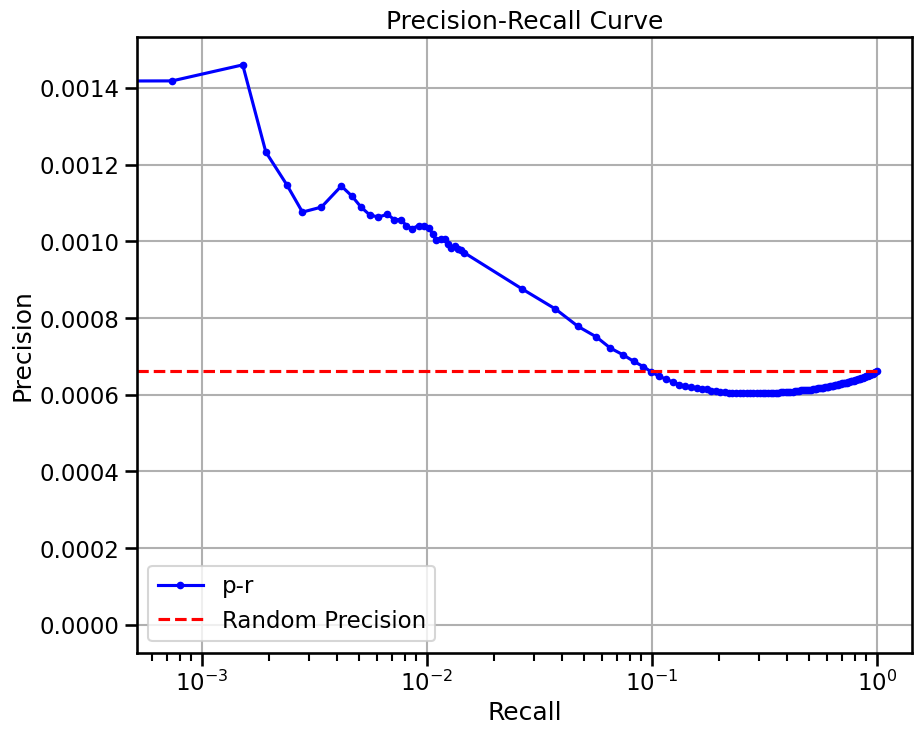


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:03<03:13,  3.08s/it]


  3%|▎         | 2/64 [00:04<02:09,  2.08s/it]


  5%|▍         | 3/64 [00:05<01:47,  1.76s/it]


  6%|▋         | 4/64 [00:07<01:37,  1.63s/it]


  8%|▊         | 5/64 [00:10<02:15,  2.30s/it]


  9%|▉         | 6/64 [00:12<01:55,  1.99s/it]


 11%|█         | 7/64 [00:13<01:42,  1.79s/it]


 12%|█▎        | 8/64 [00:14<01:33,  1.66s/it]


 14%|█▍        | 9/64 [00:16<01:26,  1.57s/it]


 16%|█▌        | 10/64 [00:17<01:21,  1.51s/it]


 17%|█▋        | 11/64 [00:19<01:17,  1.47s/it]


 19%|█▉        | 12/64 [00:20<01:15,  1.45s/it]


 20%|██        | 13/64 [00:21<01:12,  1.42s/it]


 22%|██▏       | 14/64 [00:23<01:10,  1.41s/it]


 23%|██▎       | 15/64 [00:24<01:08,  1.40s/it]


 25%|██▌       | 16/64 [00:25<01:07,  1.40s/it]


 27%|██▋       | 17/64 [00:27<01:05,  1.39s/it]


 28%|██▊       | 18/64 [00:28<01:04,  1.39s/it]


 30%|██▉       | 19/64 [00:30<01:02,  1.39s/it]


 31%|███▏      | 20/64 [00:31<01:01,  1.39s/it]


 33%|███▎      | 21/64 [00:32<00:59,  1.38s/it]


 34%|███▍      | 22/64 [00:34<00:58,  1.38s/it]


 36%|███▌      | 23/64 [00:35<00:56,  1.38s/it]


 38%|███▊      | 24/64 [00:37<00:55,  1.38s/it]


 39%|███▉      | 25/64 [00:38<00:53,  1.38s/it]


 41%|████      | 26/64 [00:39<00:52,  1.38s/it]


 42%|████▏     | 27/64 [00:41<00:51,  1.38s/it]


 44%|████▍     | 28/64 [00:42<00:49,  1.38s/it]


 45%|████▌     | 29/64 [00:43<00:48,  1.38s/it]


 47%|████▋     | 30/64 [00:45<00:46,  1.38s/it]


 48%|████▊     | 31/64 [00:46<00:45,  1.38s/it]


 50%|█████     | 32/64 [00:48<00:44,  1.39s/it]


 52%|█████▏    | 33/64 [00:49<00:42,  1.37s/it]


 53%|█████▎    | 34/64 [00:50<00:41,  1.37s/it]


 55%|█████▍    | 35/64 [00:52<00:39,  1.36s/it]


 56%|█████▋    | 36/64 [00:53<00:38,  1.36s/it]


 58%|█████▊    | 37/64 [00:54<00:36,  1.36s/it]


 59%|█████▉    | 38/64 [00:56<00:35,  1.36s/it]


 61%|██████    | 39/64 [00:57<00:33,  1.35s/it]


 62%|██████▎   | 40/64 [00:58<00:32,  1.36s/it]


 64%|██████▍   | 41/64 [01:00<00:31,  1.36s/it]


 66%|██████▌   | 42/64 [01:01<00:29,  1.35s/it]


 67%|██████▋   | 43/64 [01:02<00:28,  1.34s/it]


 69%|██████▉   | 44/64 [01:04<00:26,  1.34s/it]


 70%|███████   | 45/64 [01:05<00:25,  1.33s/it]


 72%|███████▏  | 46/64 [01:06<00:23,  1.31s/it]


 73%|███████▎  | 47/64 [01:08<00:22,  1.31s/it]


 75%|███████▌  | 48/64 [01:09<00:20,  1.30s/it]


 77%|███████▋  | 49/64 [01:10<00:19,  1.30s/it]


 78%|███████▊  | 50/64 [01:11<00:18,  1.30s/it]


 80%|███████▉  | 51/64 [01:13<00:16,  1.30s/it]


 81%|████████▏ | 52/64 [01:14<00:15,  1.30s/it]


 83%|████████▎ | 53/64 [01:15<00:14,  1.30s/it]


 84%|████████▍ | 54/64 [01:17<00:12,  1.30s/it]


 86%|████████▌ | 55/64 [01:18<00:11,  1.30s/it]


 88%|████████▊ | 56/64 [01:19<00:10,  1.30s/it]


 89%|████████▉ | 57/64 [01:21<00:09,  1.30s/it]


 91%|█████████ | 58/64 [01:22<00:07,  1.30s/it]


 92%|█████████▏| 59/64 [01:23<00:06,  1.30s/it]


 94%|█████████▍| 60/64 [01:24<00:05,  1.30s/it]


 95%|█████████▌| 61/64 [01:26<00:03,  1.29s/it]


 97%|█████████▋| 62/64 [01:27<00:02,  1.30s/it]


 98%|█████████▊| 63/64 [01:28<00:01,  1.30s/it]


100%|██████████| 64/64 [01:30<00:00,  1.30s/it]


100%|██████████| 64/64 [01:30<00:00,  1.41s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


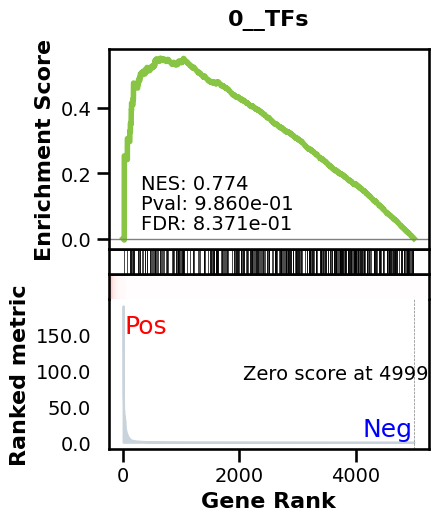

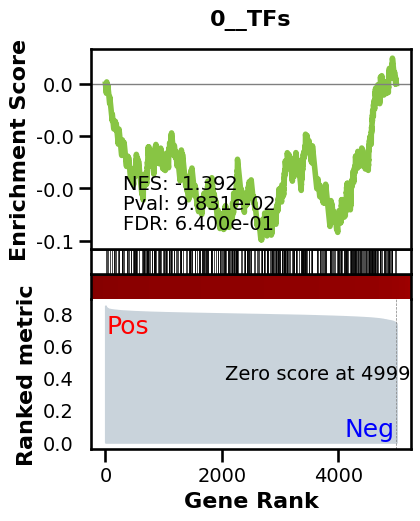

_________________________________________
TF specific enrichment


found some significant results for  3.5714285714285716 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0006722946797520661 
recall:  1.0 
random precision: 0.0006724857268335529



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.80it/s]


  9%|▉         | 12/128 [00:00<00:02, 57.91it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.00it/s]


 19%|█▉        | 24/128 [00:00<00:01, 57.95it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.10it/s]


 28%|██▊       | 36/128 [00:00<00:01, 57.90it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.13it/s]


 38%|███▊      | 48/128 [00:00<00:01, 57.88it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.15it/s]


 47%|████▋     | 60/128 [00:01<00:01, 57.97it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.86it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 57.91it/s]


 61%|██████    | 78/128 [00:01<00:00, 58.00it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.12it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.06it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.26it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.00it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.21it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 58.09it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.15it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.09it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.02it/s]

Average Precision (AP):  0.0007204726228216037
Area Under Precision-Recall Curve (AUPRC):  0.0007204337784150512
EPR: 0.5352068388595964


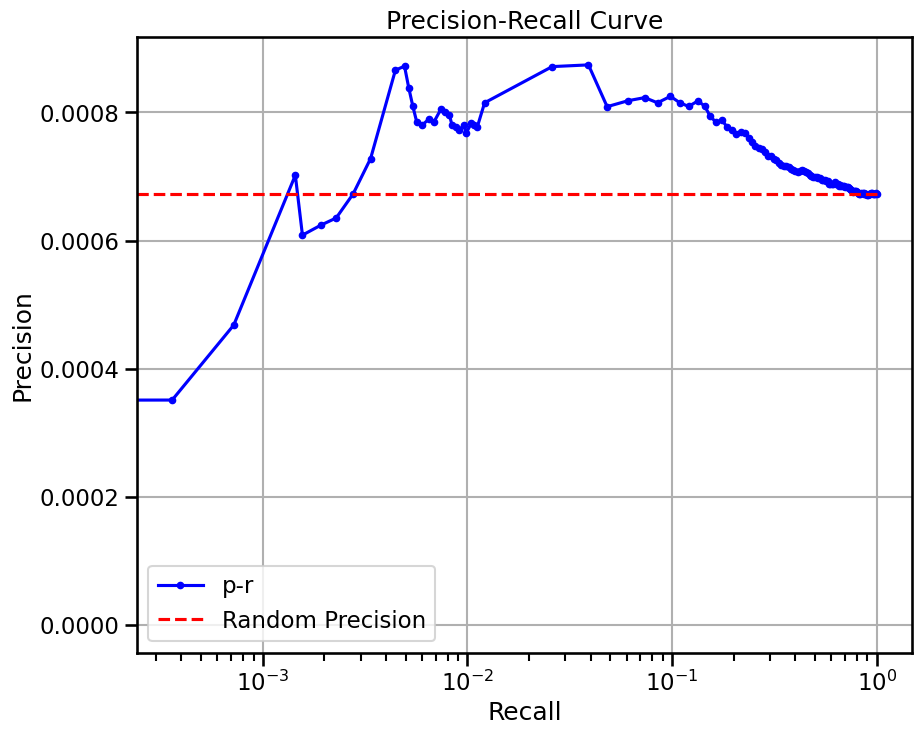

(1024, 5000) rod bipolar cell
base enrichment


Top central genes: []


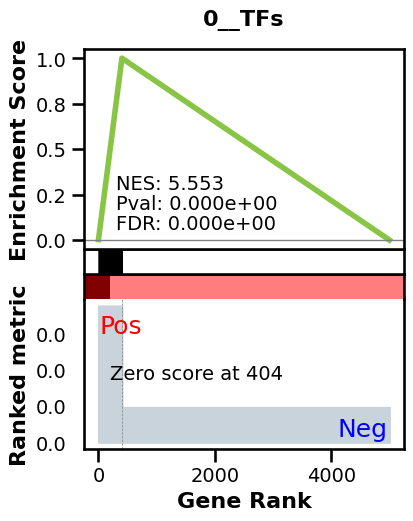

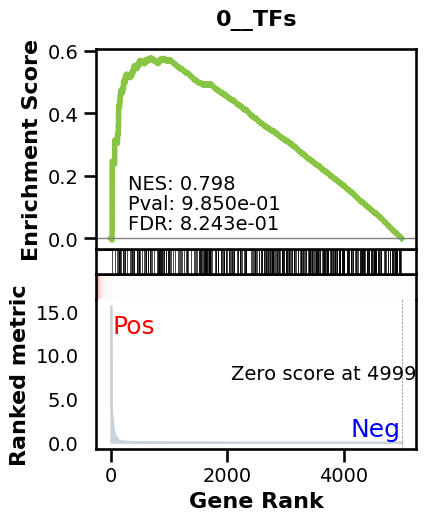

_________________________________________
TF specific enrichment


found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0016893262987012986 
recall:  0.2398559423769508 
random precision: 0.0006724857268335529



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 53.62it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.68it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.77it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.76it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.76it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.76it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.80it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.87it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.85it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.85it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.73it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.61it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.53it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.46it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.40it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.27it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.23it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.21it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.13it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.17it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.15it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.44it/s]

Average Precision (AP):  0.0010821396739942942
Area Under Precision-Recall Curve (AUPRC):  0.000974425595452439
EPR: 2.8633730133630975


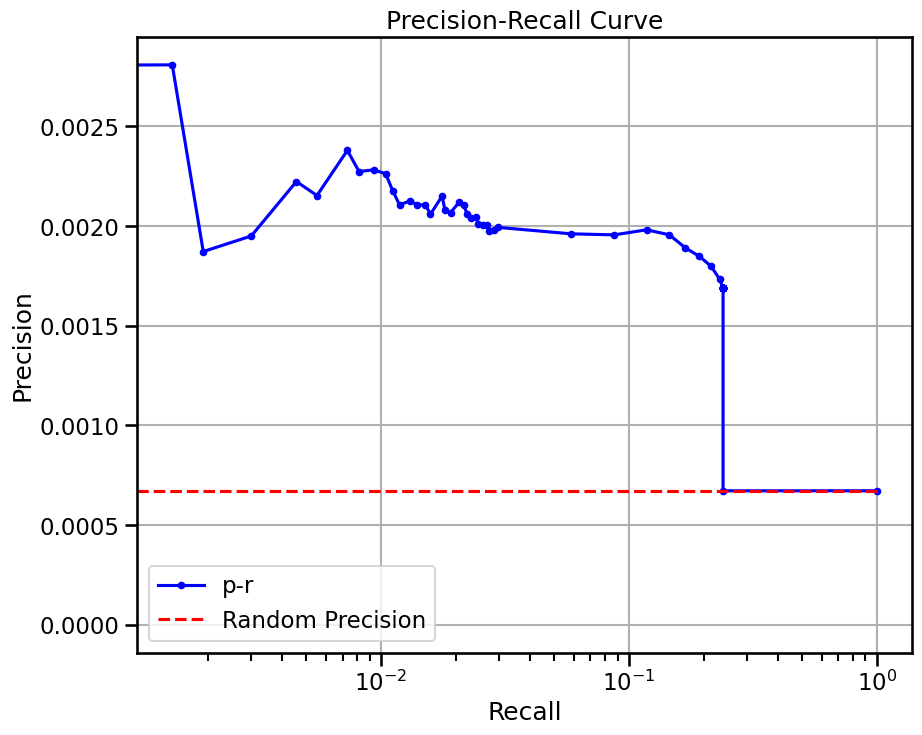

base enrichment


Top central genes: []
The DataFrame contains only the same values.


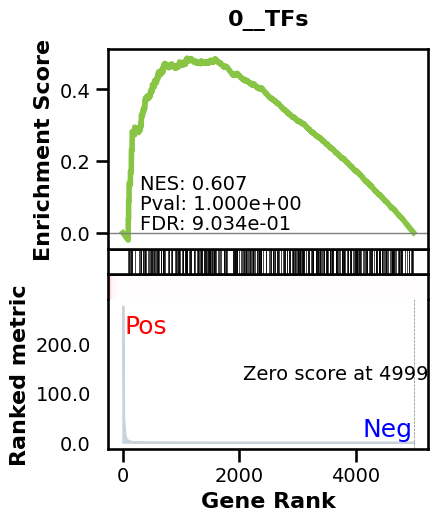

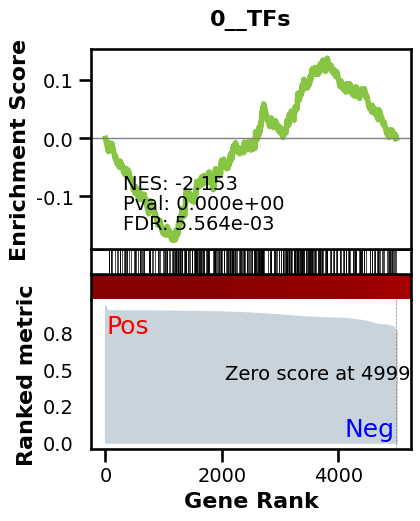

_________________________________________
TF specific enrichment


found some significant results for  3.5714285714285716 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0006722946797520661 
recall:  1.0 
random precision: 0.0006724857268335529



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.18it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.21it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.62it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.28it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.68it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.72it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.84it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.93it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.98it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.04it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.49it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.88it/s]


 61%|██████    | 78/128 [00:01<00:00, 57.05it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 57.21it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.63it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.47it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.42it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.53it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.61it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.67it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.78it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.96it/s]

Average Precision (AP):  0.0007345599156204139
Area Under Precision-Recall Curve (AUPRC):  0.0007334316102575969
EPR: 1.6079376518227628


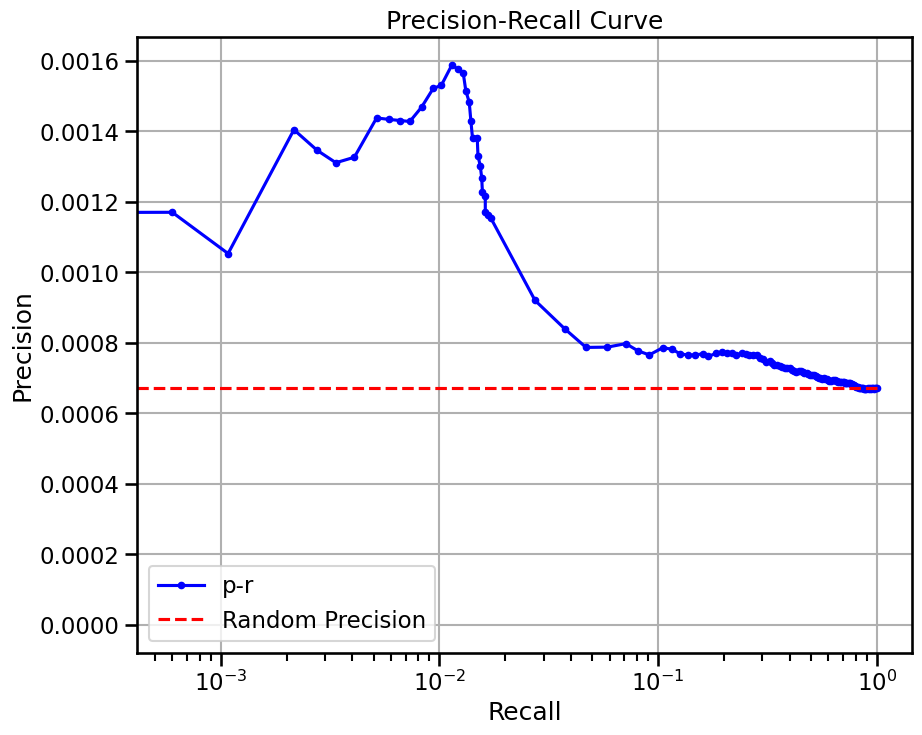

base enrichment


Top central genes: []


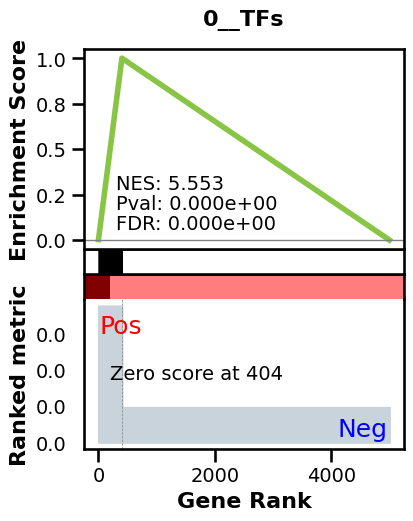

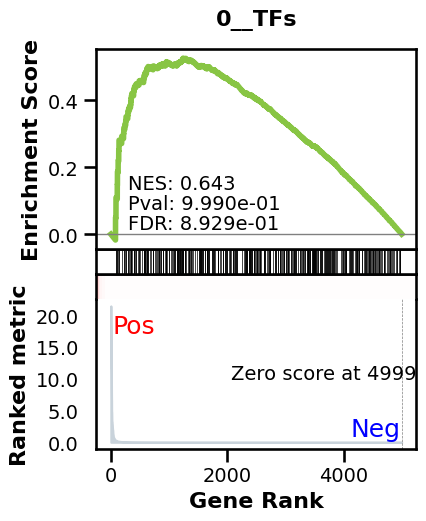

_________________________________________
TF specific enrichment


found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0016893262987012986 
recall:  0.2398559423769508 
random precision: 0.0006724857268335529



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 49.28it/s]


  8%|▊         | 10/128 [00:00<00:02, 48.66it/s]


 12%|█▏        | 15/128 [00:00<00:02, 48.48it/s]


 16%|█▋        | 21/128 [00:00<00:02, 49.21it/s]


 21%|██        | 27/128 [00:00<00:02, 49.53it/s]


 26%|██▌       | 33/128 [00:00<00:01, 49.72it/s]


 30%|██▉       | 38/128 [00:00<00:01, 49.14it/s]


 34%|███▎      | 43/128 [00:00<00:01, 49.17it/s]


 38%|███▊      | 48/128 [00:00<00:01, 49.24it/s]


 42%|████▏     | 54/128 [00:01<00:01, 49.45it/s]


 47%|████▋     | 60/128 [00:01<00:01, 49.73it/s]


 51%|█████     | 65/128 [00:01<00:01, 49.70it/s]


 55%|█████▌    | 71/128 [00:01<00:01, 49.87it/s]


 60%|██████    | 77/128 [00:01<00:01, 49.93it/s]


 64%|██████▍   | 82/128 [00:01<00:00, 49.59it/s]


 68%|██████▊   | 87/128 [00:01<00:00, 49.57it/s]


 73%|███████▎  | 93/128 [00:01<00:00, 49.69it/s]


 77%|███████▋  | 99/128 [00:01<00:00, 49.93it/s]


 81%|████████▏ | 104/128 [00:02<00:00, 49.88it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 50.12it/s]


 91%|█████████ | 116/128 [00:02<00:00, 50.18it/s]


 95%|█████████▌| 122/128 [00:02<00:00, 50.15it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.03it/s]


100%|██████████| 128/128 [00:02<00:00, 49.67it/s]

Average Precision (AP):  0.0010919116416748863
Area Under Precision-Recall Curve (AUPRC):  0.0009798084994837026
EPR: 3.582663950034827


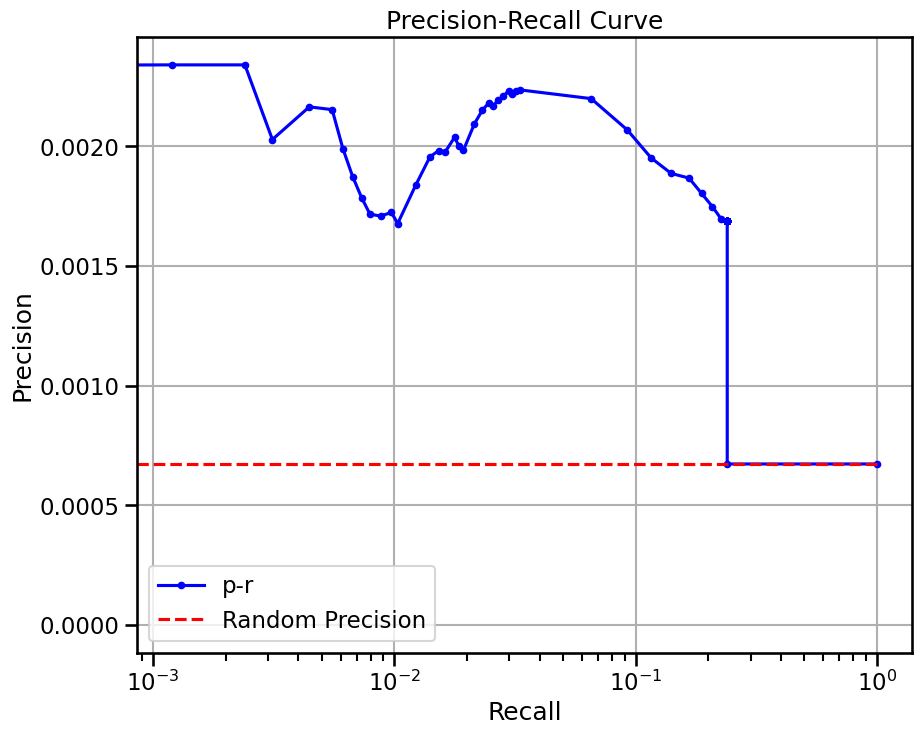


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:08,  2.22s/it]


  6%|▋         | 2/32 [00:03<00:42,  1.41s/it]


  9%|▉         | 3/32 [00:04<00:37,  1.28s/it]


 12%|█▎        | 4/32 [00:05<00:32,  1.17s/it]


 16%|█▌        | 5/32 [00:06<00:30,  1.12s/it]


 19%|█▉        | 6/32 [00:07<00:26,  1.02s/it]


 22%|██▏       | 7/32 [00:07<00:23,  1.05it/s]


 25%|██▌       | 8/32 [00:08<00:22,  1.06it/s]


 28%|██▊       | 9/32 [00:09<00:20,  1.11it/s]


 31%|███▏      | 10/32 [00:10<00:19,  1.13it/s]


 34%|███▍      | 11/32 [00:11<00:18,  1.14it/s]


 38%|███▊      | 12/32 [00:12<00:17,  1.17it/s]


 41%|████      | 13/32 [00:12<00:16,  1.19it/s]


 44%|████▍     | 14/32 [00:13<00:15,  1.20it/s]


 47%|████▋     | 15/32 [00:15<00:16,  1.03it/s]


 50%|█████     | 16/32 [00:16<00:15,  1.03it/s]


 53%|█████▎    | 17/32 [00:17<00:14,  1.02it/s]


 56%|█████▋    | 18/32 [00:17<00:13,  1.02it/s]


 59%|█████▉    | 19/32 [00:18<00:12,  1.02it/s]


 62%|██████▎   | 20/32 [00:19<00:11,  1.01it/s]


 66%|██████▌   | 21/32 [00:20<00:10,  1.01it/s]


 69%|██████▉   | 22/32 [00:21<00:09,  1.01it/s]


 72%|███████▏  | 23/32 [00:22<00:08,  1.06it/s]


 75%|███████▌  | 24/32 [00:23<00:07,  1.11it/s]


 78%|███████▊  | 25/32 [00:24<00:06,  1.15it/s]


 81%|████████▏ | 26/32 [00:25<00:05,  1.18it/s]


 84%|████████▍ | 27/32 [00:26<00:04,  1.19it/s]


 88%|████████▊ | 28/32 [00:26<00:03,  1.20it/s]


 91%|█████████ | 29/32 [00:27<00:02,  1.21it/s]


 94%|█████████▍| 30/32 [00:28<00:01,  1.22it/s]


 97%|█████████▋| 31/32 [00:29<00:00,  1.23it/s]


100%|██████████| 32/32 [00:30<00:00,  1.24it/s]


100%|██████████| 32/32 [00:30<00:00,  1.06it/s]

avg link count: 535043161, sparsity: 1.0


base enrichment


too many genes for central computation


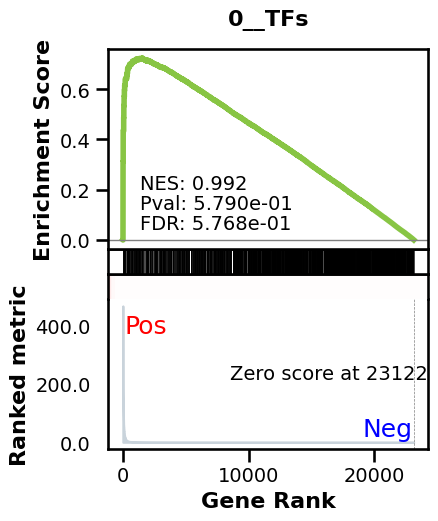

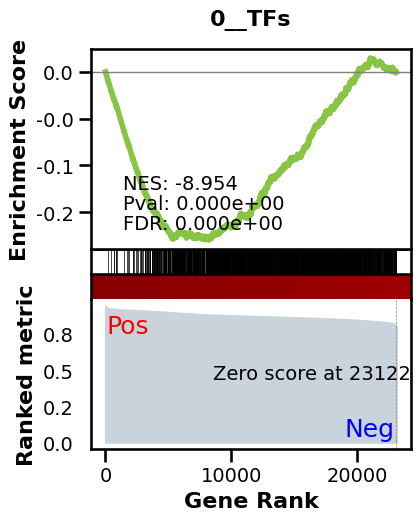

_________________________________________
TF specific enrichment


found some significant results for  29.464285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12458 genes
intersection pct: 0.5387709207282793


precision:  0.0006620149655492691 
recall:  1.0 
random precision: 0.0006620608464118063



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:37,  3.36it/s]


  2%|▏         | 2/128 [00:00<00:37,  3.35it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.35it/s]


  3%|▎         | 4/128 [00:01<00:37,  3.35it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.35it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.35it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.35it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.35it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.35it/s]


  8%|▊         | 10/128 [00:02<00:35,  3.36it/s]


  9%|▊         | 11/128 [00:03<00:34,  3.36it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.36it/s]


 10%|█         | 13/128 [00:03<00:34,  3.35it/s]


 11%|█         | 14/128 [00:04<00:34,  3.35it/s]


 12%|█▏        | 15/128 [00:04<00:33,  3.35it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.36it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.36it/s]


 14%|█▍        | 18/128 [00:05<00:32,  3.35it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.35it/s]


 16%|█▌        | 20/128 [00:05<00:32,  3.35it/s]


 16%|█▋        | 21/128 [00:06<00:31,  3.35it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.35it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.35it/s]


 19%|█▉        | 24/128 [00:07<00:31,  3.35it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.35it/s]


 20%|██        | 26/128 [00:07<00:30,  3.34it/s]


 21%|██        | 27/128 [00:08<00:30,  3.34it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.34it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.34it/s]


 23%|██▎       | 30/128 [00:08<00:29,  3.34it/s]


 24%|██▍       | 31/128 [00:09<00:29,  3.34it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.34it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.34it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.34it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.34it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.35it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.35it/s]


 30%|██▉       | 38/128 [00:11<00:26,  3.35it/s]


 30%|███       | 39/128 [00:11<00:26,  3.34it/s]


 31%|███▏      | 40/128 [00:11<00:26,  3.35it/s]


 32%|███▏      | 41/128 [00:12<00:25,  3.35it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.35it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.35it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.35it/s]


 35%|███▌      | 45/128 [00:13<00:24,  3.35it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.35it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.36it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.36it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.35it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.36it/s]


 40%|███▉      | 51/128 [00:15<00:22,  3.36it/s]


 41%|████      | 52/128 [00:15<00:22,  3.35it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.35it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.35it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.35it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.35it/s]


 45%|████▍     | 57/128 [00:17<00:21,  3.35it/s]


 45%|████▌     | 58/128 [00:17<00:20,  3.34it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.35it/s]


 47%|████▋     | 60/128 [00:18<00:22,  2.98it/s]


 48%|████▊     | 61/128 [00:18<00:21,  3.08it/s]


 48%|████▊     | 62/128 [00:18<00:20,  3.16it/s]


 49%|████▉     | 63/128 [00:18<00:20,  3.21it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.25it/s]


 51%|█████     | 65/128 [00:19<00:19,  3.28it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.30it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.32it/s]


 53%|█████▎    | 68/128 [00:20<00:18,  3.33it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.33it/s]


 55%|█████▍    | 70/128 [00:21<00:17,  3.33it/s]


 55%|█████▌    | 71/128 [00:21<00:17,  3.34it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.34it/s]


 57%|█████▋    | 73/128 [00:21<00:16,  3.35it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.35it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.35it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.35it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.34it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.35it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.36it/s]


 62%|██████▎   | 80/128 [00:24<00:14,  3.36it/s]


 63%|██████▎   | 81/128 [00:24<00:13,  3.37it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.37it/s]


 65%|██████▍   | 83/128 [00:24<00:13,  3.37it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.37it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.37it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.36it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.35it/s]


 69%|██████▉   | 88/128 [00:26<00:12,  3.33it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.32it/s]


 70%|███████   | 90/128 [00:26<00:11,  3.33it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.33it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.34it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.34it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.34it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.34it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.34it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.35it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.34it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.35it/s]


 78%|███████▊  | 100/128 [00:29<00:08,  3.32it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.32it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.33it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.32it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.33it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.32it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.32it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.33it/s]


 84%|████████▍ | 108/128 [00:32<00:06,  3.32it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.33it/s]


 86%|████████▌ | 110/128 [00:32<00:05,  3.34it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.34it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.34it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.35it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.35it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.35it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.35it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.35it/s]


 92%|█████████▏| 118/128 [00:35<00:02,  3.34it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.34it/s]


 94%|█████████▍| 120/128 [00:35<00:02,  3.35it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.35it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.35it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.35it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.35it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.35it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.35it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.35it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.34it/s]


100%|██████████| 128/128 [00:38<00:00,  3.34it/s]

Average Precision (AP):  0.0006200539019542533
Area Under Precision-Recall Curve (AUPRC):  0.0006197477478950533


EPR: 1.9858497228754526


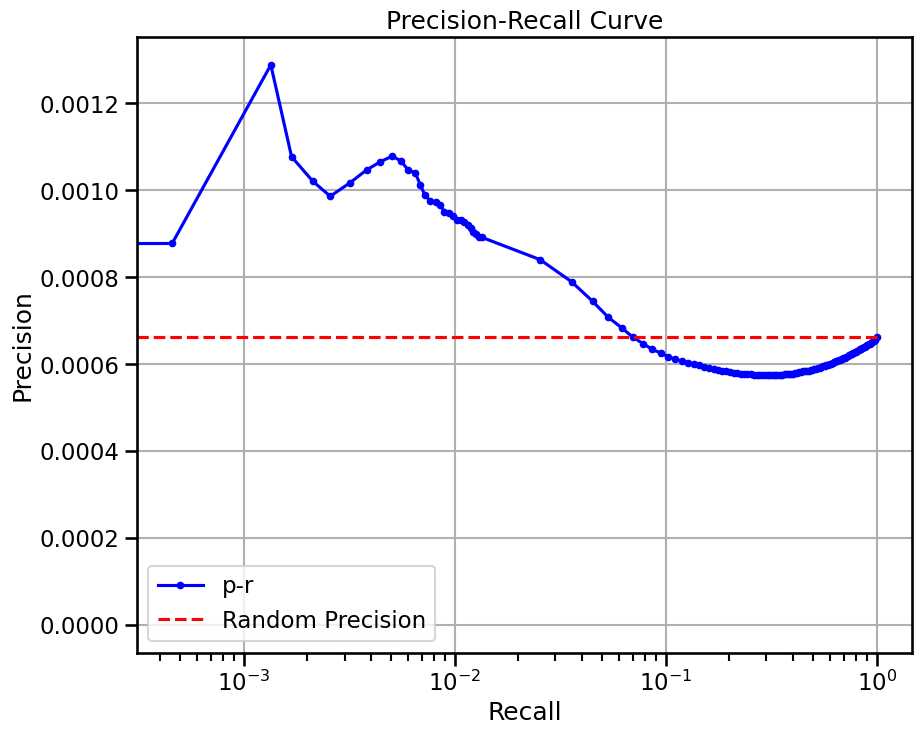


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:03<03:11,  3.03s/it]


  3%|▎         | 2/64 [00:04<02:06,  2.04s/it]


  5%|▍         | 3/64 [00:05<01:41,  1.66s/it]


  6%|▋         | 4/64 [00:06<01:29,  1.49s/it]


  8%|▊         | 5/64 [00:08<01:22,  1.40s/it]


  9%|▉         | 6/64 [00:09<01:26,  1.49s/it]


 11%|█         | 7/64 [00:11<01:21,  1.42s/it]


 12%|█▎        | 8/64 [00:12<01:19,  1.42s/it]


 14%|█▍        | 9/64 [00:13<01:14,  1.36s/it]


 16%|█▌        | 10/64 [00:14<01:11,  1.32s/it]


 17%|█▋        | 11/64 [00:16<01:08,  1.29s/it]


 19%|█▉        | 12/64 [00:17<01:06,  1.27s/it]


 20%|██        | 13/64 [00:18<01:04,  1.26s/it]


 22%|██▏       | 14/64 [00:19<01:02,  1.25s/it]


 23%|██▎       | 15/64 [00:21<01:00,  1.24s/it]


 25%|██▌       | 16/64 [00:22<00:59,  1.23s/it]


 27%|██▋       | 17/64 [00:23<00:57,  1.23s/it]


 28%|██▊       | 18/64 [00:24<00:56,  1.23s/it]


 30%|██▉       | 19/64 [00:25<00:55,  1.22s/it]


 31%|███▏      | 20/64 [00:27<00:53,  1.22s/it]


 33%|███▎      | 21/64 [00:28<00:52,  1.22s/it]


 34%|███▍      | 22/64 [00:29<00:51,  1.22s/it]


 36%|███▌      | 23/64 [00:30<00:50,  1.22s/it]


 38%|███▊      | 24/64 [00:31<00:48,  1.22s/it]


 39%|███▉      | 25/64 [00:33<00:47,  1.22s/it]


 41%|████      | 26/64 [00:34<00:46,  1.22s/it]


 42%|████▏     | 27/64 [00:35<00:45,  1.22s/it]


 44%|████▍     | 28/64 [00:36<00:43,  1.22s/it]


 45%|████▌     | 29/64 [00:38<00:42,  1.22s/it]


 47%|████▋     | 30/64 [00:39<00:41,  1.22s/it]


 48%|████▊     | 31/64 [00:40<00:40,  1.22s/it]


 50%|█████     | 32/64 [00:41<00:38,  1.22s/it]


 52%|█████▏    | 33/64 [00:42<00:37,  1.22s/it]


 53%|█████▎    | 34/64 [00:44<00:36,  1.22s/it]


 55%|█████▍    | 35/64 [00:45<00:34,  1.21s/it]


 56%|█████▋    | 36/64 [00:46<00:33,  1.19s/it]


 58%|█████▊    | 37/64 [00:47<00:31,  1.17s/it]


 59%|█████▉    | 38/64 [00:48<00:30,  1.16s/it]


 61%|██████    | 39/64 [00:49<00:28,  1.15s/it]


 62%|██████▎   | 40/64 [00:51<00:27,  1.14s/it]


 64%|██████▍   | 41/64 [00:52<00:26,  1.14s/it]


 66%|██████▌   | 42/64 [00:53<00:25,  1.14s/it]


 67%|██████▋   | 43/64 [00:54<00:23,  1.14s/it]


 69%|██████▉   | 44/64 [00:55<00:22,  1.13s/it]


 70%|███████   | 45/64 [00:56<00:21,  1.13s/it]


 72%|███████▏  | 46/64 [00:57<00:20,  1.13s/it]


 73%|███████▎  | 47/64 [00:58<00:19,  1.13s/it]


 75%|███████▌  | 48/64 [01:00<00:18,  1.13s/it]


 77%|███████▋  | 49/64 [01:01<00:16,  1.12s/it]


 78%|███████▊  | 50/64 [01:02<00:15,  1.12s/it]


 80%|███████▉  | 51/64 [01:03<00:14,  1.13s/it]


 81%|████████▏ | 52/64 [01:04<00:13,  1.13s/it]


 83%|████████▎ | 53/64 [01:05<00:12,  1.12s/it]


 84%|████████▍ | 54/64 [01:06<00:11,  1.12s/it]


 86%|████████▌ | 55/64 [01:07<00:10,  1.12s/it]


 88%|████████▊ | 56/64 [01:09<00:08,  1.12s/it]


 89%|████████▉ | 57/64 [01:10<00:07,  1.13s/it]


 91%|█████████ | 58/64 [01:11<00:06,  1.12s/it]


 92%|█████████▏| 59/64 [01:12<00:05,  1.12s/it]


 94%|█████████▍| 60/64 [01:13<00:04,  1.11s/it]


 95%|█████████▌| 61/64 [01:14<00:03,  1.11s/it]


 97%|█████████▋| 62/64 [01:15<00:02,  1.11s/it]


 98%|█████████▊| 63/64 [01:16<00:01,  1.11s/it]


100%|██████████| 64/64 [01:17<00:00,  1.11s/it]


100%|██████████| 64/64 [01:18<00:00,  1.22s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


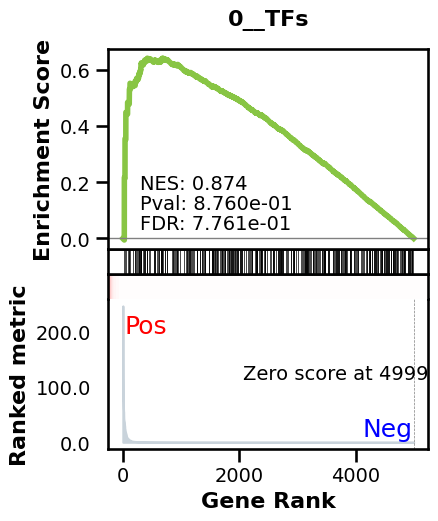

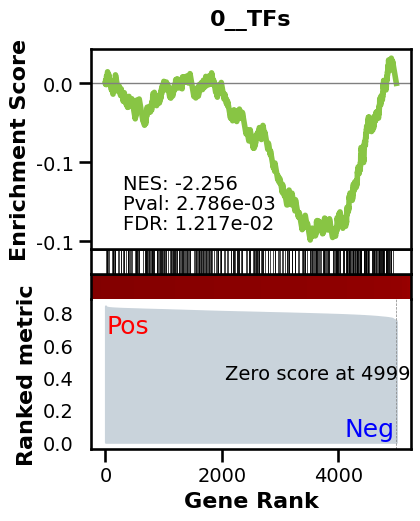

_________________________________________
TF specific enrichment


found some significant results for  6.0606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.0007678674904977909 
recall:  1.0 
random precision: 0.0007680855727160522



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.56it/s]


  9%|▉         | 12/128 [00:00<00:02, 57.73it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.58it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.36it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.21it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.13it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.12it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.62it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.97it/s]


 47%|████▋     | 60/128 [00:01<00:01, 57.26it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.45it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.56it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.05it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.66it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.68it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.77it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.84it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.97it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.08it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.83it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.64it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.20it/s]

Average Precision (AP):  0.0008130800340910347
Area Under Precision-Recall Curve (AUPRC):  0.0008129267185718436


EPR: 0.4096875050872142


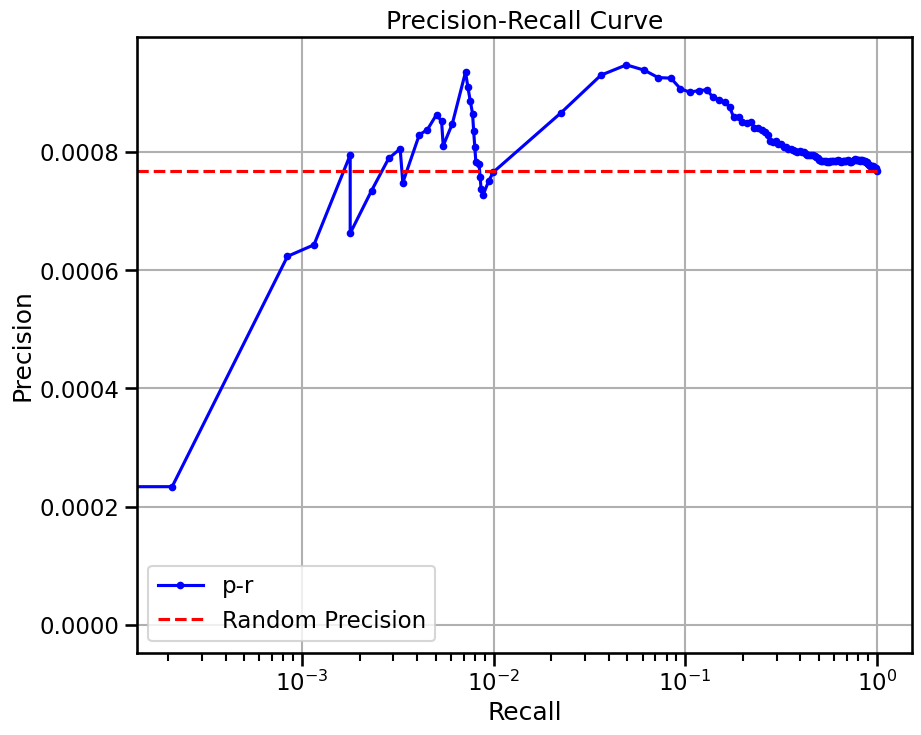

(1024, 5000) retinal cone cell
base enrichment


Top central genes: []


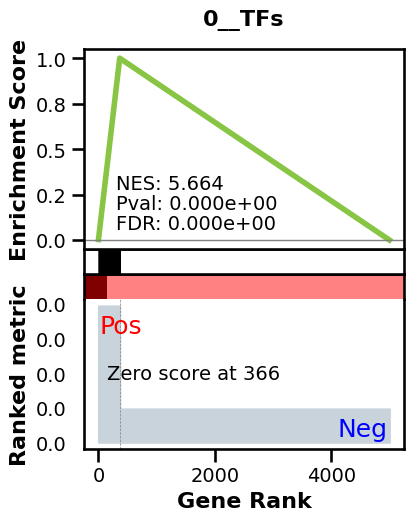

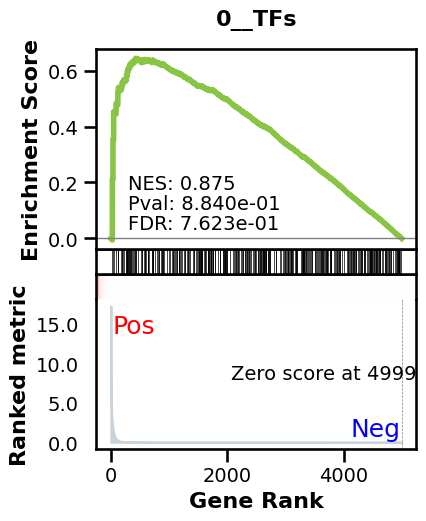

_________________________________________
TF specific enrichment


found some significant results for  12.121212121212121 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.002834563694870339 
recall:  0.3144356955380577 
random precision: 0.0007680855727160522



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.69it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.99it/s]


 14%|█▍        | 18/128 [00:00<00:01, 57.13it/s]


 19%|█▉        | 24/128 [00:00<00:01, 57.04it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.70it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.72it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.74it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.76it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.51it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.29it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.75it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.78it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.80it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.83it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.86it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.90it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 57.14it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 57.46it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 57.72it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 57.93it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.05it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 57.09it/s]

Average Precision (AP):  0.0017868251721057753
Area Under Precision-Recall Curve (AUPRC):  0.0015550639340620135
EPR: 3.292010110979294


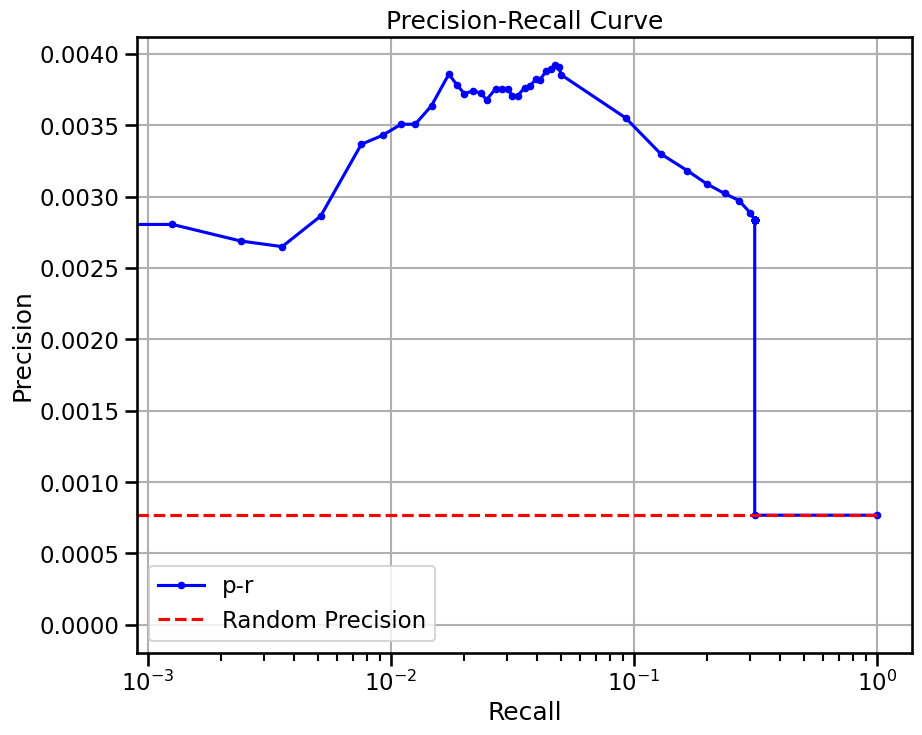

base enrichment


Top central genes: []
The DataFrame contains only the same values.


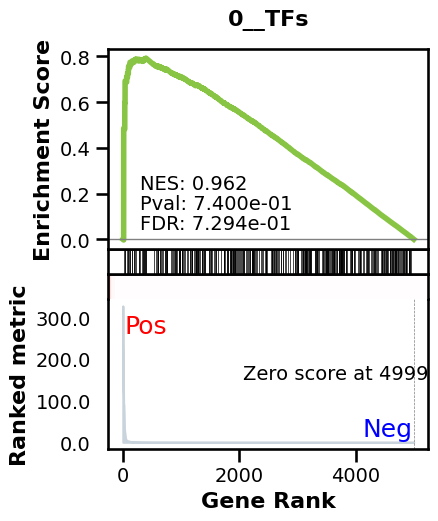

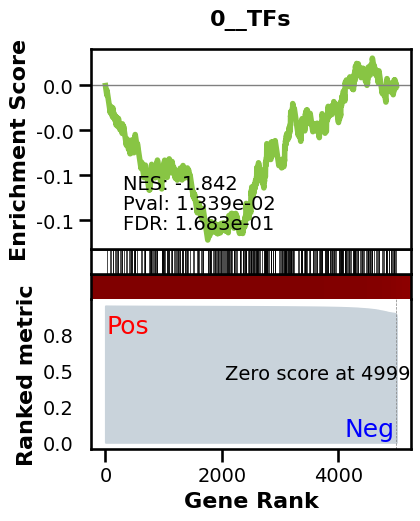

_________________________________________
TF specific enrichment


found some significant results for  12.121212121212121 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.0007678674904977909 
recall:  1.0 
random precision: 0.0007680855727160522



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 58.06it/s]


  9%|▉         | 12/128 [00:00<00:01, 58.35it/s]


 14%|█▍        | 18/128 [00:00<00:01, 57.98it/s]


 19%|█▉        | 24/128 [00:00<00:01, 57.84it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.19it/s]


 28%|██▊       | 36/128 [00:00<00:01, 57.72it/s]


 33%|███▎      | 42/128 [00:00<00:01, 57.65it/s]


 38%|███▊      | 48/128 [00:00<00:01, 57.60it/s]


 42%|████▏     | 54/128 [00:00<00:01, 57.49it/s]


 47%|████▋     | 60/128 [00:01<00:01, 57.67it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 57.96it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.16it/s]


 61%|██████    | 78/128 [00:01<00:00, 57.85it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 57.75it/s]


 70%|███████   | 90/128 [00:01<00:00, 57.85it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 57.68it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 57.38it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 57.69it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 57.93it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.17it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.02it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 57.80it/s]

Average Precision (AP):  0.0007734403312733884
Area Under Precision-Recall Curve (AUPRC):  0.0007728433755490927
EPR: 1.09364870254408


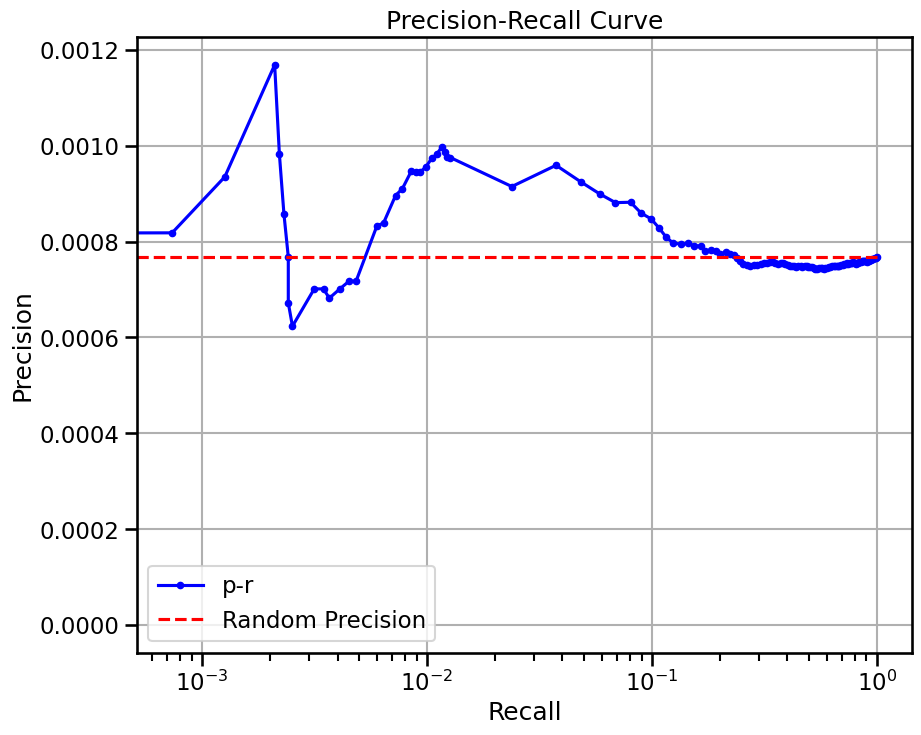

base enrichment


Top central genes: []


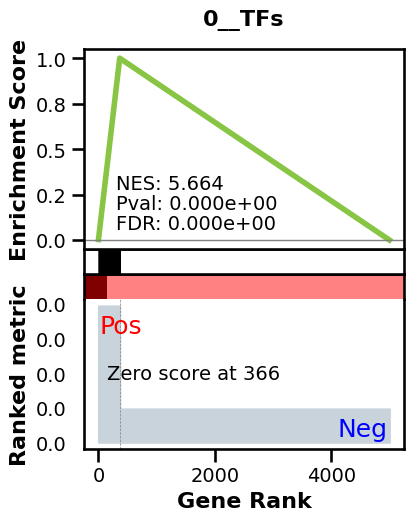

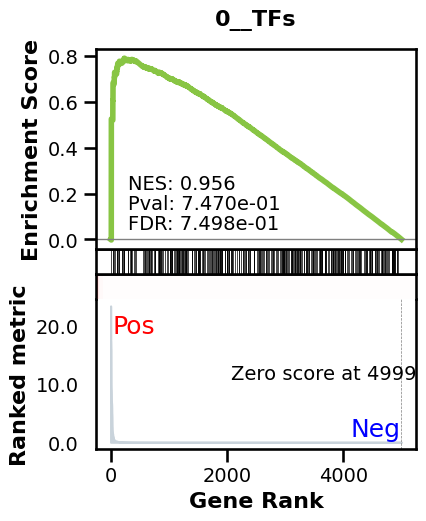

_________________________________________
TF specific enrichment


found some significant results for  6.0606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.002834563694870339 
recall:  0.3144356955380577 
random precision: 0.0007680855727160522



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.61it/s]


  9%|▉         | 12/128 [00:00<00:01, 58.50it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.90it/s]


 19%|█▉        | 24/128 [00:00<00:01, 59.15it/s]


 23%|██▎       | 30/128 [00:00<00:01, 59.18it/s]


 28%|██▊       | 36/128 [00:00<00:01, 59.04it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.90it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.87it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.64it/s]


 47%|████▋     | 60/128 [00:01<00:01, 58.52it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 58.65it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.70it/s]


 61%|██████    | 78/128 [00:01<00:00, 58.72it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.71it/s]


 70%|███████   | 90/128 [00:01<00:00, 58.75it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.48it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.69it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.82it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 58.77it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.76it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.80it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.72it/s]

Average Precision (AP):  0.0016956150363225647
Area Under Precision-Recall Curve (AUPRC):  0.0014654898850320292
EPR: 4.535105049538023


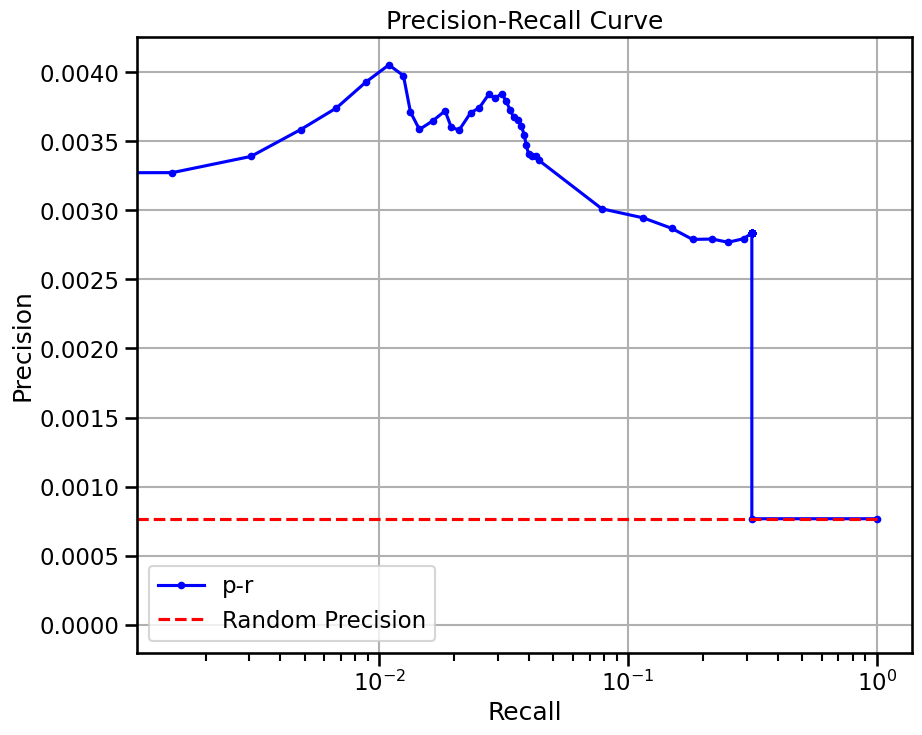


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:03<01:42,  3.30s/it]


  6%|▋         | 2/32 [00:04<01:04,  2.14s/it]


  9%|▉         | 3/32 [00:05<00:45,  1.55s/it]


 12%|█▎        | 4/32 [00:06<00:36,  1.30s/it]


 16%|█▌        | 5/32 [00:07<00:30,  1.14s/it]


 19%|█▉        | 6/32 [00:08<00:27,  1.04s/it]


 22%|██▏       | 7/32 [00:08<00:24,  1.03it/s]


 25%|██▌       | 8/32 [00:09<00:22,  1.07it/s]


 28%|██▊       | 9/32 [00:10<00:20,  1.11it/s]


 31%|███▏      | 10/32 [00:11<00:19,  1.12it/s]


 34%|███▍      | 11/32 [00:12<00:18,  1.13it/s]


 38%|███▊      | 12/32 [00:13<00:17,  1.14it/s]


 41%|████      | 13/32 [00:14<00:16,  1.16it/s]


 44%|████▍     | 14/32 [00:14<00:15,  1.15it/s]


 47%|████▋     | 15/32 [00:15<00:14,  1.16it/s]


 50%|█████     | 16/32 [00:16<00:13,  1.16it/s]


 53%|█████▎    | 17/32 [00:17<00:12,  1.15it/s]


 56%|█████▋    | 18/32 [00:18<00:12,  1.16it/s]


 59%|█████▉    | 19/32 [00:19<00:11,  1.16it/s]


 62%|██████▎   | 20/32 [00:20<00:10,  1.17it/s]


 66%|██████▌   | 21/32 [00:20<00:09,  1.18it/s]


 69%|██████▉   | 22/32 [00:21<00:08,  1.18it/s]


 72%|███████▏  | 23/32 [00:22<00:07,  1.18it/s]


 75%|███████▌  | 24/32 [00:23<00:06,  1.18it/s]


 78%|███████▊  | 25/32 [00:24<00:05,  1.19it/s]


 81%|████████▏ | 26/32 [00:25<00:05,  1.20it/s]


 84%|████████▍ | 27/32 [00:25<00:04,  1.19it/s]


 88%|████████▊ | 28/32 [00:26<00:03,  1.18it/s]


 91%|█████████ | 29/32 [00:27<00:02,  1.18it/s]


 94%|█████████▍| 30/32 [00:28<00:01,  1.17it/s]


 97%|█████████▋| 31/32 [00:29<00:00,  1.18it/s]


100%|██████████| 32/32 [00:30<00:00,  1.18it/s]


100%|██████████| 32/32 [00:30<00:00,  1.05it/s]

avg link count: 534118321, sparsity: 1.0


base enrichment


too many genes for central computation


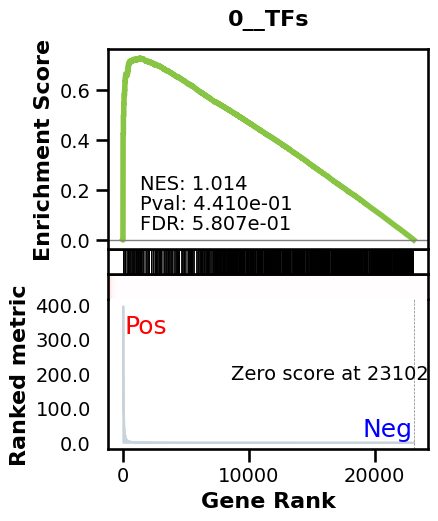

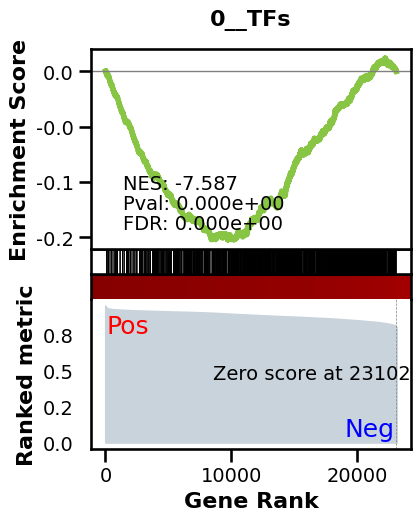

_________________________________________
TF specific enrichment


found some significant results for  32.142857142857146 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12454 genes
intersection pct: 0.5390641907977319


precision:  0.0006627869401124459 
recall:  1.0 
random precision: 0.0006628328935853789



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:39,  3.24it/s]


  2%|▏         | 2/128 [00:00<00:39,  3.22it/s]


  2%|▏         | 3/128 [00:00<00:38,  3.23it/s]


  3%|▎         | 4/128 [00:01<00:38,  3.23it/s]


  4%|▍         | 5/128 [00:01<00:38,  3.23it/s]


  5%|▍         | 6/128 [00:01<00:37,  3.23it/s]


  5%|▌         | 7/128 [00:02<00:37,  3.23it/s]


  6%|▋         | 8/128 [00:02<00:36,  3.25it/s]


  7%|▋         | 9/128 [00:02<00:36,  3.24it/s]


  8%|▊         | 10/128 [00:03<00:36,  3.24it/s]


  9%|▊         | 11/128 [00:03<00:36,  3.24it/s]


  9%|▉         | 12/128 [00:03<00:35,  3.25it/s]


 10%|█         | 13/128 [00:04<00:35,  3.24it/s]


 11%|█         | 14/128 [00:04<00:35,  3.23it/s]


 12%|█▏        | 15/128 [00:04<00:34,  3.23it/s]


 12%|█▎        | 16/128 [00:04<00:34,  3.23it/s]


 13%|█▎        | 17/128 [00:05<00:34,  3.25it/s]


 14%|█▍        | 18/128 [00:05<00:33,  3.24it/s]


 15%|█▍        | 19/128 [00:05<00:33,  3.24it/s]


 16%|█▌        | 20/128 [00:06<00:33,  3.24it/s]


 16%|█▋        | 21/128 [00:06<00:33,  3.24it/s]


 17%|█▋        | 22/128 [00:06<00:32,  3.24it/s]


 18%|█▊        | 23/128 [00:07<00:32,  3.24it/s]


 19%|█▉        | 24/128 [00:07<00:32,  3.24it/s]


 20%|█▉        | 25/128 [00:07<00:31,  3.24it/s]


 20%|██        | 26/128 [00:08<00:31,  3.24it/s]


 21%|██        | 27/128 [00:08<00:31,  3.24it/s]


 22%|██▏       | 28/128 [00:08<00:30,  3.23it/s]


 23%|██▎       | 29/128 [00:08<00:30,  3.23it/s]


 23%|██▎       | 30/128 [00:09<00:30,  3.23it/s]


 24%|██▍       | 31/128 [00:09<00:29,  3.24it/s]


 25%|██▌       | 32/128 [00:09<00:29,  3.24it/s]


 26%|██▌       | 33/128 [00:10<00:29,  3.24it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.25it/s]


 27%|██▋       | 35/128 [00:10<00:28,  3.25it/s]


 28%|██▊       | 36/128 [00:11<00:28,  3.25it/s]


 29%|██▉       | 37/128 [00:11<00:28,  3.25it/s]


 30%|██▉       | 38/128 [00:11<00:27,  3.25it/s]


 30%|███       | 39/128 [00:12<00:28,  3.17it/s]


 31%|███▏      | 40/128 [00:12<00:27,  3.20it/s]


 32%|███▏      | 41/128 [00:12<00:27,  3.22it/s]


 33%|███▎      | 42/128 [00:12<00:26,  3.23it/s]


 34%|███▎      | 43/128 [00:13<00:26,  3.24it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.24it/s]


 35%|███▌      | 45/128 [00:13<00:25,  3.26it/s]


 36%|███▌      | 46/128 [00:14<00:25,  3.26it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.26it/s]


 38%|███▊      | 48/128 [00:14<00:25,  3.15it/s]


 38%|███▊      | 49/128 [00:15<00:24,  3.19it/s]


 39%|███▉      | 50/128 [00:15<00:24,  3.21it/s]


 40%|███▉      | 51/128 [00:15<00:23,  3.23it/s]


 41%|████      | 52/128 [00:16<00:23,  3.23it/s]


 41%|████▏     | 53/128 [00:16<00:23,  3.24it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.24it/s]


 43%|████▎     | 55/128 [00:17<00:22,  3.25it/s]


 44%|████▍     | 56/128 [00:17<00:22,  3.25it/s]


 45%|████▍     | 57/128 [00:17<00:23,  3.04it/s]


 45%|████▌     | 58/128 [00:17<00:22,  3.14it/s]


 46%|████▌     | 59/128 [00:18<00:21,  3.21it/s]


 47%|████▋     | 60/128 [00:18<00:20,  3.26it/s]


 48%|████▊     | 61/128 [00:18<00:20,  3.29it/s]


 48%|████▊     | 62/128 [00:19<00:19,  3.31it/s]


 49%|████▉     | 63/128 [00:19<00:19,  3.34it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.34it/s]


 51%|█████     | 65/128 [00:20<00:18,  3.35it/s]


 52%|█████▏    | 66/128 [00:20<00:18,  3.36it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.36it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.37it/s]


 54%|█████▍    | 69/128 [00:21<00:17,  3.37it/s]


 55%|█████▍    | 70/128 [00:21<00:17,  3.37it/s]


 55%|█████▌    | 71/128 [00:21<00:16,  3.37it/s]


 56%|█████▋    | 72/128 [00:22<00:16,  3.37it/s]


 57%|█████▋    | 73/128 [00:22<00:16,  3.38it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.37it/s]


 59%|█████▊    | 75/128 [00:23<00:15,  3.37it/s]


 59%|█████▉    | 76/128 [00:23<00:15,  3.38it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.38it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.38it/s]


 62%|██████▏   | 79/128 [00:24<00:14,  3.37it/s]


 62%|██████▎   | 80/128 [00:24<00:14,  3.37it/s]


 63%|██████▎   | 81/128 [00:24<00:13,  3.37it/s]


 64%|██████▍   | 82/128 [00:25<00:13,  3.37it/s]


 65%|██████▍   | 83/128 [00:25<00:13,  3.36it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.35it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.36it/s]


 67%|██████▋   | 86/128 [00:26<00:12,  3.36it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.35it/s]


 69%|██████▉   | 88/128 [00:26<00:11,  3.35it/s]


 70%|██████▉   | 89/128 [00:27<00:11,  3.36it/s]


 70%|███████   | 90/128 [00:27<00:11,  3.36it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.36it/s]


 72%|███████▏  | 92/128 [00:28<00:10,  3.36it/s]


 73%|███████▎  | 93/128 [00:28<00:10,  3.37it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.36it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.36it/s]


 75%|███████▌  | 96/128 [00:29<00:09,  3.36it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.36it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.36it/s]


 77%|███████▋  | 99/128 [00:30<00:08,  3.36it/s]


 78%|███████▊  | 100/128 [00:30<00:08,  3.36it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.35it/s]


 80%|███████▉  | 102/128 [00:31<00:07,  3.36it/s]


 80%|████████  | 103/128 [00:31<00:07,  3.37it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.37it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.37it/s]


 83%|████████▎ | 106/128 [00:32<00:06,  3.37it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.37it/s]


 84%|████████▍ | 108/128 [00:32<00:05,  3.38it/s]


 85%|████████▌ | 109/128 [00:33<00:05,  3.38it/s]


 86%|████████▌ | 110/128 [00:33<00:05,  3.37it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.37it/s]


 88%|████████▊ | 112/128 [00:34<00:04,  3.37it/s]


 88%|████████▊ | 113/128 [00:34<00:04,  3.37it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.37it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.38it/s]


 91%|█████████ | 116/128 [00:35<00:03,  3.38it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.37it/s]


 92%|█████████▏| 118/128 [00:35<00:02,  3.38it/s]


 93%|█████████▎| 119/128 [00:36<00:02,  3.38it/s]


 94%|█████████▍| 120/128 [00:36<00:02,  3.38it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.37it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.38it/s]


 96%|█████████▌| 123/128 [00:37<00:01,  3.39it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.39it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.39it/s]


 98%|█████████▊| 126/128 [00:38<00:00,  3.39it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.39it/s]


100%|██████████| 128/128 [00:38<00:00,  3.30it/s]

Average Precision (AP):  0.0006293376622348445
Area Under Precision-Recall Curve (AUPRC):  0.0006287801795445797


EPR: 1.9279547097405054


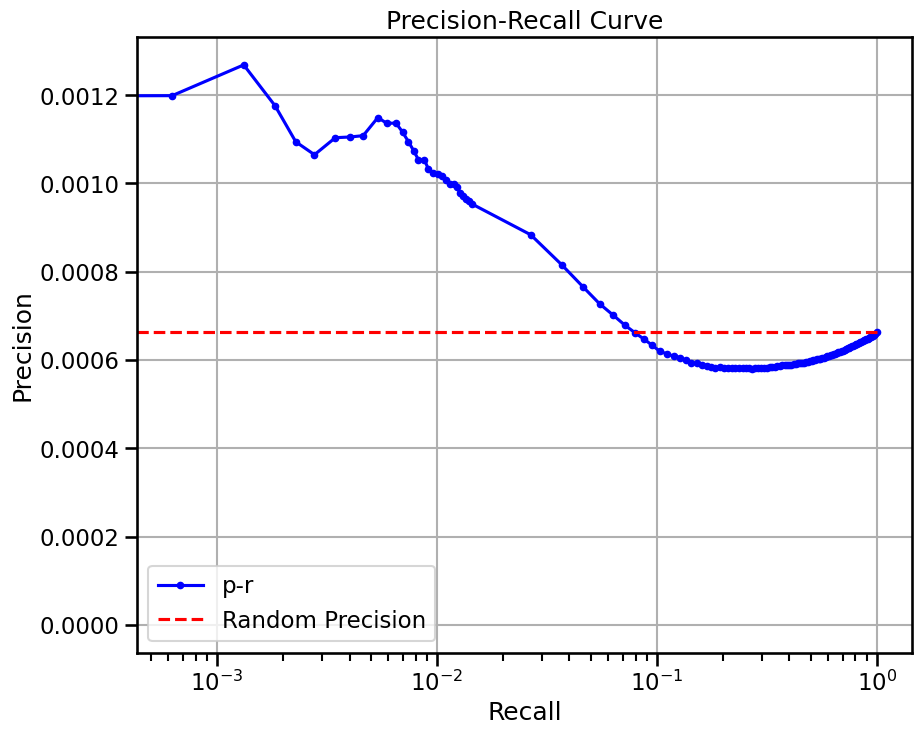


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<03:01,  2.88s/it]


  3%|▎         | 2/64 [00:04<01:56,  1.87s/it]


  5%|▍         | 3/64 [00:05<01:35,  1.56s/it]


  6%|▋         | 4/64 [00:06<01:24,  1.41s/it]


  8%|▊         | 5/64 [00:07<01:18,  1.32s/it]


  9%|▉         | 6/64 [00:08<01:13,  1.27s/it]


 11%|█         | 7/64 [00:09<01:11,  1.26s/it]


 12%|█▎        | 8/64 [00:11<01:09,  1.23s/it]


 14%|█▍        | 9/64 [00:12<01:06,  1.22s/it]


 16%|█▌        | 10/64 [00:13<01:04,  1.20s/it]


 17%|█▋        | 11/64 [00:14<01:03,  1.20s/it]


 19%|█▉        | 12/64 [00:15<01:02,  1.19s/it]


 20%|██        | 13/64 [00:17<01:00,  1.19s/it]


 22%|██▏       | 14/64 [00:18<00:59,  1.19s/it]


 23%|██▎       | 15/64 [00:19<00:58,  1.19s/it]


 25%|██▌       | 16/64 [00:20<00:56,  1.19s/it]


 27%|██▋       | 17/64 [00:21<00:55,  1.18s/it]


 28%|██▊       | 18/64 [00:22<00:54,  1.18s/it]


 30%|██▉       | 19/64 [00:24<00:53,  1.18s/it]


 31%|███▏      | 20/64 [00:25<00:51,  1.18s/it]


 33%|███▎      | 21/64 [00:26<00:50,  1.18s/it]


 34%|███▍      | 22/64 [00:27<00:49,  1.18s/it]


 36%|███▌      | 23/64 [00:28<00:48,  1.18s/it]


 38%|███▊      | 24/64 [00:30<00:47,  1.18s/it]


 39%|███▉      | 25/64 [00:31<00:45,  1.18s/it]


 41%|████      | 26/64 [00:32<00:44,  1.18s/it]


 42%|████▏     | 27/64 [00:33<00:43,  1.18s/it]


 44%|████▍     | 28/64 [00:34<00:43,  1.20s/it]


 45%|████▌     | 29/64 [00:35<00:41,  1.18s/it]


 47%|████▋     | 30/64 [00:37<00:39,  1.16s/it]


 48%|████▊     | 31/64 [00:38<00:37,  1.14s/it]


 50%|█████     | 32/64 [00:39<00:35,  1.12s/it]


 52%|█████▏    | 33/64 [00:40<00:34,  1.11s/it]


 53%|█████▎    | 34/64 [00:41<00:33,  1.10s/it]


 55%|█████▍    | 35/64 [00:42<00:31,  1.10s/it]


 56%|█████▋    | 36/64 [00:43<00:30,  1.10s/it]


 58%|█████▊    | 37/64 [00:44<00:29,  1.09s/it]


 59%|█████▉    | 38/64 [00:45<00:28,  1.09s/it]


 61%|██████    | 39/64 [00:46<00:27,  1.09s/it]


 62%|██████▎   | 40/64 [00:47<00:26,  1.09s/it]


 64%|██████▍   | 41/64 [00:48<00:25,  1.09s/it]


 66%|██████▌   | 42/64 [00:50<00:24,  1.10s/it]


 67%|██████▋   | 43/64 [00:51<00:23,  1.10s/it]


 69%|██████▉   | 44/64 [00:52<00:21,  1.10s/it]


 70%|███████   | 45/64 [00:53<00:20,  1.09s/it]


 72%|███████▏  | 46/64 [00:54<00:19,  1.09s/it]


 73%|███████▎  | 47/64 [00:55<00:18,  1.09s/it]


 75%|███████▌  | 48/64 [00:56<00:17,  1.09s/it]


 77%|███████▋  | 49/64 [00:57<00:16,  1.09s/it]


 78%|███████▊  | 50/64 [00:58<00:15,  1.09s/it]


 80%|███████▉  | 51/64 [00:59<00:14,  1.09s/it]


 81%|████████▏ | 52/64 [01:01<00:13,  1.09s/it]


 83%|████████▎ | 53/64 [01:02<00:11,  1.09s/it]


 84%|████████▍ | 54/64 [01:03<00:10,  1.09s/it]


 86%|████████▌ | 55/64 [01:04<00:09,  1.09s/it]


 88%|████████▊ | 56/64 [01:05<00:08,  1.09s/it]


 89%|████████▉ | 57/64 [01:06<00:07,  1.09s/it]


 91%|█████████ | 58/64 [01:07<00:06,  1.10s/it]


 92%|█████████▏| 59/64 [01:08<00:05,  1.10s/it]


 94%|█████████▍| 60/64 [01:09<00:04,  1.10s/it]


 95%|█████████▌| 61/64 [01:10<00:03,  1.10s/it]


 97%|█████████▋| 62/64 [01:11<00:02,  1.10s/it]


 98%|█████████▊| 63/64 [01:13<00:01,  1.10s/it]


100%|██████████| 64/64 [01:14<00:00,  1.09s/it]


100%|██████████| 64/64 [01:14<00:00,  1.16s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


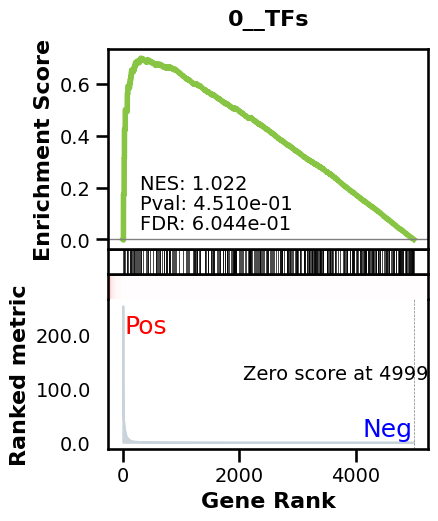

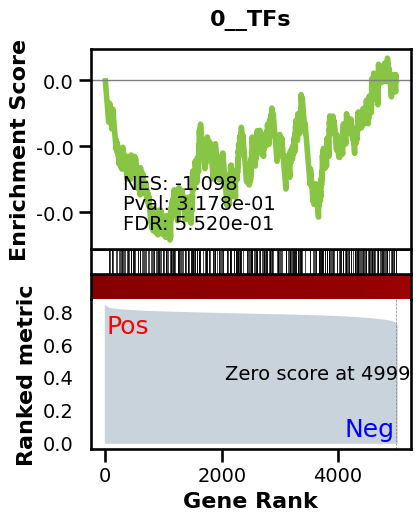

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.0010244792699861138 
recall:  1.0 
random precision: 0.0010247679370106238



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.87it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.41it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.29it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.58it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.82it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.84it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.65it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.70it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.36it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.57it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.85it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 40.92it/s]


 61%|██████    | 78/128 [00:01<00:01, 44.40it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 47.30it/s]


 70%|███████   | 90/128 [00:01<00:00, 49.44it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.01it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 52.33it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.12it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.64it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.01it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.18it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 52.50it/s]

Average Precision (AP):  0.0010698878395251487
Area Under Precision-Recall Curve (AUPRC):  0.001066901881790021
EPR: 1.8929884104809642


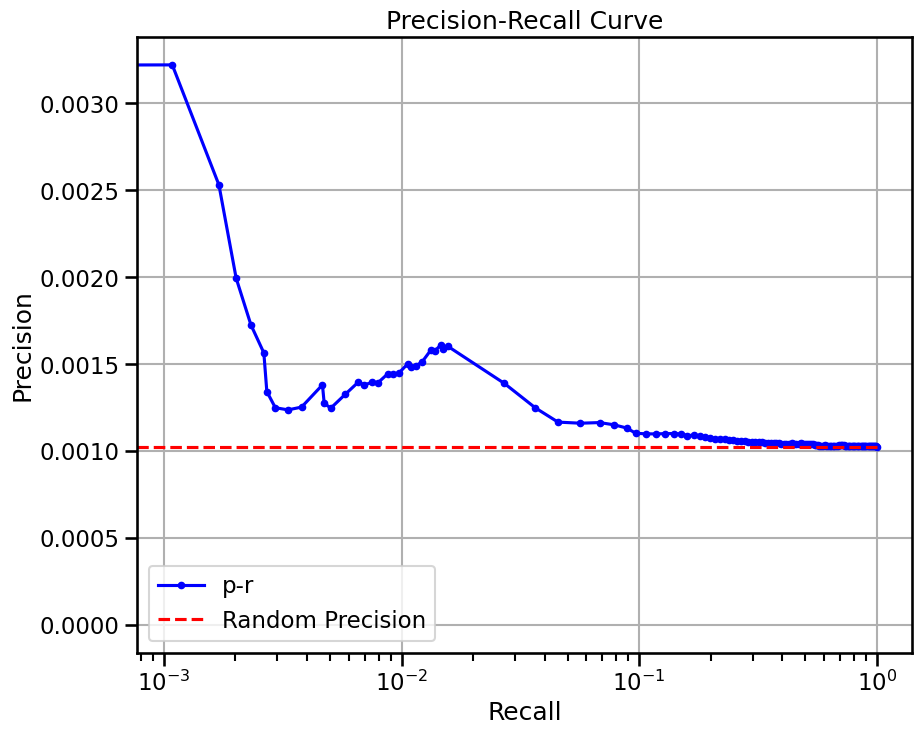

(1024, 5000) retina horizontal cell
base enrichment


Top central genes: []


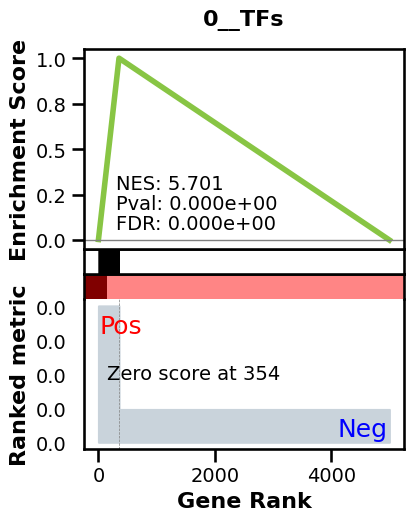

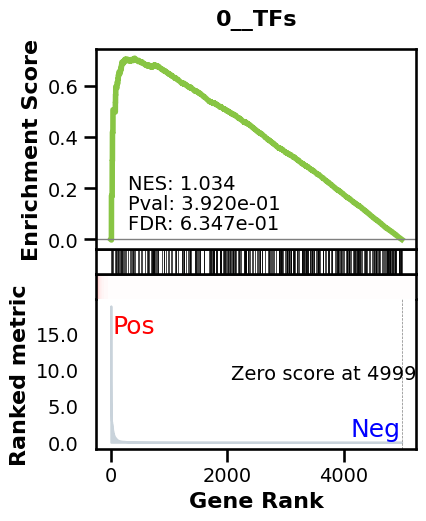

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.003774647887323944 
recall:  0.3165517775540237 
random precision: 0.0010247679370106238



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.43it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.40it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.32it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.37it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.65it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.88it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.50it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.05it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.33it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.39it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.52it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.59it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.35it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.15it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.02it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.03it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.18it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.35it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.19it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.10it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.14it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.27it/s]

Average Precision (AP):  0.0023205879075807088
Area Under Precision-Recall Curve (AUPRC):  0.00200275369737945
EPR: 4.952484253457326


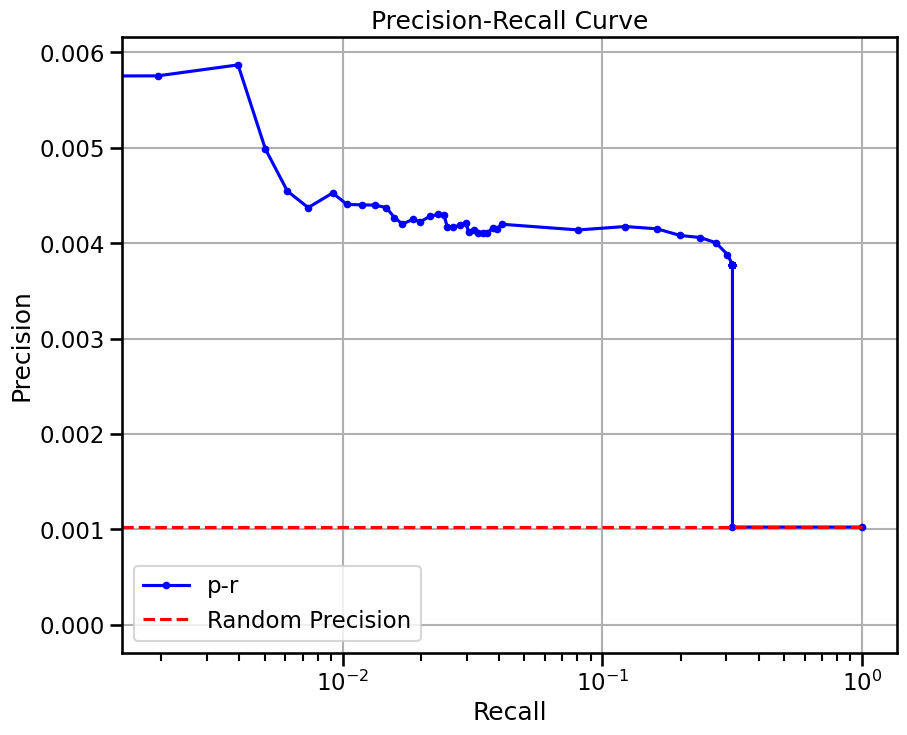

base enrichment


Top central genes: []
The DataFrame contains only the same values.


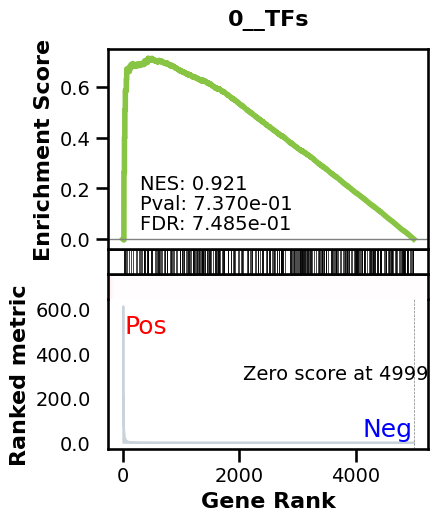

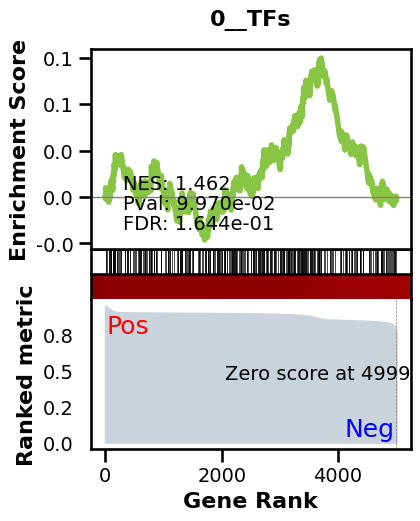

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.0010244792699861138 
recall:  1.0 
random precision: 0.0010247679370106238



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.33it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.81it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.56it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.27it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.32it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.18it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.11it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.11it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.20it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.23it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.25it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.22it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.21it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.24it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.22it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.17it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.20it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.20it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.17it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.19it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.20it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.20it/s]

Average Precision (AP):  0.0010971574458280313
Area Under Precision-Recall Curve (AUPRC):  0.0010863195379918775
EPR: 2.5780660332142165


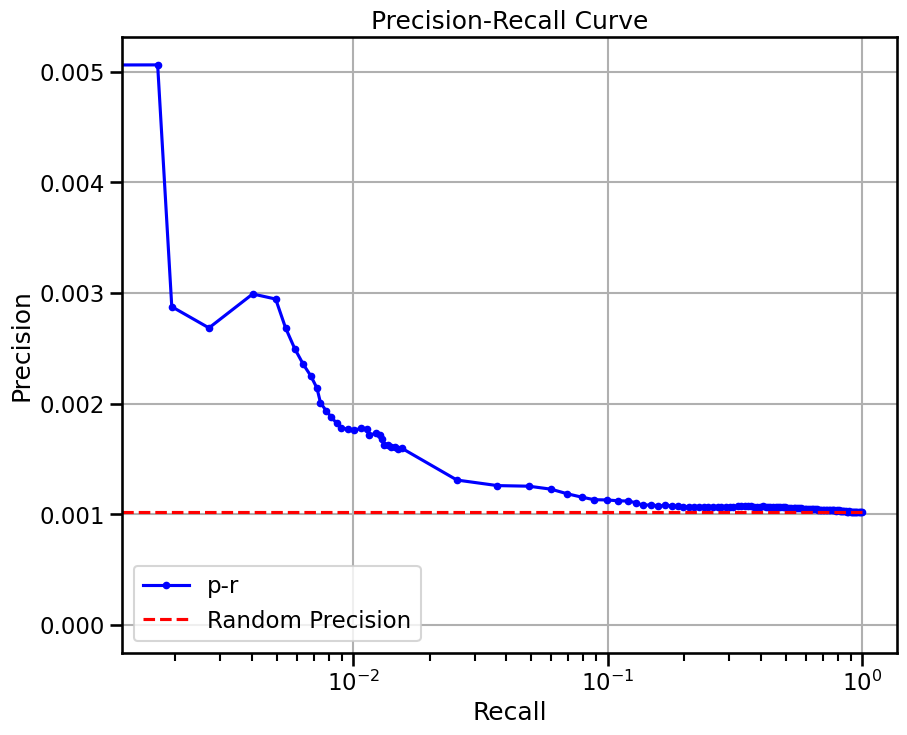

base enrichment


Top central genes: []


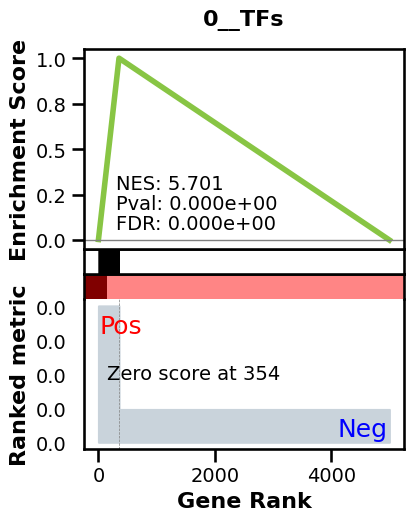

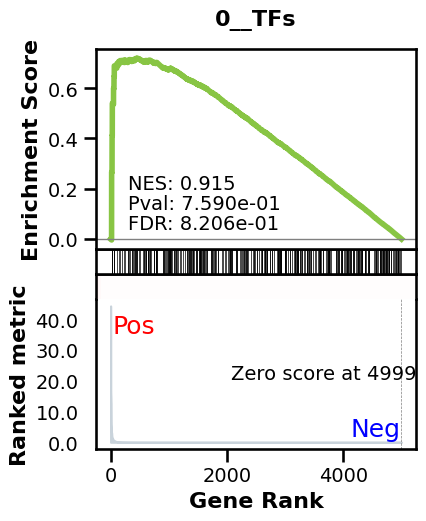

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.003774647887323944 
recall:  0.3165517775540237 
random precision: 0.0010247679370106238



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.21it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.88it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.05it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.69it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.48it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.88it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.49it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.31it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.40it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.59it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.76it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.35it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.61it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.60it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.37it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.37it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.32it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.31it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.25it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.24it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.37it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.44it/s]

Average Precision (AP):  0.002317922924852468
Area Under Precision-Recall Curve (AUPRC):  0.001963561854632037
EPR: 5.106459126798733


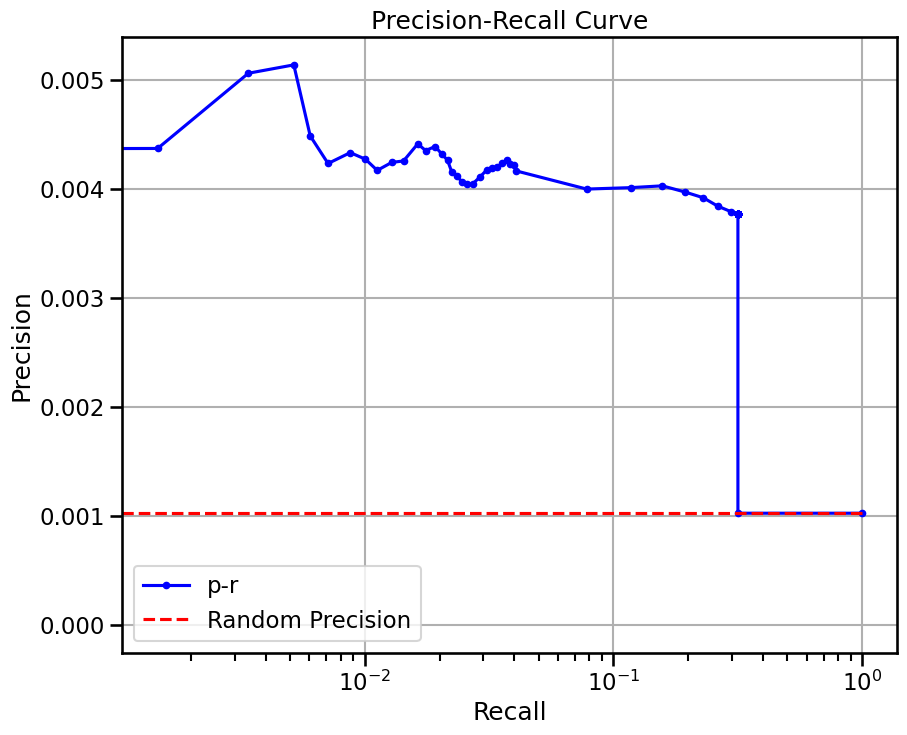


  0%|          | 0/16 [00:00<?, ?it/s]


  6%|▋         | 1/16 [00:02<00:35,  2.36s/it]


 12%|█▎        | 2/16 [00:03<00:21,  1.55s/it]


 19%|█▉        | 3/16 [00:04<00:18,  1.39s/it]


 25%|██▌       | 4/16 [00:05<00:14,  1.22s/it]


 31%|███▏      | 5/16 [00:06<00:12,  1.13s/it]


 38%|███▊      | 6/16 [00:07<00:10,  1.07s/it]


 44%|████▍     | 7/16 [00:11<00:17,  1.91s/it]


 50%|█████     | 8/16 [00:12<00:12,  1.61s/it]


 56%|█████▋    | 9/16 [00:12<00:09,  1.41s/it]


 62%|██████▎   | 10/16 [00:13<00:07,  1.27s/it]


 69%|██████▉   | 11/16 [00:14<00:05,  1.17s/it]


 75%|███████▌  | 12/16 [00:15<00:04,  1.10s/it]


 81%|████████▏ | 13/16 [00:16<00:03,  1.05s/it]


 88%|████████▊ | 14/16 [00:17<00:02,  1.02s/it]


 94%|█████████▍| 15/16 [00:18<00:00,  1.01it/s]


100%|██████████| 16/16 [00:19<00:00,  1.22it/s]


100%|██████████| 16/16 [00:19<00:00,  1.21s/it]

avg link count: 367910761, sparsity: 1.0


base enrichment


too many genes for central computation


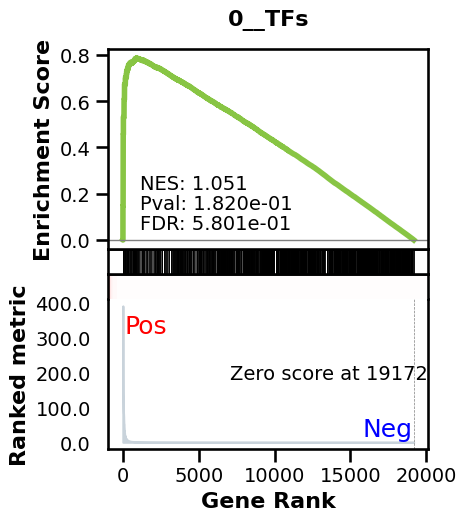

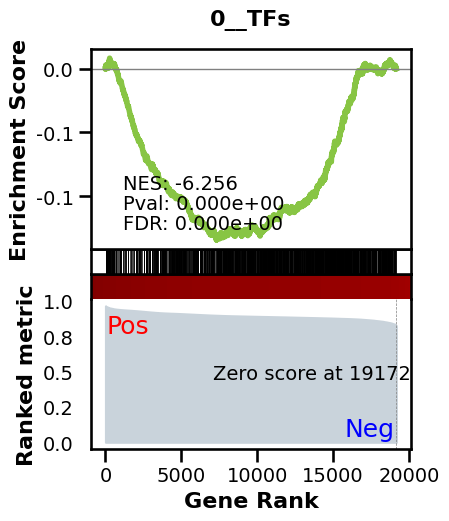

_________________________________________
TF specific enrichment


found some significant results for  18.181818181818183 % TFs

_________________________________________
loading GT,  omnipath


intersection of 11535 genes
intersection pct: 0.6016272883742764


precision:  0.0007883399161309537 
recall:  1.0 
random precision: 0.0007884033640115278



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:34,  3.68it/s]


  2%|▏         | 2/128 [00:00<00:30,  4.07it/s]


  2%|▏         | 3/128 [00:00<00:29,  4.27it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.36it/s]


  4%|▍         | 5/128 [00:01<00:27,  4.41it/s]


  5%|▍         | 6/128 [00:01<00:27,  4.44it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.46it/s]


  6%|▋         | 8/128 [00:01<00:26,  4.47it/s]


  7%|▋         | 9/128 [00:02<00:26,  4.49it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.49it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.50it/s]


  9%|▉         | 12/128 [00:02<00:25,  4.49it/s]


 10%|█         | 13/128 [00:02<00:25,  4.50it/s]


 11%|█         | 14/128 [00:03<00:25,  4.49it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.49it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.48it/s]


 13%|█▎        | 17/128 [00:03<00:24,  4.48it/s]


 14%|█▍        | 18/128 [00:04<00:24,  4.47it/s]


 15%|█▍        | 19/128 [00:04<00:24,  4.47it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.47it/s]


 16%|█▋        | 21/128 [00:04<00:23,  4.47it/s]


 17%|█▋        | 22/128 [00:04<00:23,  4.47it/s]


 18%|█▊        | 23/128 [00:05<00:23,  4.47it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.48it/s]


 20%|█▉        | 25/128 [00:05<00:22,  4.50it/s]


 20%|██        | 26/128 [00:05<00:22,  4.51it/s]


 21%|██        | 27/128 [00:06<00:22,  4.51it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.48it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.48it/s]


 23%|██▎       | 30/128 [00:06<00:21,  4.49it/s]


 24%|██▍       | 31/128 [00:07<00:24,  3.91it/s]


 25%|██▌       | 32/128 [00:07<00:23,  4.07it/s]


 26%|██▌       | 33/128 [00:07<00:22,  4.19it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.28it/s]


 27%|██▋       | 35/128 [00:07<00:21,  4.35it/s]


 28%|██▊       | 36/128 [00:08<00:20,  4.39it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.43it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.45it/s]


 30%|███       | 39/128 [00:08<00:19,  4.47it/s]


 31%|███▏      | 40/128 [00:09<00:19,  4.48it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.49it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.50it/s]


 34%|███▎      | 43/128 [00:09<00:18,  4.51it/s]


 34%|███▍      | 44/128 [00:09<00:18,  4.50it/s]


 35%|███▌      | 45/128 [00:10<00:18,  4.50it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.49it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.49it/s]


 38%|███▊      | 48/128 [00:10<00:17,  4.50it/s]


 38%|███▊      | 49/128 [00:11<00:17,  4.49it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.49it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.49it/s]


 41%|████      | 52/128 [00:11<00:16,  4.50it/s]


 41%|████▏     | 53/128 [00:11<00:16,  4.50it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.50it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.52it/s]


 44%|████▍     | 56/128 [00:12<00:15,  4.52it/s]


 45%|████▍     | 57/128 [00:12<00:15,  4.51it/s]


 45%|████▌     | 58/128 [00:13<00:15,  4.51it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.50it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.50it/s]


 48%|████▊     | 61/128 [00:13<00:14,  4.50it/s]


 48%|████▊     | 62/128 [00:13<00:14,  4.50it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.50it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.50it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.50it/s]


 52%|█████▏    | 66/128 [00:14<00:13,  4.50it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.51it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.51it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.51it/s]


 55%|█████▍    | 70/128 [00:15<00:12,  4.51it/s]


 55%|█████▌    | 71/128 [00:15<00:12,  4.51it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.51it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.51it/s]


 58%|█████▊    | 74/128 [00:16<00:11,  4.51it/s]


 59%|█████▊    | 75/128 [00:16<00:11,  4.50it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.50it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.49it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.50it/s]


 62%|██████▏   | 79/128 [00:17<00:10,  4.51it/s]


 62%|██████▎   | 80/128 [00:17<00:10,  4.51it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.51it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.51it/s]


 65%|██████▍   | 83/128 [00:18<00:09,  4.51it/s]


 66%|██████▌   | 84/128 [00:18<00:09,  4.51it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.50it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.51it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.51it/s]


 69%|██████▉   | 88/128 [00:19<00:08,  4.50it/s]


 70%|██████▉   | 89/128 [00:19<00:08,  4.50it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.50it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.50it/s]


 72%|███████▏  | 92/128 [00:20<00:07,  4.50it/s]


 73%|███████▎  | 93/128 [00:20<00:07,  4.51it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.50it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.50it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.50it/s]


 76%|███████▌  | 97/128 [00:21<00:06,  4.50it/s]


 77%|███████▋  | 98/128 [00:21<00:06,  4.49it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.51it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.50it/s]


 79%|███████▉  | 101/128 [00:22<00:05,  4.51it/s]


 80%|███████▉  | 102/128 [00:22<00:05,  4.50it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.51it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.51it/s]


 82%|████████▏ | 105/128 [00:23<00:05,  4.50it/s]


 83%|████████▎ | 106/128 [00:23<00:04,  4.50it/s]


 84%|████████▎ | 107/128 [00:23<00:04,  4.50it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.50it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.51it/s]


 86%|████████▌ | 110/128 [00:24<00:03,  4.51it/s]


 87%|████████▋ | 111/128 [00:24<00:03,  4.51it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.50it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.50it/s]


 89%|████████▉ | 114/128 [00:25<00:03,  4.50it/s]


 90%|████████▉ | 115/128 [00:25<00:02,  4.50it/s]


 91%|█████████ | 116/128 [00:25<00:02,  4.50it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.50it/s]


 92%|█████████▏| 118/128 [00:26<00:02,  4.50it/s]


 93%|█████████▎| 119/128 [00:26<00:01,  4.51it/s]


 94%|█████████▍| 120/128 [00:26<00:01,  4.49it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.50it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.50it/s]


 96%|█████████▌| 123/128 [00:27<00:01,  4.50it/s]


 97%|█████████▋| 124/128 [00:27<00:00,  4.50it/s]


 98%|█████████▊| 125/128 [00:27<00:00,  4.51it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.50it/s]


 99%|█████████▉| 127/128 [00:28<00:00,  4.51it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:28<00:00,  4.51it/s]


100%|██████████| 128/128 [00:28<00:00,  4.47it/s]

Average Precision (AP):  0.0007965975743119868
Area Under Precision-Recall Curve (AUPRC):  0.0007966563560190595


EPR: 1.763128368297136


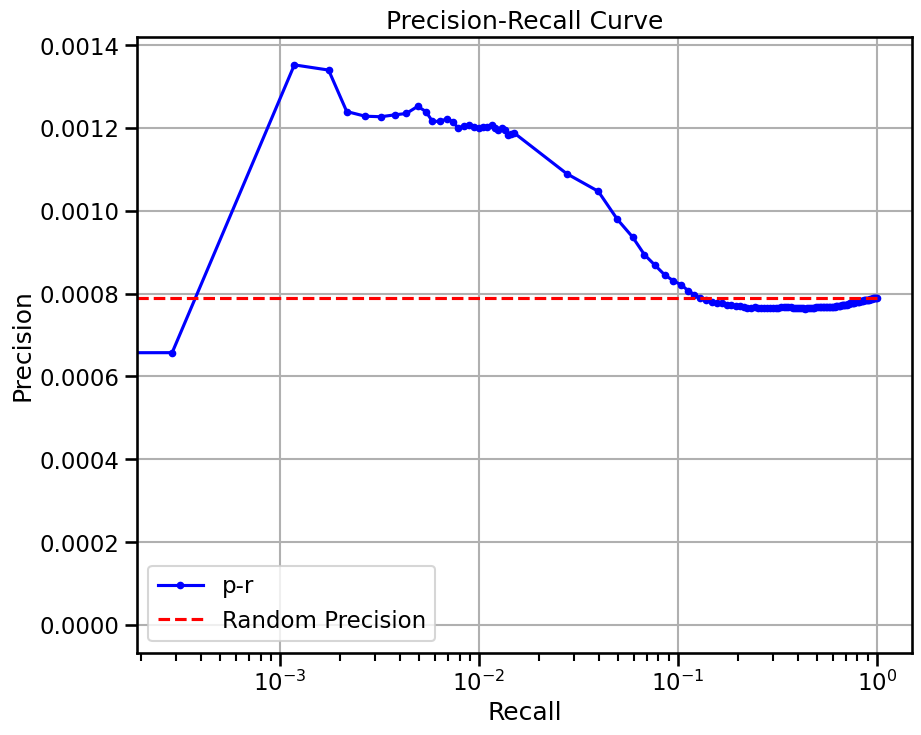

/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (



  0%|          | 0/31 [00:00<?, ?it/s]


  3%|▎         | 1/31 [00:02<01:20,  2.70s/it]


  6%|▋         | 2/31 [00:04<00:55,  1.91s/it]


 10%|▉         | 3/31 [00:05<00:46,  1.65s/it]


 13%|█▎        | 4/31 [00:06<00:41,  1.52s/it]


 16%|█▌        | 5/31 [00:08<00:37,  1.45s/it]


 19%|█▉        | 6/31 [00:09<00:35,  1.41s/it]


 23%|██▎       | 7/31 [00:10<00:32,  1.36s/it]


 26%|██▌       | 8/31 [00:11<00:29,  1.30s/it]


 29%|██▉       | 9/31 [00:12<00:27,  1.27s/it]


 32%|███▏      | 10/31 [00:14<00:26,  1.24s/it]


 35%|███▌      | 11/31 [00:15<00:24,  1.22s/it]


 39%|███▊      | 12/31 [00:16<00:22,  1.20s/it]


 42%|████▏     | 13/31 [00:17<00:21,  1.17s/it]


 45%|████▌     | 14/31 [00:18<00:19,  1.15s/it]


 48%|████▊     | 15/31 [00:19<00:18,  1.14s/it]


 52%|█████▏    | 16/31 [00:20<00:16,  1.13s/it]


 55%|█████▍    | 17/31 [00:22<00:15,  1.12s/it]


 58%|█████▊    | 18/31 [00:23<00:14,  1.12s/it]


 61%|██████▏   | 19/31 [00:24<00:13,  1.11s/it]


 65%|██████▍   | 20/31 [00:25<00:12,  1.11s/it]


 68%|██████▊   | 21/31 [00:26<00:11,  1.11s/it]


 71%|███████   | 22/31 [00:27<00:09,  1.11s/it]


 74%|███████▍  | 23/31 [00:28<00:08,  1.11s/it]


 77%|███████▋  | 24/31 [00:29<00:07,  1.11s/it]


 81%|████████  | 25/31 [00:30<00:06,  1.11s/it]


 84%|████████▍ | 26/31 [00:32<00:05,  1.11s/it]


 87%|████████▋ | 27/31 [00:33<00:04,  1.11s/it]


 90%|█████████ | 28/31 [00:34<00:03,  1.11s/it]


 94%|█████████▎| 29/31 [00:35<00:02,  1.10s/it]


 97%|█████████▋| 30/31 [00:36<00:01,  1.10s/it]


100%|██████████| 31/31 [00:37<00:00,  1.04s/it]


100%|██████████| 31/31 [00:37<00:00,  1.21s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


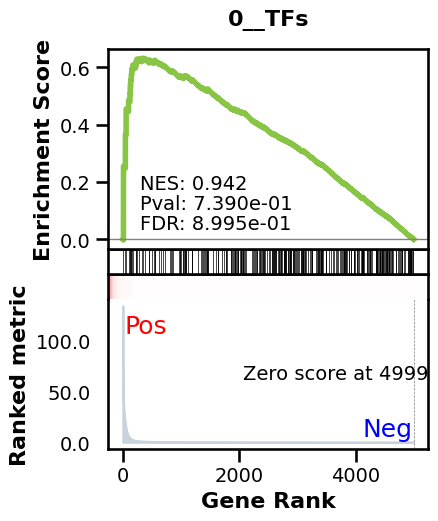

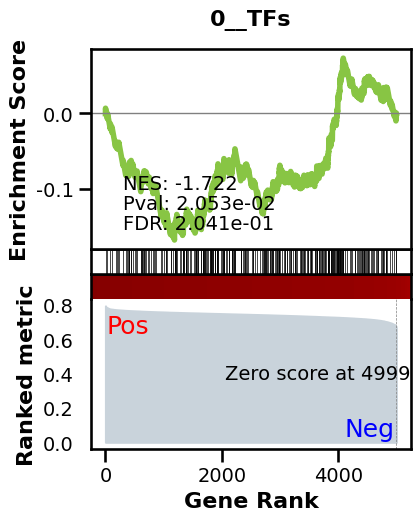

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.000953231915752681 
recall:  1.0 
random precision: 0.0009534912985868993



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 50.87it/s]


  9%|▉         | 12/128 [00:00<00:02, 51.40it/s]


 14%|█▍        | 18/128 [00:00<00:02, 51.24it/s]


 19%|█▉        | 24/128 [00:00<00:02, 51.34it/s]


 23%|██▎       | 30/128 [00:00<00:01, 51.19it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.97it/s]


 33%|███▎      | 42/128 [00:00<00:01, 51.08it/s]


 38%|███▊      | 48/128 [00:00<00:01, 51.06it/s]


 42%|████▏     | 54/128 [00:01<00:01, 51.29it/s]


 47%|████▋     | 60/128 [00:01<00:01, 51.15it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 51.37it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 51.63it/s]


 61%|██████    | 78/128 [00:01<00:00, 51.82it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 51.79it/s]


 70%|███████   | 90/128 [00:01<00:00, 51.44it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.20it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 51.03it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.91it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.86it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.94it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.96it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 51.16it/s]

Average Precision (AP):  0.0009817733107169602
Area Under Precision-Recall Curve (AUPRC):  0.0009812891409238514
EPR: 0.8954468418570982


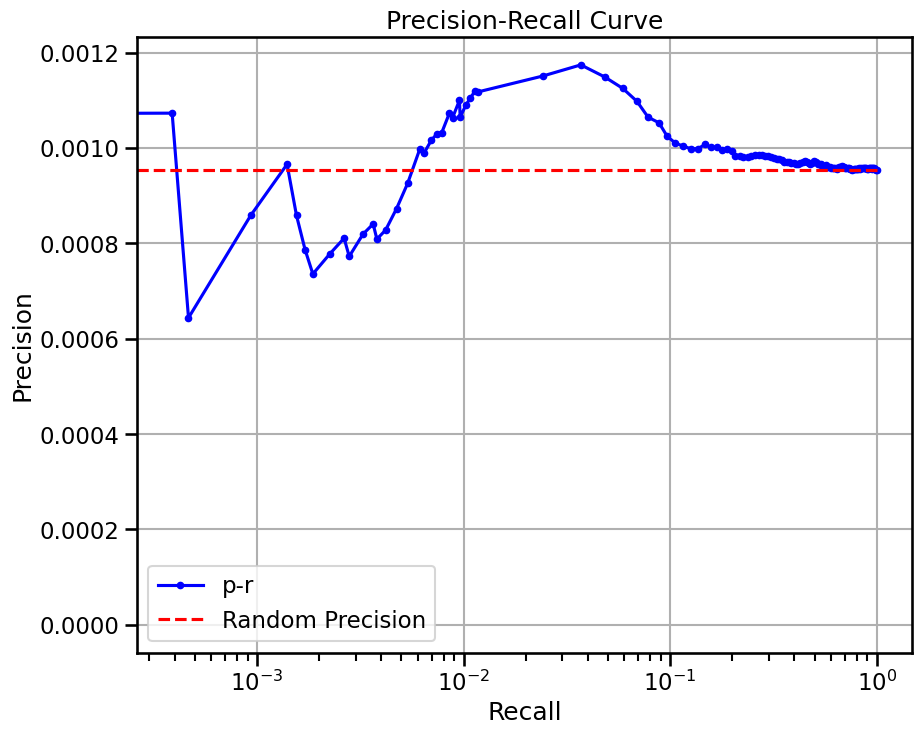

(493, 5000) retinal ganglion cell
base enrichment


Top central genes: []


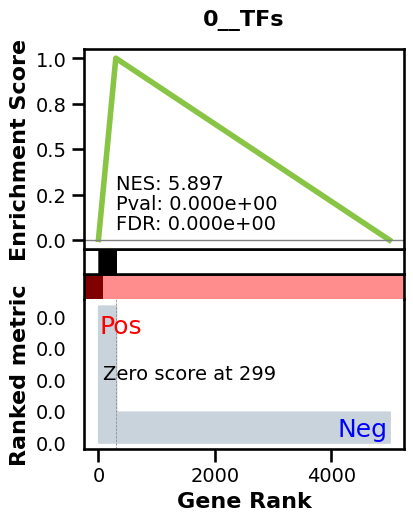

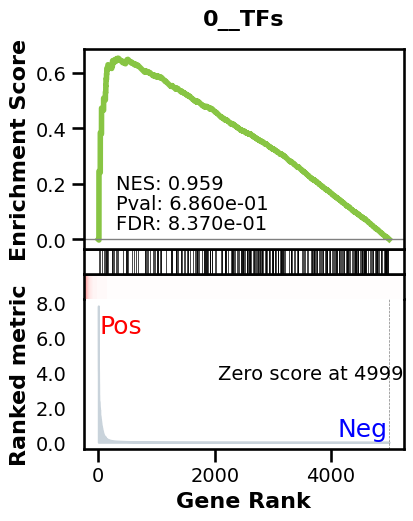

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.0031289255990017686 
recall:  0.23127086406334912 
random precision: 0.0009534912985868993



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 52.59it/s]


  9%|▉         | 12/128 [00:00<00:02, 52.29it/s]


 14%|█▍        | 18/128 [00:00<00:02, 52.45it/s]


 19%|█▉        | 24/128 [00:00<00:01, 52.79it/s]


 23%|██▎       | 30/128 [00:00<00:01, 52.95it/s]


 28%|██▊       | 36/128 [00:00<00:01, 52.34it/s]


 33%|███▎      | 42/128 [00:00<00:01, 51.92it/s]


 38%|███▊      | 48/128 [00:00<00:01, 51.47it/s]


 42%|████▏     | 54/128 [00:01<00:01, 51.60it/s]


 47%|████▋     | 60/128 [00:01<00:01, 51.75it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 51.87it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 51.82it/s]


 61%|██████    | 78/128 [00:01<00:00, 51.72it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 51.79it/s]


 70%|███████   | 90/128 [00:01<00:00, 51.69it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.95it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 51.81it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 51.85it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 51.87it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 52.10it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 52.13it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 51.96it/s]

Average Precision (AP):  0.0017455987745239236
Area Under Precision-Recall Curve (AUPRC):  0.0015530578063691985
EPR: 3.270901388654989


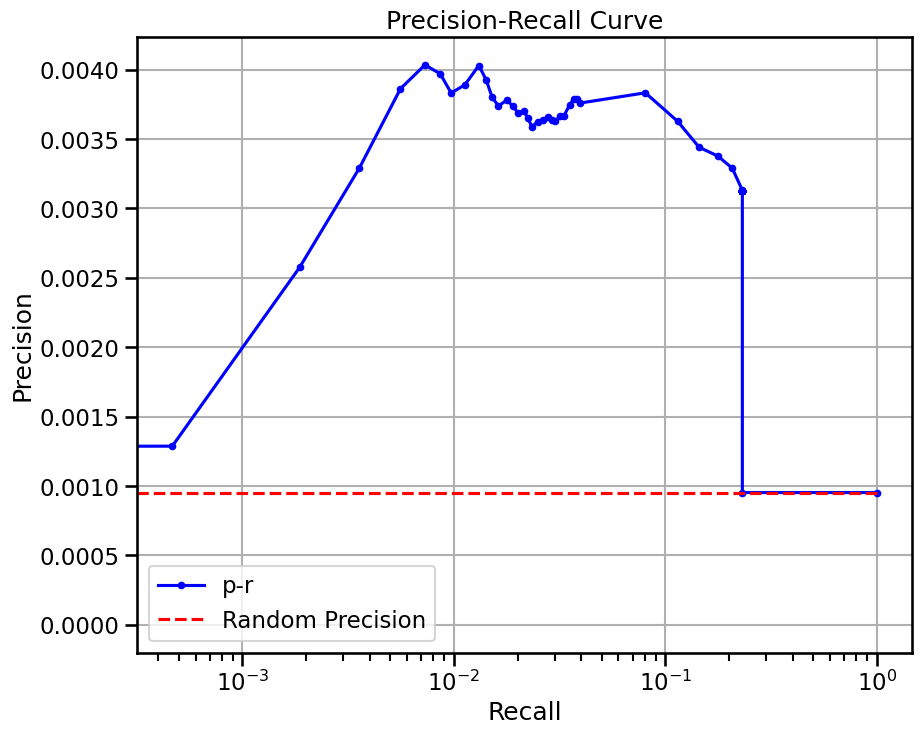

base enrichment


Top central genes: []
The DataFrame contains only the same values.


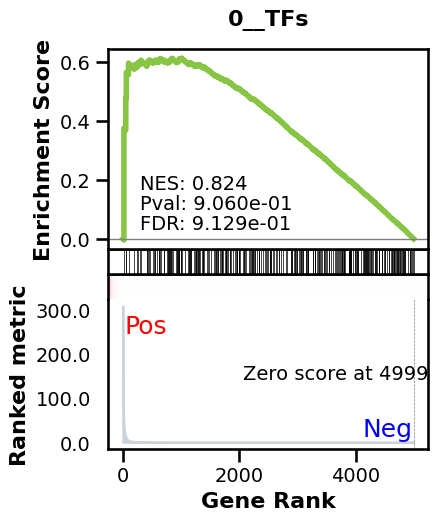

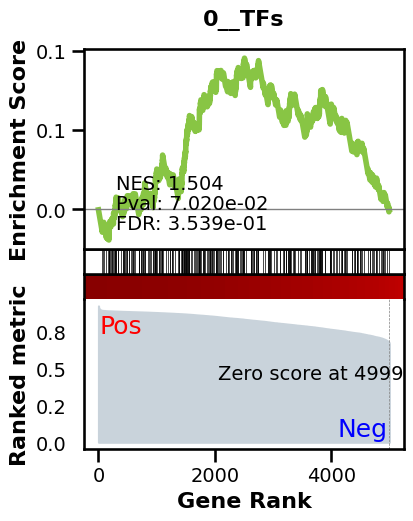

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.000953231915752681 
recall:  1.0 
random precision: 0.0009534912985868993



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 51.18it/s]


  9%|▉         | 12/128 [00:00<00:02, 51.41it/s]


 14%|█▍        | 18/128 [00:00<00:02, 51.53it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.98it/s]


 23%|██▎       | 30/128 [00:00<00:01, 51.10it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.80it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.61it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.71it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.75it/s]


 47%|████▋     | 60/128 [00:01<00:01, 50.82it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.66it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.84it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.57it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.80it/s]


 70%|███████   | 90/128 [00:01<00:00, 50.80it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 50.76it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 50.55it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.72it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.57it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.45it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.62it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.72it/s]

Average Precision (AP):  0.0010220388725363477
Area Under Precision-Recall Curve (AUPRC):  0.0010188864821836564


EPR: 0.9770029931738718


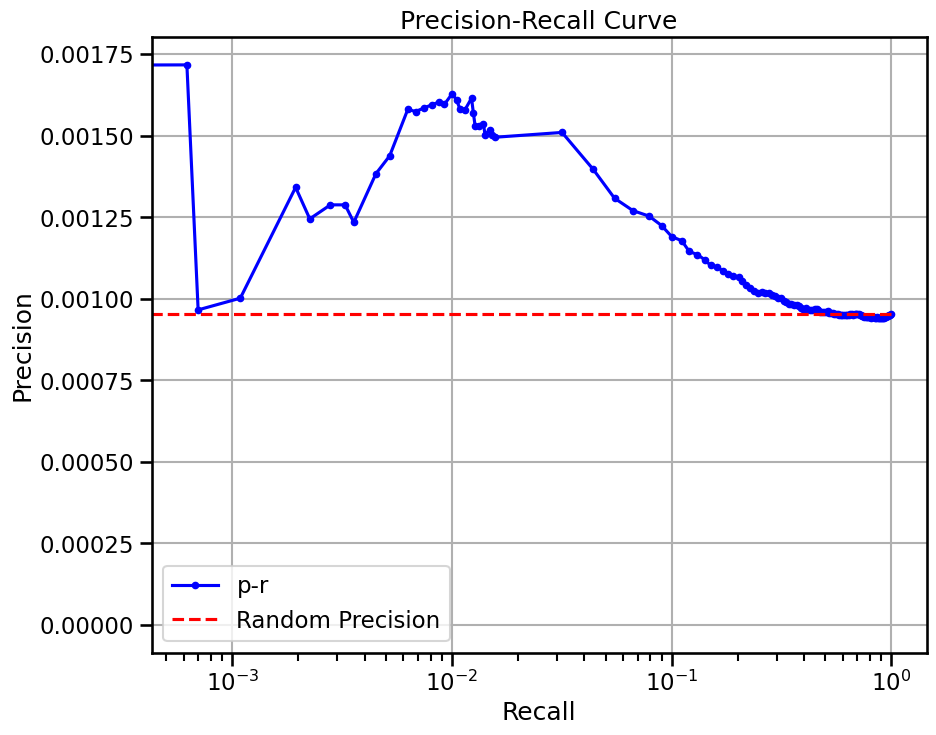

base enrichment


Top central genes: []


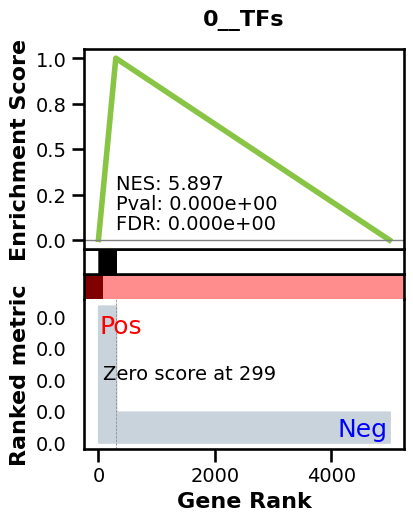

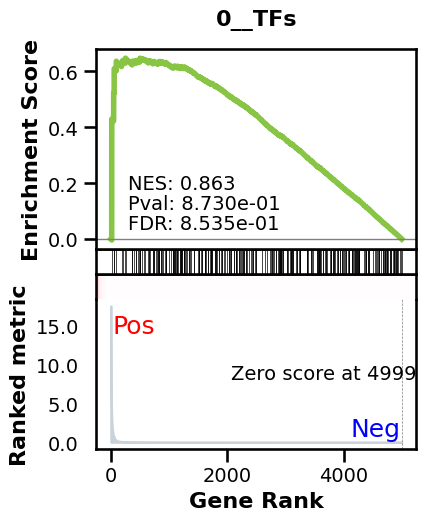

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.0031289255990017686 
recall:  0.23127086406334912 
random precision: 0.0009534912985868993



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 51.54it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.91it/s]


 14%|█▍        | 18/128 [00:00<00:02, 51.05it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.97it/s]


 23%|██▎       | 30/128 [00:00<00:01, 51.20it/s]


 28%|██▊       | 36/128 [00:00<00:01, 51.04it/s]


 33%|███▎      | 42/128 [00:00<00:01, 51.09it/s]


 38%|███▊      | 48/128 [00:00<00:01, 51.09it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.93it/s]


 47%|████▋     | 60/128 [00:01<00:01, 51.12it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 51.18it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 51.03it/s]


 61%|██████    | 78/128 [00:01<00:00, 51.18it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.98it/s]


 70%|███████   | 90/128 [00:01<00:00, 51.17it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 51.00it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 51.11it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.91it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.82it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.97it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.94it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 51.02it/s]

Average Precision (AP):  0.0016625521905561668
Area Under Precision-Recall Curve (AUPRC):  0.0014696760922998735
EPR: 3.6002352080622777


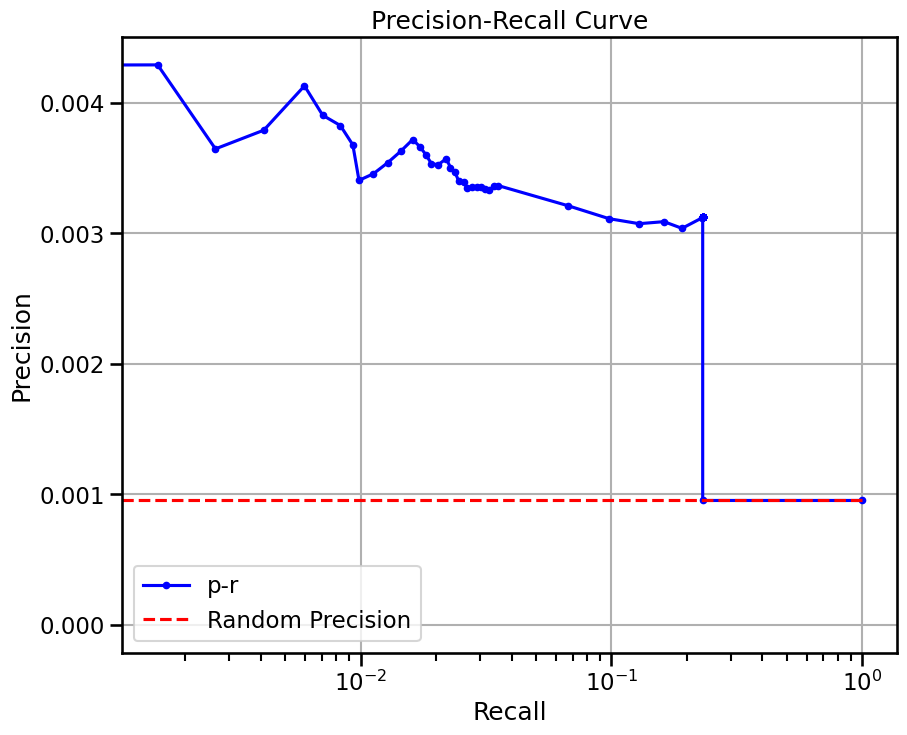


  0%|          | 0/8 [00:00<?, ?it/s]


 12%|█▎        | 1/8 [00:02<00:15,  2.22s/it]


 25%|██▌       | 2/8 [00:03<00:08,  1.47s/it]


 38%|███▊      | 3/8 [00:04<00:07,  1.60s/it]


 50%|█████     | 4/8 [00:06<00:05,  1.40s/it]


 62%|██████▎   | 5/8 [00:06<00:03,  1.25s/it]


 75%|███████▌  | 6/8 [00:09<00:03,  1.75s/it]


 88%|████████▊ | 7/8 [00:10<00:01,  1.48s/it]


100%|██████████| 8/8 [00:10<00:00,  1.09s/it]


100%|██████████| 8/8 [00:11<00:00,  1.39s/it]

avg link count: 486423025, sparsity: 1.0


base enrichment


too many genes for central computation


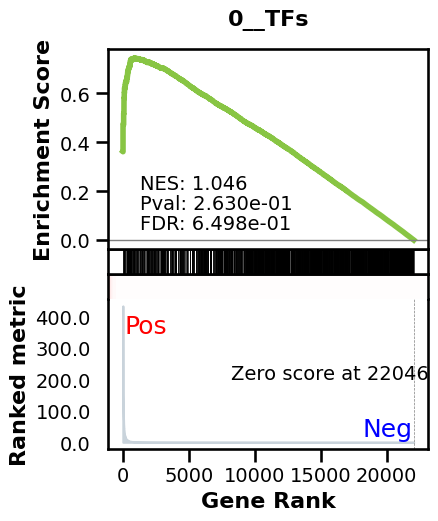

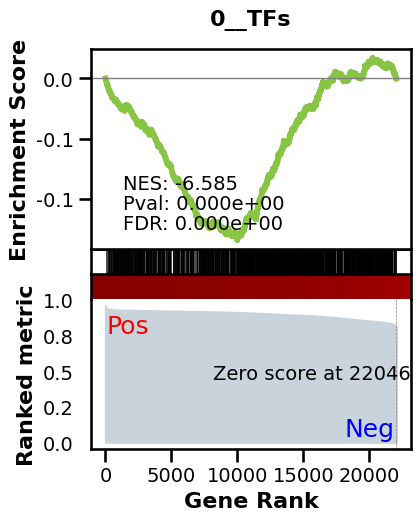

_________________________________________
TF specific enrichment


found some significant results for  35.45454545454545 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12166 genes
intersection pct: 0.5518211094479974


precision:  0.0006928427301068329 
recall:  1.0 
random precision: 0.0006928927367997313



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:34,  3.63it/s]


  2%|▏         | 2/128 [00:00<00:34,  3.63it/s]


  2%|▏         | 3/128 [00:00<00:34,  3.62it/s]


  3%|▎         | 4/128 [00:01<00:34,  3.62it/s]


  4%|▍         | 5/128 [00:01<00:33,  3.62it/s]


  5%|▍         | 6/128 [00:01<00:33,  3.62it/s]


  5%|▌         | 7/128 [00:01<00:33,  3.62it/s]


  6%|▋         | 8/128 [00:02<00:33,  3.62it/s]


  7%|▋         | 9/128 [00:02<00:32,  3.62it/s]


  8%|▊         | 10/128 [00:02<00:32,  3.62it/s]


  9%|▊         | 11/128 [00:03<00:32,  3.62it/s]


  9%|▉         | 12/128 [00:03<00:32,  3.62it/s]


 10%|█         | 13/128 [00:03<00:31,  3.61it/s]


 11%|█         | 14/128 [00:03<00:31,  3.61it/s]


 12%|█▏        | 15/128 [00:04<00:31,  3.61it/s]


 12%|█▎        | 16/128 [00:04<00:31,  3.61it/s]


 13%|█▎        | 17/128 [00:04<00:30,  3.61it/s]


 14%|█▍        | 18/128 [00:04<00:30,  3.61it/s]


 15%|█▍        | 19/128 [00:05<00:30,  3.61it/s]


 16%|█▌        | 20/128 [00:05<00:29,  3.61it/s]


 16%|█▋        | 21/128 [00:05<00:29,  3.61it/s]


 17%|█▋        | 22/128 [00:06<00:29,  3.62it/s]


 18%|█▊        | 23/128 [00:06<00:29,  3.62it/s]


 19%|█▉        | 24/128 [00:06<00:28,  3.62it/s]


 20%|█▉        | 25/128 [00:06<00:28,  3.62it/s]


 20%|██        | 26/128 [00:07<00:28,  3.62it/s]


 21%|██        | 27/128 [00:07<00:27,  3.62it/s]


 22%|██▏       | 28/128 [00:07<00:27,  3.62it/s]


 23%|██▎       | 29/128 [00:08<00:27,  3.62it/s]


 23%|██▎       | 30/128 [00:08<00:27,  3.62it/s]


 24%|██▍       | 31/128 [00:08<00:26,  3.62it/s]


 25%|██▌       | 32/128 [00:08<00:26,  3.62it/s]


 26%|██▌       | 33/128 [00:09<00:26,  3.62it/s]


 27%|██▋       | 34/128 [00:09<00:26,  3.61it/s]


 27%|██▋       | 35/128 [00:09<00:25,  3.61it/s]


 28%|██▊       | 36/128 [00:09<00:25,  3.61it/s]


 29%|██▉       | 37/128 [00:10<00:26,  3.47it/s]


 30%|██▉       | 38/128 [00:10<00:25,  3.51it/s]


 30%|███       | 39/128 [00:10<00:25,  3.54it/s]


 31%|███▏      | 40/128 [00:11<00:24,  3.55it/s]


 32%|███▏      | 41/128 [00:11<00:24,  3.54it/s]


 33%|███▎      | 42/128 [00:11<00:24,  3.56it/s]


 34%|███▎      | 43/128 [00:11<00:23,  3.57it/s]


 34%|███▍      | 44/128 [00:12<00:23,  3.58it/s]


 35%|███▌      | 45/128 [00:12<00:23,  3.58it/s]


 36%|███▌      | 46/128 [00:12<00:22,  3.59it/s]


 37%|███▋      | 47/128 [00:13<00:22,  3.60it/s]


 38%|███▊      | 48/128 [00:13<00:22,  3.60it/s]


 38%|███▊      | 49/128 [00:13<00:21,  3.60it/s]


 39%|███▉      | 50/128 [00:13<00:21,  3.60it/s]


 40%|███▉      | 51/128 [00:14<00:21,  3.61it/s]


 41%|████      | 52/128 [00:14<00:21,  3.61it/s]


 41%|████▏     | 53/128 [00:14<00:20,  3.61it/s]


 42%|████▏     | 54/128 [00:14<00:20,  3.60it/s]


 43%|████▎     | 55/128 [00:15<00:20,  3.60it/s]


 44%|████▍     | 56/128 [00:15<00:19,  3.61it/s]


 45%|████▍     | 57/128 [00:15<00:19,  3.61it/s]


 45%|████▌     | 58/128 [00:16<00:19,  3.61it/s]


 46%|████▌     | 59/128 [00:16<00:19,  3.62it/s]


 47%|████▋     | 60/128 [00:16<00:18,  3.62it/s]


 48%|████▊     | 61/128 [00:16<00:18,  3.62it/s]


 48%|████▊     | 62/128 [00:17<00:18,  3.62it/s]


 49%|████▉     | 63/128 [00:17<00:17,  3.61it/s]


 50%|█████     | 64/128 [00:17<00:17,  3.61it/s]


 51%|█████     | 65/128 [00:18<00:17,  3.62it/s]


 52%|█████▏    | 66/128 [00:18<00:17,  3.62it/s]


 52%|█████▏    | 67/128 [00:18<00:16,  3.62it/s]


 53%|█████▎    | 68/128 [00:18<00:16,  3.62it/s]


 54%|█████▍    | 69/128 [00:19<00:16,  3.62it/s]


 55%|█████▍    | 70/128 [00:19<00:16,  3.62it/s]


 55%|█████▌    | 71/128 [00:19<00:15,  3.62it/s]


 56%|█████▋    | 72/128 [00:19<00:15,  3.62it/s]


 57%|█████▋    | 73/128 [00:20<00:15,  3.62it/s]


 58%|█████▊    | 74/128 [00:20<00:14,  3.62it/s]


 59%|█████▊    | 75/128 [00:20<00:14,  3.62it/s]


 59%|█████▉    | 76/128 [00:21<00:14,  3.62it/s]


 60%|██████    | 77/128 [00:21<00:14,  3.62it/s]


 61%|██████    | 78/128 [00:21<00:13,  3.62it/s]


 62%|██████▏   | 79/128 [00:21<00:13,  3.62it/s]


 62%|██████▎   | 80/128 [00:22<00:13,  3.62it/s]


 63%|██████▎   | 81/128 [00:22<00:12,  3.62it/s]


 64%|██████▍   | 82/128 [00:22<00:12,  3.62it/s]


 65%|██████▍   | 83/128 [00:23<00:12,  3.62it/s]


 66%|██████▌   | 84/128 [00:23<00:12,  3.62it/s]


 66%|██████▋   | 85/128 [00:23<00:11,  3.62it/s]


 67%|██████▋   | 86/128 [00:23<00:11,  3.62it/s]


 68%|██████▊   | 87/128 [00:24<00:11,  3.62it/s]


 69%|██████▉   | 88/128 [00:24<00:11,  3.62it/s]


 70%|██████▉   | 89/128 [00:24<00:10,  3.62it/s]


 70%|███████   | 90/128 [00:24<00:10,  3.62it/s]


 71%|███████   | 91/128 [00:25<00:10,  3.62it/s]


 72%|███████▏  | 92/128 [00:25<00:09,  3.62it/s]


 73%|███████▎  | 93/128 [00:25<00:09,  3.62it/s]


 73%|███████▎  | 94/128 [00:26<00:09,  3.62it/s]


 74%|███████▍  | 95/128 [00:26<00:09,  3.62it/s]


 75%|███████▌  | 96/128 [00:26<00:08,  3.62it/s]


 76%|███████▌  | 97/128 [00:26<00:08,  3.62it/s]


 77%|███████▋  | 98/128 [00:27<00:08,  3.62it/s]


 77%|███████▋  | 99/128 [00:27<00:08,  3.62it/s]


 78%|███████▊  | 100/128 [00:27<00:07,  3.62it/s]


 79%|███████▉  | 101/128 [00:27<00:07,  3.62it/s]


 80%|███████▉  | 102/128 [00:28<00:07,  3.62it/s]


 80%|████████  | 103/128 [00:28<00:06,  3.62it/s]


 81%|████████▏ | 104/128 [00:28<00:06,  3.62it/s]


 82%|████████▏ | 105/128 [00:29<00:06,  3.62it/s]


 83%|████████▎ | 106/128 [00:29<00:06,  3.62it/s]


 84%|████████▎ | 107/128 [00:29<00:05,  3.62it/s]


 84%|████████▍ | 108/128 [00:29<00:05,  3.62it/s]


 85%|████████▌ | 109/128 [00:30<00:05,  3.62it/s]


 86%|████████▌ | 110/128 [00:30<00:04,  3.62it/s]


 87%|████████▋ | 111/128 [00:30<00:04,  3.62it/s]


 88%|████████▊ | 112/128 [00:31<00:04,  3.62it/s]


 88%|████████▊ | 113/128 [00:31<00:04,  3.62it/s]


 89%|████████▉ | 114/128 [00:31<00:03,  3.61it/s]


 90%|████████▉ | 115/128 [00:31<00:03,  3.62it/s]


 91%|█████████ | 116/128 [00:32<00:03,  3.62it/s]


 91%|█████████▏| 117/128 [00:32<00:03,  3.62it/s]


 92%|█████████▏| 118/128 [00:32<00:02,  3.62it/s]


 93%|█████████▎| 119/128 [00:32<00:02,  3.62it/s]


 94%|█████████▍| 120/128 [00:33<00:02,  3.62it/s]


 95%|█████████▍| 121/128 [00:33<00:01,  3.62it/s]


 95%|█████████▌| 122/128 [00:33<00:01,  3.62it/s]


 96%|█████████▌| 123/128 [00:34<00:01,  3.62it/s]


 97%|█████████▋| 124/128 [00:34<00:01,  3.62it/s]


 98%|█████████▊| 125/128 [00:34<00:00,  3.62it/s]


 98%|█████████▊| 126/128 [00:34<00:00,  3.62it/s]


 99%|█████████▉| 127/128 [00:35<00:00,  3.62it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:35<00:00,  3.62it/s]


100%|██████████| 128/128 [00:35<00:00,  3.61it/s]

Average Precision (AP):  0.0006875974843684988
Area Under Precision-Recall Curve (AUPRC):  0.0006874758016152038


EPR: 1.1503231701432577


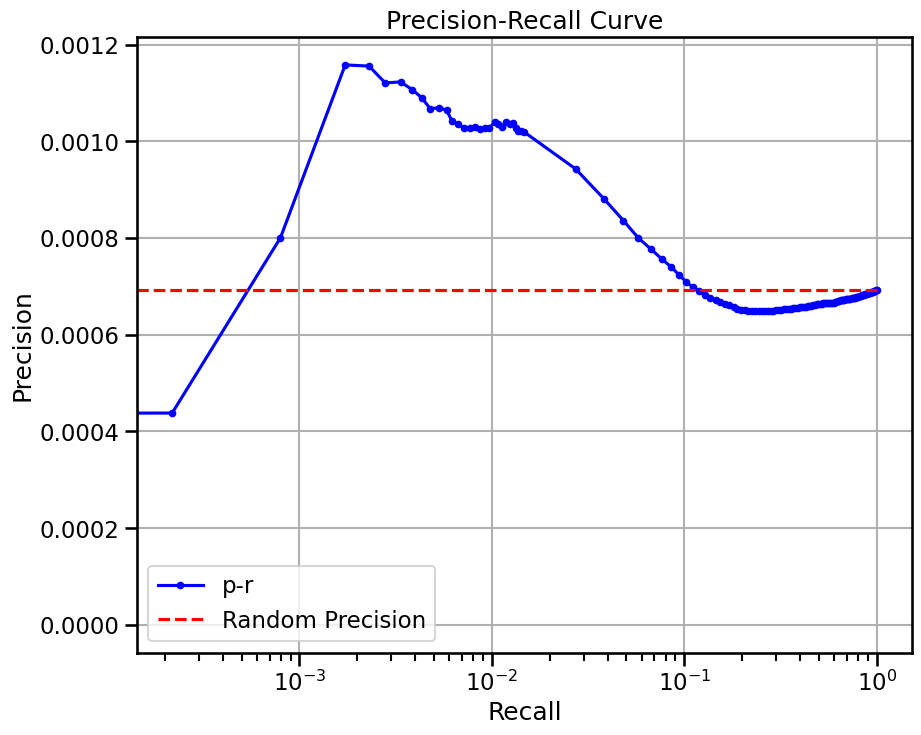


  0%|          | 0/15 [00:00<?, ?it/s]


  7%|▋         | 1/15 [00:02<00:37,  2.69s/it]


 13%|█▎        | 2/15 [00:04<00:24,  1.89s/it]


 20%|██        | 3/15 [00:05<00:20,  1.72s/it]


 27%|██▋       | 4/15 [00:06<00:16,  1.52s/it]


 33%|███▎      | 5/15 [00:07<00:14,  1.40s/it]


 40%|████      | 6/15 [00:09<00:11,  1.33s/it]


 47%|████▋     | 7/15 [00:10<00:10,  1.35s/it]


 53%|█████▎    | 8/15 [00:12<00:09,  1.41s/it]


 60%|██████    | 9/15 [00:13<00:08,  1.39s/it]


 67%|██████▋   | 10/15 [00:14<00:06,  1.37s/it]


 73%|███████▎  | 11/15 [00:16<00:05,  1.36s/it]


 80%|████████  | 12/15 [00:17<00:04,  1.35s/it]


 87%|████████▋ | 13/15 [00:18<00:02,  1.35s/it]


 93%|█████████▎| 14/15 [00:20<00:01,  1.35s/it]


100%|██████████| 15/15 [00:20<00:00,  1.15s/it]


100%|██████████| 15/15 [00:21<00:00,  1.40s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


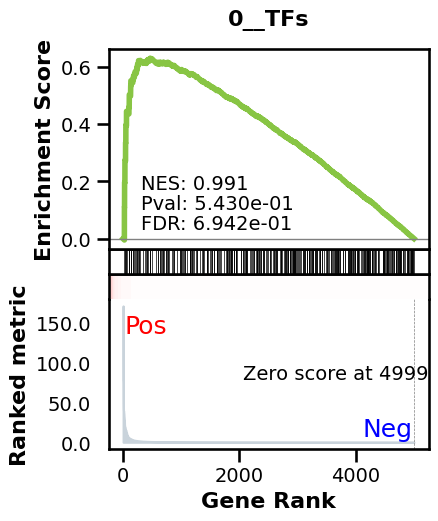

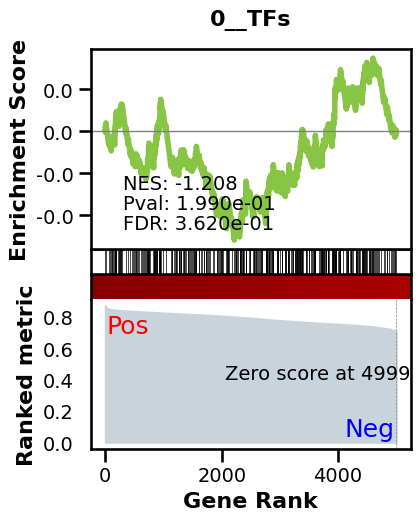

_________________________________________
TF specific enrichment


found some significant results for  18.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.0014311278203977488 
recall:  1.0 
random precision: 0.001431520555804005



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 51.23it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.46it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.48it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.29it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.17it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.07it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.38it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.29it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.17it/s]


 47%|████▋     | 60/128 [00:01<00:01, 50.04it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.05it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.13it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.18it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.21it/s]


 70%|███████   | 90/128 [00:01<00:00, 50.27it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 50.21it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 50.38it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.46it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.36it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.31it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.45it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.27it/s]

Average Precision (AP):  0.0015453786886486791
Area Under Precision-Recall Curve (AUPRC):  0.001542043772071902
EPR: 2.06364761584625


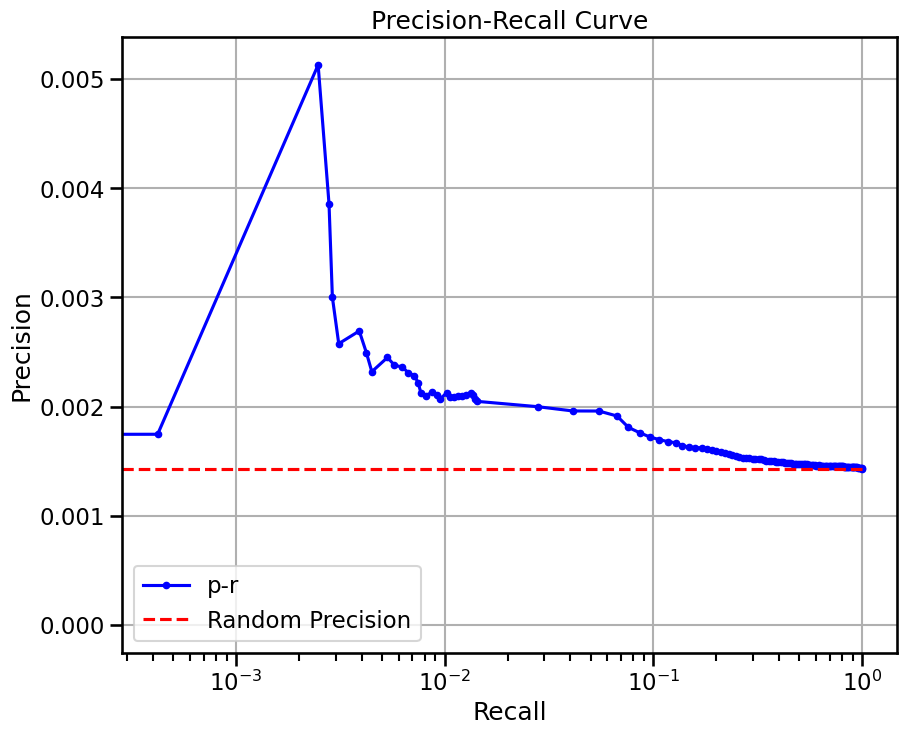

(232, 5000) astrocyte
base enrichment


Top central genes: []


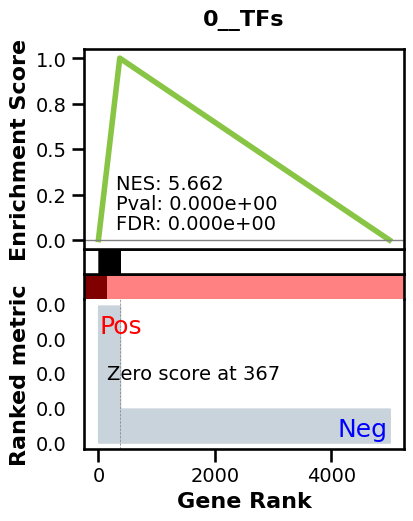

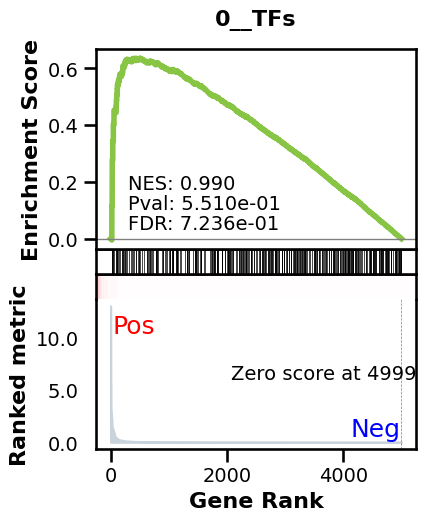

_________________________________________
TF specific enrichment


found some significant results for  8.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.00664551720623272 
recall:  0.4114862732723257 
random precision: 0.001431520555804005



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 49.95it/s]


  8%|▊         | 10/128 [00:00<00:02, 49.77it/s]


 12%|█▎        | 16/128 [00:00<00:02, 50.11it/s]


 17%|█▋        | 22/128 [00:00<00:02, 49.92it/s]


 21%|██        | 27/128 [00:00<00:02, 49.87it/s]


 26%|██▌       | 33/128 [00:00<00:01, 50.10it/s]


 30%|███       | 39/128 [00:00<00:01, 50.29it/s]


 35%|███▌      | 45/128 [00:00<00:01, 50.30it/s]


 40%|███▉      | 51/128 [00:01<00:01, 50.32it/s]


 45%|████▍     | 57/128 [00:01<00:01, 50.51it/s]


 49%|████▉     | 63/128 [00:01<00:01, 50.40it/s]


 54%|█████▍    | 69/128 [00:01<00:01, 50.44it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 50.25it/s]


 63%|██████▎   | 81/128 [00:01<00:00, 50.19it/s]


 68%|██████▊   | 87/128 [00:01<00:00, 50.16it/s]


 73%|███████▎  | 93/128 [00:01<00:00, 50.38it/s]


 77%|███████▋  | 99/128 [00:01<00:00, 50.26it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 50.08it/s]


 87%|████████▋ | 111/128 [00:02<00:00, 50.03it/s]


 91%|█████████▏| 117/128 [00:02<00:00, 50.28it/s]


 96%|█████████▌| 123/128 [00:02<00:00, 50.19it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.18it/s]

Average Precision (AP):  0.00438166805233727
Area Under Precision-Recall Curve (AUPRC):  0.00377791473112482
EPR: 7.101771872006855


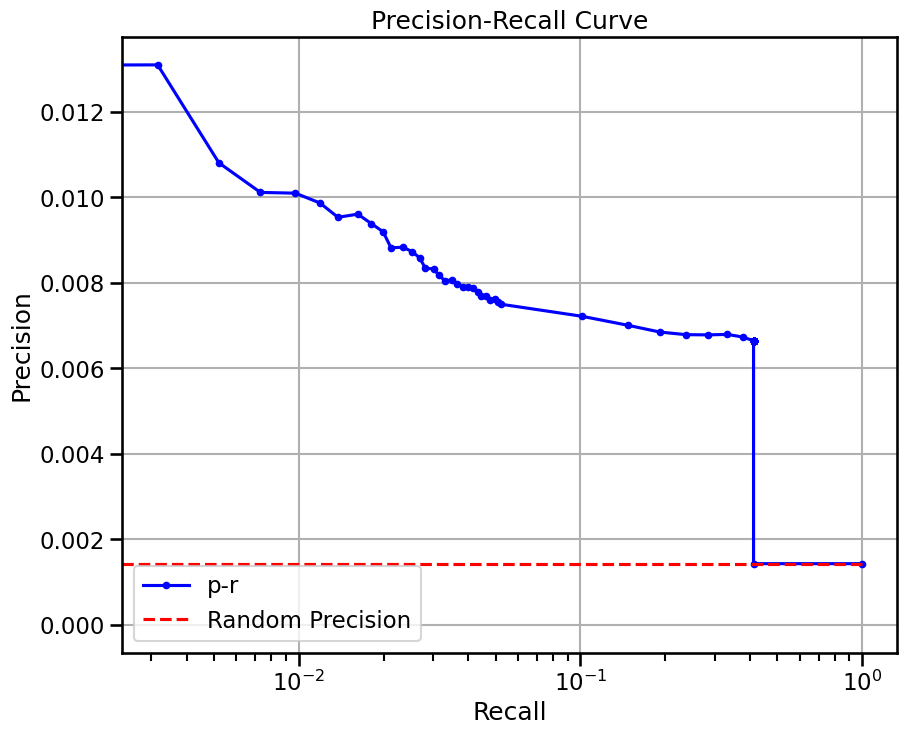

base enrichment


Top central genes: []
The DataFrame contains only the same values.


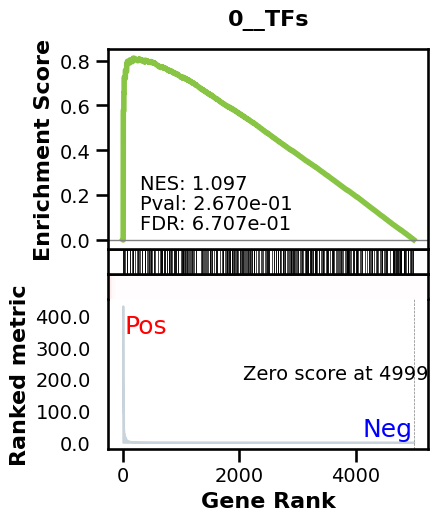

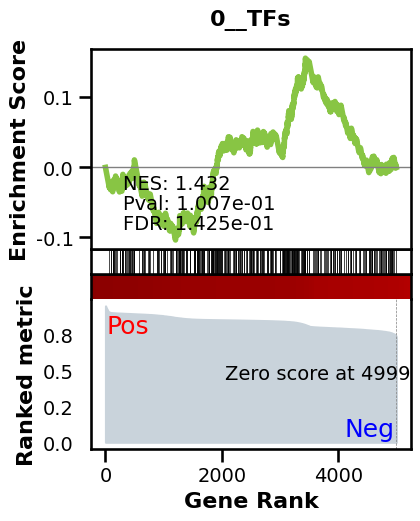

_________________________________________
TF specific enrichment


found some significant results for  12.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.0014311278203977488 
recall:  1.0 
random precision: 0.001431520555804005



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 49.73it/s]


  8%|▊         | 10/128 [00:00<00:02, 49.61it/s]


 12%|█▏        | 15/128 [00:00<00:02, 49.77it/s]


 16%|█▋        | 21/128 [00:00<00:02, 50.18it/s]


 21%|██        | 27/128 [00:00<00:02, 50.40it/s]


 26%|██▌       | 33/128 [00:00<00:01, 50.16it/s]


 30%|███       | 39/128 [00:00<00:01, 50.37it/s]


 35%|███▌      | 45/128 [00:00<00:01, 50.35it/s]


 40%|███▉      | 51/128 [00:01<00:01, 50.33it/s]


 45%|████▍     | 57/128 [00:01<00:01, 50.12it/s]


 49%|████▉     | 63/128 [00:01<00:01, 50.28it/s]


 54%|█████▍    | 69/128 [00:01<00:01, 50.17it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 50.04it/s]


 63%|██████▎   | 81/128 [00:01<00:00, 50.09it/s]


 68%|██████▊   | 87/128 [00:01<00:00, 50.16it/s]


 73%|███████▎  | 93/128 [00:01<00:00, 50.28it/s]


 77%|███████▋  | 99/128 [00:01<00:00, 50.29it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 50.29it/s]


 87%|████████▋ | 111/128 [00:02<00:00, 50.13it/s]


 91%|█████████▏| 117/128 [00:02<00:00, 50.31it/s]


 96%|█████████▌| 123/128 [00:02<00:00, 50.27it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.20it/s]

Average Precision (AP):  0.0015663680492013841
Area Under Precision-Recall Curve (AUPRC):  0.0015242431388709271
EPR: 2.5462019635537048


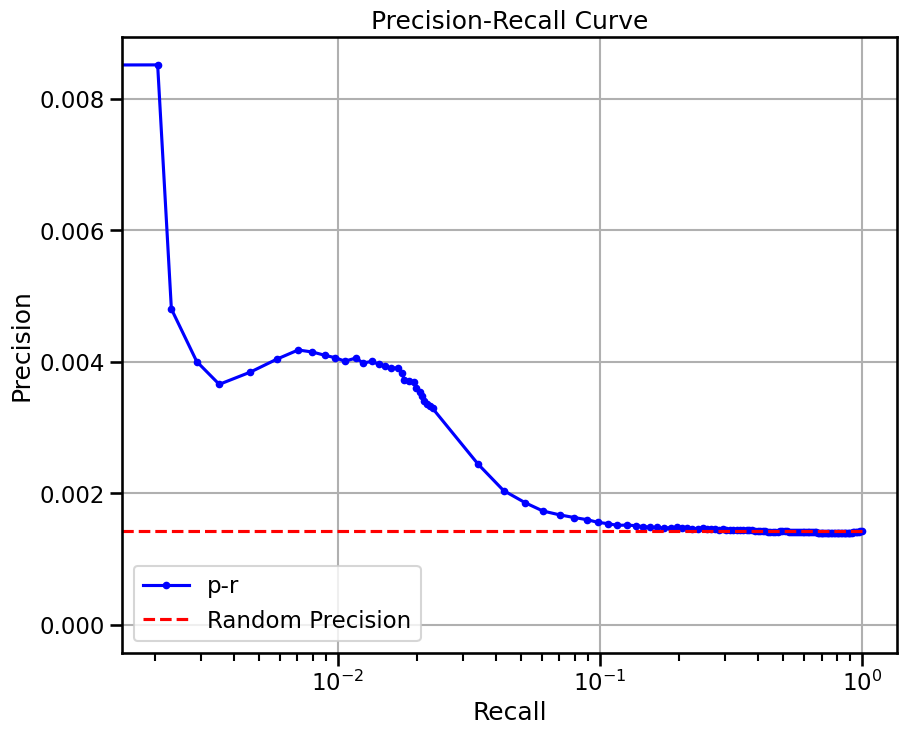

base enrichment


Top central genes: []


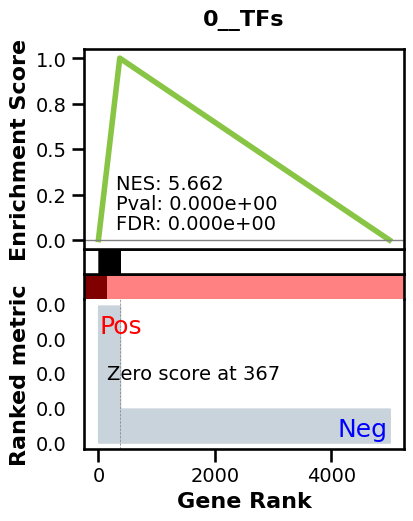

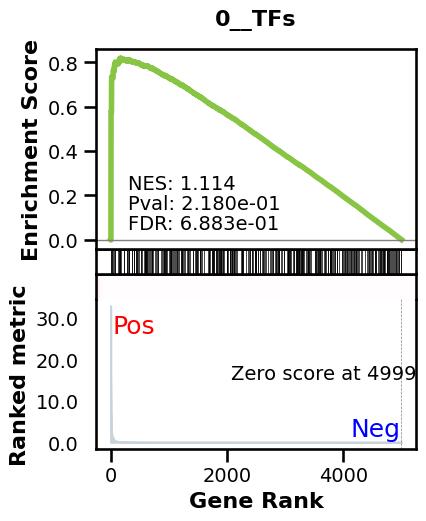

_________________________________________
TF specific enrichment


found some significant results for  2.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.00664551720623272 
recall:  0.4114862732723257 
random precision: 0.001431520555804005



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 50.61it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.99it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.82it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.70it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.61it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.59it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.52it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.49it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.43it/s]


 47%|████▋     | 60/128 [00:01<00:01, 50.40it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.40it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.45it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.38it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.35it/s]


 70%|███████   | 90/128 [00:01<00:00, 50.40it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 50.41it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 50.42it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.42it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.37it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.38it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.39it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.42it/s]

Average Precision (AP):  0.004577864514294266
Area Under Precision-Recall Curve (AUPRC):  0.0036996521501353368
EPR: 9.018539235582226


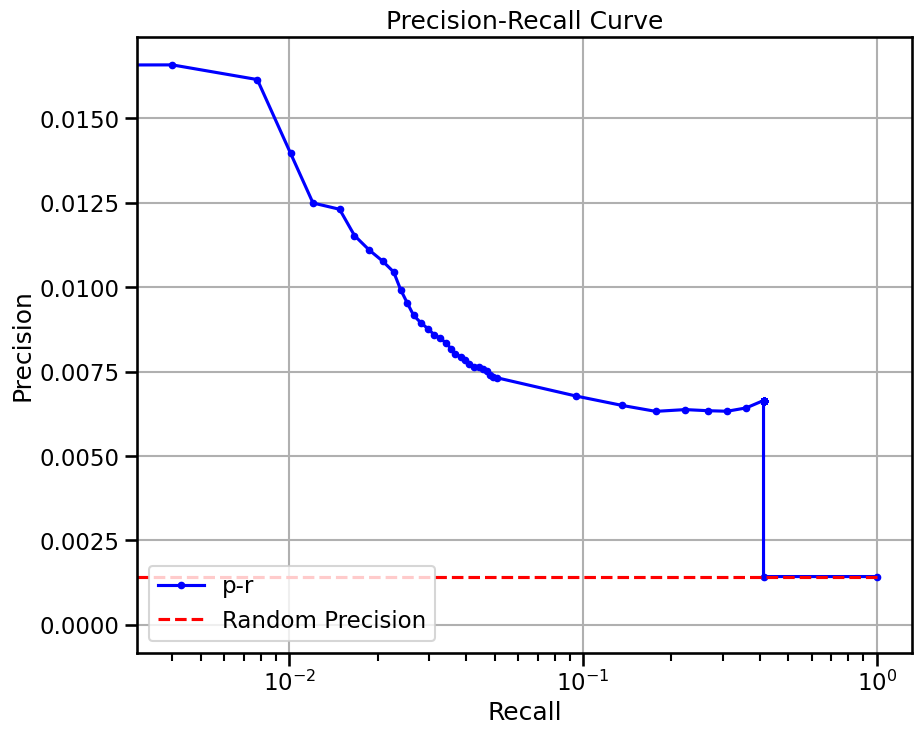

In [6]:
metrics = {}
clf_omni = None
shapes = []
for celltype in CELLTYPES:
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="random expr",
                        preprocess="softmax",
                        head_agg='mean',
                        filtration="none",
                        forward_mode="none",
                        num_genes=2200,
                        max_cells=MAXCELLS,
                        doplot=False,
                        batch_size=32,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint_full'] = BenGRN(grn).scprint_benchmark()
    del grn
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="most var across",
                        preprocess="softmax",
                        head_agg='none',
                        filtration="none",
                        forward_mode="none",
                        num_genes=NUM_GENES,
                        max_cells=1024,
                        drop_unexpressed=True,
                        doplot=False,
                        batch_size=16,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    grn.varp['all'] = grn.varp['GRN']
    grn.varp['GRN'] = grn.varp['GRN'][:,:,:].mean(-1)
    metrics[celltype+'_scprint_mean'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    print(grn.shape, celltype)
    metrics[celltype+'_scprint_tf_mean'] = BenGRN(grn).scprint_benchmark()
    if clf_omni == None:
        grn.varp['GRN'] = grn.varp['all']
        _, m, clf_omni = train_classifier(grn, C=1, train_size=0.6, class_weight={
                                        1: 300, 0: 1}, shuffle=True, max_iter=200, return_full=False)
        joblib.dump(clf_omni, 'clf_omni.pkl')
    grn.varp['GRN'] = grn.varp['all'][:,:,clf_omni.coef_[0] > 0].mean(-1)
    metrics[celltype+'_scprint_class'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_class'] = BenGRN(grn).scprint_benchmark()
    shapes.append(grn.shape[1])
    del grn

In [7]:
shapes

[5000, 1186, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000]

In [8]:
metrics

{'microglial cell_scprint_full': {'TF_enr': True,
  'significant_enriched_TFtargets': 46.42857142857143,
  'precision': 0.0006762732161909117,
  'recall': 1.0,
  'rand_precision': 0.0006763209284257213,
  'auprc': 0.0007018842190134056,
  'ap': 0.0007019291579147765,
  'epr': 1.1754539575664378},
 'microglial cell_scprint_mean': {'TF_enr': False,
  'significant_enriched_TFtargets': 10.606060606060606,
  'precision': 0.0018330143823302558,
  'recall': 1.0,
  'rand_precision': 0.0018335017565345446,
  'auprc': 0.0019823542894852903,
  'ap': 0.0019831790741082485,
  'epr': 2.132222350114667},
 'microglial cell_scprint_tf_mean': {'enriched_terms_Central': ['0__TFs',
   'celltype.gmt__Embryonic stem cells',
   'celltype.gmt__Microfold cells',
   'celltype.gmt__Satellite cells',
   'celltype.gmt__Melanocytes',
   'celltype.gmt__Retinal progenitor cells',
   'celltype.gmt__Endometrium'],
  'TF_enr': True,
  'significant_enriched_TFtargets': 4.545454545454546,
  'precision': 0.0092222534946993

In [9]:
False
False
False
True
False
False
False
True
True
True
False
False
True
True
True
False
False
True
False
True
False
False
True
False
True
False
False
False
True
False
False
False
True
True
True
False
False
True
False
True
False
False
False
False
False
False
False
False
True
True

False

In [10]:
print('new2')

new2


In [11]:
import pandas as pd

In [12]:
res = []
for k, v in metrics.items():
    res.append([k.split('_')[-1], k.split('_')[0], v['epr'], v['auprc'], v['ap'], v['rand_precision'], v['significant_enriched_TFtargets'], v.get('TF_enr', False), 'tf_' in k])

df = pd.DataFrame(res, columns=['tools','name','EPR', 'AUPRC', 'AP', 'RAND', 'TF_targ', 'TF_enr', 'TF_only'])
df

,tools,name,EPR,AUPRC,AP,RAND,TF_targ,TF_enr,TF_only
0,full,microglial cell,1.175454,0.000702,0.000702,0.000676,46.428571,True,False
1,mean,microglial cell,2.132222,0.001982,0.001983,0.001834,10.606061,False,False
2,mean,microglial cell,8.844206,0.005843,0.006552,0.001834,4.545455,True,True
3,class,microglial cell,4.752589,0.002121,0.002127,0.001834,15.151515,False,False
4,class,microglial cell,10.957464,0.005912,0.006824,0.001834,6.060606,True,True
5,full,retinal rod cell,2.137574,0.000633,0.000633,0.000662,42.857143,True,False
6,mean,retinal rod cell,0.000000,0.001071,0.001092,0.000703,0.000000,False,False
7,mean,retinal rod cell,3.819642,0.003082,0.003306,0.000703,0.000000,True,True
8,class,retinal rod cell,3.819642,0.001018,0.001045,0.000703,0.000000,False,False
9,class,retinal rod cell,3.819642,0.002769,0.003008,0.000703,0.000000,True,True
